### Title: "Assignment 2"
### Author: "Agam Shah"
#### Code reused from Nicholas Meyer's Fall 2023 submission

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)

#  Download data on monthly trading volume for various securities from the SIFMA website https://www.sifma.org/resources/archive/research/statistics/.

1. **US Treasury Trading Volume**
2. **US GCF Repo Index, Triparty Repo, and Primary Dealer Financing (Repo/Reverse Repo)**
3. **US Equity Issuance and Trading Volumes**
4. **US Fixed Income Trading Volume**
5. **US SF Trading Volume**
6. **US Agency Trading Volume**
7. **US Corporate Bond Trading Volume**

## We have done this for you

---

## US Treasury Trading Volume

---

In [2]:
us_treasury_trading_volume = (
    pd.read_excel(r'./data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Trading Volume", header=8)
    .head(68)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={'Unnamed: 0': 'Date'})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury Bills", "Treasury Inflation Index Securities (TIPS)", "Coupon Securities", "Total"]])
)

us_treasury_trading_volume.head()

,Date,Treasury Bills,Treasury Inflation Index Securities (TIPS),Coupon Securities,Total
0,2019-01-01,139.9426,19.40580,436.60780,599.53240
1,2019-02-01,139.3835,18.27925,458.53475,619.70925
2,2019-03-01,141.6925,19.77950,455.92150,620.56700
3,2019-04-01,132.0025,18.45150,397.95075,551.57725
4,2019-05-01,129.6476,20.15880,433.20600,586.12040


---

## US GCF Repo Index, Triparty Repo, and Primary Dealer Financing (Repo/Reverse Repo)

---

In [3]:
us_repo_primary_dealer = (
    pd.read_excel(r"./data/US-Repo-Statistics-SIFMA.xlsx", sheet_name="Primary Dealer", header=8)
    .head(73)
    .tail(31)
    .reset_index(drop=True)
    .rename(columns={'Unnamed: 0': 'Date', 'Total': "NA", "Unnamed: 9": "Total"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Total"]])
)

us_repo_primary_dealer.head()

,Date,Total
0,2019-01-01,4266.765050
1,2019-02-01,4219.139500
2,2019-03-01,4356.341750
3,2019-04-01,4358.087667
4,2019-05-01,4434.869667


In [4]:
us_repo_gcf_repo_index = (
    pd.read_excel(r"./data/US-Repo-Statistics-SIFMA.xlsx", sheet_name="GCF Repo", header=8)
    .head(64)
    .tail(31)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "UST.1", "MBS.1"]])
    .rename(columns={"UST.1": "UST", "MBS.1": "MBS"})
    .assign(Total=lambda x: x['UST'] + x['MBS'])
)

us_repo_gcf_repo_index.head()

,Date,UST,MBS,Total
0,2019-01-01,1011.488,2027.170,3038.658
1,2019-02-01,822.770,1636.038,2458.808
2,2019-03-01,735.540,1790.530,2526.070
3,2019-04-01,1092.060,1728.330,2820.390
4,2019-05-01,1305.240,1797.040,3102.280


In [5]:
us_repo_triparty_repo = (
    pd.read_excel(r"./data/US-Repo-Statistics-SIFMA.xlsx", skiprows=6, sheet_name="Triparty Repo")
    .set_index("Unnamed: 0")
    .rename_axis(index=None)
    .T
    .reset_index(drop=True)
    .pipe(lambda df: df.rename(columns={df.columns[0]: 'Date'}))
    .pipe(lambda x: x[["Date", "TOTAL"]])
    .iloc[:, [0, -4]]
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .assign(TOTAL=lambda x: x['TOTAL'].astype(float))
    .rename(columns={'TOTAL': 'Total'})
)

us_repo_triparty_repo.head()

,Date,Total
0,2011-01-01,1621.37
1,2011-02-01,1641.25
2,2011-03-01,1644.39
3,2011-04-01,1551.72
4,2011-05-01,1628.04


---

## US Equity Issuance and Trading Volumes

---

In [6]:
us_equity_issuance = (
    pd.read_excel(r"./data/US-Equities-and-Related-Statistics-SIFMA.xlsx", sheet_name="Capital Formation", header=8)
    .head(70)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "IPOs", "Secondaries", "Total CS", "Preferred Stock", "Total Equity"]])
    .assign(Total=lambda x: x['Total CS'] + x['Total Equity'])
)

us_equity_issuance.head()

,Date,IPOs,Secondaries,Total CS,Preferred Stock,Total Equity,Total
0,2019-01-01,0.29172,5.04555,5.33727,2.3350,7.67227,13.00954
1,2019-02-01,0.93589,12.39424,13.33013,1.5650,14.89513,28.22526
2,2019-03-01,3.75250,16.15035,19.90285,2.4500,22.35285,42.25570
3,2019-04-01,5.52488,8.03774,13.56262,1.7670,15.32962,28.89224
4,2019-05-01,15.88045,15.51322,31.39367,0.3305,31.72417,63.11784


In [7]:
us_equity_trading_volume = (
    pd.read_excel(r"./data/US-Equities-and-Related-Statistics-SIFMA.xlsx", sheet_name="ADV $", header=8)
    .head(62)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date", "Market": "Total"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "ICE", "Nasdaq", "Cboe", "Other", "Off Exchange", "Total"]])
    
)

us_equity_trading_volume.head()

,Date,ICE,Nasdaq,Cboe,Other,Off Exchange,Total
0,2019-01-01,81.695107,79.712888,57.589720,9.604309,125.917657,354.519681
1,2019-02-01,74.949394,72.980369,51.410927,9.051065,115.318163,323.709917
2,2019-03-01,85.653552,79.367403,54.555103,9.657856,118.127890,347.361804
3,2019-04-01,71.905959,67.266149,47.910138,9.273975,112.596861,308.953083
4,2019-05-01,77.925180,78.171354,54.680980,9.890314,113.627686,334.295514


---

## US Fixed Income Trading Volume

---

In [8]:
us_fixed_trading_volume = (
    pd.read_excel(r"./data/US-Fixed-Income-Securities-Statistics-SIFMA.xlsx", sheet_name="Trading Volume", header=7)
    .head(73)
    .tail(31)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury", "Agency MBS", "Non-Agency MBS", "Corporate Debt", "Municipal", "Agency MBS", "Total"]])
)

us_fixed_trading_volume.head()

,Date,Treasury,Agency MBS,Non-Agency MBS,Corporate Debt,Municipal,Agency MBS,Total
0,2019-01-01,599.53240,251.478484,2.236732,40.576524,11.813,251.478484,910.941622
1,2019-02-01,619.70925,229.912055,3.115493,39.171895,12.570,229.912055,909.697776
2,2019-03-01,620.56700,269.695972,2.967035,37.665000,11.335,269.695972,948.302773
3,2019-04-01,551.57725,249.920851,2.589402,34.919857,12.359,249.920851,856.426813
4,2019-05-01,586.12040,232.786148,4.211684,31.939727,12.513,232.786148,873.805202


---

## US SF Trading Volume

---

In [9]:
us_asset_backed_securities = (
    pd.read_excel(r"./data/US-Asset-Backed-Securities-Statistics-SIFMA.xlsx", sheet_name="ABS Trading Volume - $", header=7)
    .head(57)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Total": "Total Asset"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "ABS", "CDO", "Other", "Total Asset"]])
)

us_asset_backed_securities.head()

,Date,ABS,CDO,Other,Total Asset
0,2019-01-01,1153.663995,446.342052,0.0,1600.006048
1,2019-02-01,1161.464400,410.565816,0.0,1572.030216
2,2019-03-01,1426.868290,477.278529,0.0,1904.146819
3,2019-04-01,907.836952,514.806495,0.0,1422.643448
4,2019-05-01,1240.254882,503.579818,0.0,1743.834700


In [10]:
us_mortgage_backed_securities = (
    pd.read_excel(r"./data/US-Mortgage-Backed-Securities-Statistics-SIFMA.xlsx", sheet_name="Trading Volume - $", header=10)
    .head(57)
    .tail(32)
    .reset_index(drop=True)
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Agency CMO", "Agency Specified Pool", "Agency TBA", 
                       "Agency CMBS (IO/PO)", "Agency CMBS (P&I)", "TOTAL"]])
    .rename(columns={'TOTAL': 'Total Mortgage'})
)

us_mortgage_backed_securities.head()

,Date,Agency CMO,Agency Specified Pool,Agency TBA,Agency CMBS (IO/PO),Agency CMBS (P&I),Total Mortgage
0,2019-01-01,1526.362376,13976.965952,235975.155333,405.116733,398.424748,251478.483662
1,2019-02-01,1848.422374,13168.489442,214895.143458,867.446816,658.146858,229912.055274
2,2019-03-01,1546.631981,17103.184290,251046.155629,605.088290,673.740014,269695.971900
3,2019-04-01,1537.635771,15898.990524,232484.224552,576.812333,602.341395,249920.850848
4,2019-05-01,1551.259305,16295.556859,214939.331632,1277.269405,879.793850,232786.147795


In [11]:
# Merge the DataFrames on the 'Date' column
us_sf_trading_volume = pd.merge(us_asset_backed_securities, us_mortgage_backed_securities, on='Date', how='inner')

# Sort the DataFrame by 'Date' in case the merge resulted in an unsorted DataFrame
us_sf_trading_volume.sort_values('Date', inplace=True)

us_sf_trading_volume['Total'] = us_sf_trading_volume['Total Asset'] + us_sf_trading_volume['Total Mortgage']


# Now us_sf_trading_volume contains the concatenated data
us_sf_trading_volume.head()

,Date,ABS,CDO,Other,Total Asset,Agency CMO,Agency Specified Pool,Agency TBA,Agency CMBS (IO/PO),Agency CMBS (P&I),Total Mortgage,Total
0,2019-01-01,1153.663995,446.342052,0.0,1600.006048,1526.362376,13976.965952,235975.155333,405.116733,398.424748,251478.483662,253078.489710
1,2019-02-01,1161.464400,410.565816,0.0,1572.030216,1848.422374,13168.489442,214895.143458,867.446816,658.146858,229912.055274,231484.085489
2,2019-03-01,1426.868290,477.278529,0.0,1904.146819,1546.631981,17103.184290,251046.155629,605.088290,673.740014,269695.971900,271600.118719
3,2019-04-01,907.836952,514.806495,0.0,1422.643448,1537.635771,15898.990524,232484.224552,576.812333,602.341395,249920.850848,251343.494295
4,2019-05-01,1240.254882,503.579818,0.0,1743.834700,1551.259305,16295.556859,214939.331632,1277.269405,879.793850,232786.147795,234529.982495


---

## US Agency Trading Volume

---

In [12]:
us_agency_trading_volume = (
    pd.read_excel(r"./data/US-Agency-Debt-Statistics-SIFMA.xlsx", sheet_name="Trading Volume", header=7)
    .head(60)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Fannie Mae", "FHLB", "Freddie Mac", "Other", "Total"]])
)

us_agency_trading_volume.head()

,Date,Fannie Mae,FHLB,Freddie Mac,Other,Total
0,2019-01-01,0.630952,1.667857,0.537286,0.868381,3.704476
1,2019-02-01,0.623789,1.541632,0.616684,0.864947,3.647053
2,2019-03-01,0.586476,1.968857,0.526048,1.087238,4.168619
3,2019-04-01,0.471524,1.286000,0.954905,0.925381,3.637810
4,2019-05-01,0.458273,2.233318,0.845091,0.953727,4.490409


---

## US Corporate Bond Trading Volume

---

In [13]:
us_corporate_bond_trading_volume = (
    pd.read_excel(r"./data/US-Corporate-Bonds-Statistics-SIFMA.xlsx", sheet_name="Trading Volume", header=8)
    .head(68)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Investment Grade", "High Yield", "Total"]])
)

us_corporate_bond_trading_volume.head()

,Date,Investment Grade,High Yield,Total
0,2019-01-01,23.295524,9.117619,32.413143
1,2019-02-01,23.126947,7.926895,31.053842
2,2019-03-01,22.396238,7.297286,29.693524
3,2019-04-01,19.753333,6.967048,26.720381
4,2019-05-01,17.770318,6.668136,24.438455


# Go to https://fred.stlouisfed.org/ and select three macro-economic indicators. You can use a R OR PYTHON package, for example, quantmod or fredapi or make use of another package or FRED API calls.


## Give a brief explanation of the three economic indicators that you chose and the rationale for selecting them

### add 3 below, we have provided 1 as an example. 

1. Labor Market Indicator: **Job Openings: Total Nonfarm (JOLTS):** The number of available job openings, reflecting employer demand for workers.

2. Consumer Confidence Indicator: **Consumer Sentiment:** A measure of household confidence in the economy, influencing future spending behavior.

3. Consumer Spending Indicator: **Retail Sales:** The total sales receipts of retail stores, indicating the level of consumer spending in the economy.

In [15]:
import requests
import pandas as pd

def fetch_fred_data(series_id, start='1990-01-01', end='2021-08-01', col_name=None):
    key = 'c761a4385ccc743ffb5c164817d805bb'
    url = 'https://api.stlouisfed.org/fred/series/observations'
    
    params = {
        'series_id': series_id,
        'api_key': key,
        'file_type': 'json',
        'observation_start': start,
        'observation_end': end
    }

    res = requests.get(url, params=params)
    
    if res.ok:
        data = res.json()
        df = pd.DataFrame(data['observations'])
        df['date'] = pd.to_datetime(df['date'])
        df.set_index('date', inplace=True)
        df['value'] = df['value'].astype(float)
        
        df = df[['value']]
        if col_name:
            df.rename(columns={'value': col_name}, inplace=True)
        
        return df
    else:
        print(f"Error fetching data for {series_id}: {res.status_code}")
        return pd.DataFrame()

jolts = fetch_fred_data("JTSJOL", col_name="Job Openings: Total Nonfarm")
consumer_sentiment = fetch_fred_data("UMCSENT", col_name="Consumer Sentiment")
retail_sales = fetch_fred_data("RSXFS", col_name="Retail Sales")

print(jolts.head())
print(consumer_sentiment.head())
print(retail_sales.head())


            Job Openings: Total Nonfarm
date                                   
2000-12-01                       5088.0
2001-01-01                       5234.0
2001-02-01                       5097.0
2001-03-01                       4762.0
2001-04-01                       4615.0
            Consumer Sentiment
date                          
1990-01-01                93.0
1990-02-01                89.5
1990-03-01                91.3
1990-04-01                93.9
1990-05-01                90.6
            Retail Sales
date                    
1992-01-01      146925.0
1992-02-01      147223.0
1992-03-01      146805.0
1992-04-01      148032.0
1992-05-01      149010.0


## Compute the descriptive statistics (N, mean, p25, p50, p75, standard deviation etc.,) of the trading activity for each market

In [16]:
import pandas as pd

dataframes = [
    "us_treasury_trading_volume",
    "us_repo_primary_dealer",
    "us_repo_gcf_repo_index",
    "us_repo_triparty_repo",
    "us_equity_issuance",
    "us_equity_trading_volume",
    "us_fixed_trading_volume",
    "us_sf_trading_volume",
    "us_agency_trading_volume",
    "us_corporate_bond_trading_volume"
]

data_map = {
    "us_treasury_trading_volume": us_treasury_trading_volume,
    "us_repo_primary_dealer": us_repo_primary_dealer,
    "us_repo_gcf_repo_index": us_repo_gcf_repo_index,
    "us_repo_triparty_repo": us_repo_triparty_repo,
    "us_equity_issuance": us_equity_issuance,
    "us_equity_trading_volume": us_equity_trading_volume,
    "us_fixed_trading_volume": us_fixed_trading_volume,
    "us_sf_trading_volume": us_sf_trading_volume,
    "us_agency_trading_volume": us_agency_trading_volume,
    "us_corporate_bond_trading_volume": us_corporate_bond_trading_volume
}

for name in dataframes:
    df = data_map[name]
    
    df = df.select_dtypes(exclude=['datetime', 'datetimetz'])

    print(f"Descriptive statistics for {name}:\n")
    
    stats = df.describe()
    
    styled_stats = stats.style.set_table_styles(
        [{'selector': 'th', 
          'props': [('font-size', '12pt'), 
                    ('text-align', 'center')]},
         {'selector': 'td', 
          'props': [('text-align', 'center'),
                    ('padding', '10px'),
                    ('border', '1px solid black')]}]
    )
    
    display(styled_stats)
    print("\n")


Descriptive statistics for us_treasury_trading_volume:



,Treasury Bills,Treasury Inflation Index Securities (TIPS),Coupon Securities,Total
count,32.000000,32.000000,32.000000,32.000000
mean,149.753267,19.629159,432.379706,604.967956
std,27.369708,3.730341,82.374892,83.019477
min,117.709000,14.740000,291.516600,492.474800
25%,132.176312,16.804650,387.618500,542.369537
50%,140.392675,18.896625,428.850125,600.867200
75%,166.445187,20.923462,475.413650,649.991500
max,218.288250,30.907000,741.869000,915.461250




Descriptive statistics for us_repo_primary_dealer:



,Total
count,31.000000
mean,4472.000762
std,229.878789
min,4087.708750
25%,4322.638525
50%,4434.869667
75%,4614.127000
max,5220.721000




Descriptive statistics for us_repo_gcf_repo_index:



,UST,MBS,Total
count,31.000000,31.000000,31.000000
mean,1010.849677,1381.128129,2391.977806
std,166.739038,467.151148,475.927944
min,625.980000,486.220000,1467.818000
25%,882.450000,1084.365000,2038.399000
50%,1041.304000,1472.230000,2349.880000
75%,1121.102000,1703.970000,2818.420000
max,1305.240000,2118.850000,3235.070000




Descriptive statistics for us_repo_triparty_repo:



,Total
count,127.000000
mean,1872.833307
std,324.190554
min,1222.950000
25%,1620.550000
50%,1764.870000
75%,2064.585000
max,2964.130000




Descriptive statistics for us_equity_issuance:



,IPOs,Secondaries,Total CS,Preferred Stock,Total Equity,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,7.471241,17.341072,24.812313,3.859031,28.671343,53.483656
std,6.445746,11.075111,14.499293,2.555509,15.380868,29.783730
min,0.291720,2.772290,4.309900,0.300000,4.609900,8.919800
25%,2.264663,9.557643,13.542357,1.960500,16.205545,30.450590
50%,5.609700,15.550035,22.592120,3.521250,27.772865,50.507830
75%,12.632475,19.815112,31.681000,5.286187,33.718690,64.601930
max,25.117660,50.413650,64.589100,11.825000,68.871100,133.460200




Descriptive statistics for us_equity_trading_volume:



,ICE,Nasdaq,Cboe,Other,Off Exchange,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,97.133110,95.494319,68.735683,14.819749,163.633875,439.816736
std,22.166982,23.492098,17.602257,7.147068,45.301030,111.367429
min,63.609595,62.714480,46.911581,8.055347,100.402738,289.503854
25%,78.092737,75.324364,54.439104,9.445738,115.126298,332.672425
50%,93.933451,97.760521,68.252529,10.666286,171.595495,444.240182
75%,111.391928,108.060157,77.282338,20.406228,197.897559,513.002325
max,152.929944,146.684703,122.024245,27.654183,249.850167,665.774889




Descriptive statistics for us_fixed_trading_volume:



,Treasury,Agency MBS,Non-Agency MBS,Corporate Debt,Municipal,Agency MBS,Total
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,605.806374,275.584935,2.932057,37.303413,11.136000,275.584935,938.695035
std,84.253965,34.000580,0.830445,5.960060,2.708012,34.000580,110.321233
min,492.474800,227.080689,1.988509,26.633952,7.671000,227.080689,795.415093
25%,541.441825,250.699667,2.523090,32.685527,9.666500,250.699667,857.363880
50%,602.202000,270.821550,2.758759,37.638455,11.118000,270.821550,910.941622
75%,650.465750,294.104708,3.108952,40.479578,11.908000,294.104708,984.214629
max,915.461250,366.348537,6.494620,49.872955,23.419000,366.348537,1338.209344




Descriptive statistics for us_sf_trading_volume:



,ABS,CDO,Other,Total Asset,Agency CMO,Agency Specified Pool,Agency TBA,Agency CMBS (IO/PO),Agency CMBS (P&I),Total Mortgage,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,1054.502974,578.239501,0.453563,1633.196038,1675.227849,22532.852671,250626.132419,784.974094,509.344962,274834.212939,276467.408976
std,293.486389,193.340134,1.568236,439.215830,395.785178,5177.444572,29715.396559,391.320128,197.955013,33716.205495,33917.783416
min,580.947009,315.093991,0.000000,964.335186,945.074619,13168.489442,206382.202500,316.913573,227.990377,227080.688581,228384.293581
25%,912.779859,462.290764,0.000000,1442.763726,1467.631211,18685.989299,231115.162500,558.023417,354.856120,251089.075458,252230.506256
50%,1011.055353,536.116068,0.000000,1594.517053,1646.223865,23069.445245,246490.335190,667.509011,522.301771,270258.761014,271935.569667
75%,1160.254684,685.417278,0.000000,1758.563789,1886.922802,25638.403258,266366.593146,873.572263,622.430848,293920.680672,295581.343137
max,2326.550532,1261.757405,8.263048,3588.307936,2636.735718,34451.432136,331958.867479,1973.592400,1123.452895,366348.537163,368121.214984




Descriptive statistics for us_agency_trading_volume:



,Fannie Mae,FHLB,Freddie Mac,Other,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000
mean,0.695290,1.407398,0.855113,1.252052,4.209854
std,0.355916,0.429006,0.493099,0.368914,1.154587
min,0.166727,0.616000,0.131545,0.692364,2.113318
25%,0.492091,1.079288,0.536504,0.946641,3.591945
50%,0.556993,1.314913,0.786593,1.192197,4.198491
75%,0.778576,1.735810,1.287952,1.454715,4.726881
max,1.489762,2.237684,2.217909,2.355455,6.880524




Descriptive statistics for us_corporate_bond_trading_volume:



,Investment Grade,High Yield,Total
count,32.000000,32.000000,32.000000
mean,20.474942,7.538574,28.013516
std,3.200796,1.657068,4.734846
min,15.167571,5.102048,20.269619
25%,18.061524,6.596376,24.743864
50%,20.001900,7.076680,27.467907
75%,23.136842,8.520266,31.285500
max,26.633714,11.979864,38.349095



## Plot the time-series data for SIFMA for the time period that each series is available (you can plot one graph for each market, with multiple series)


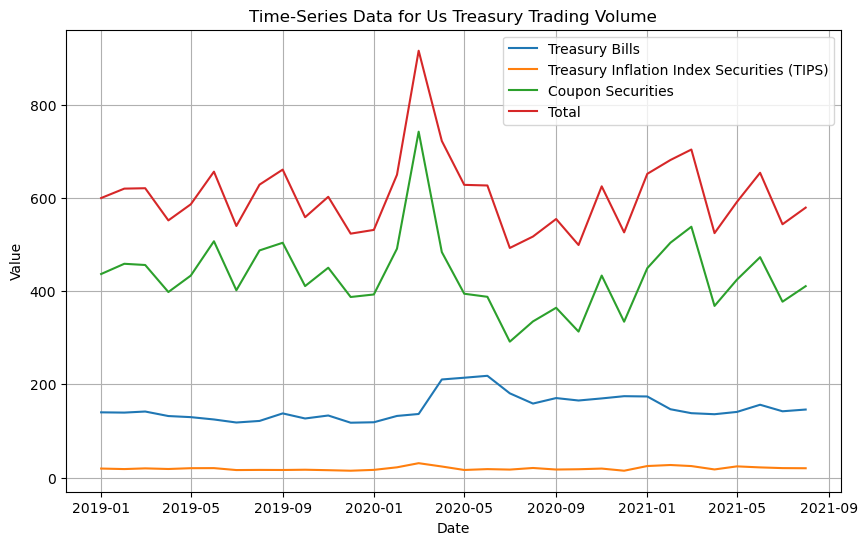

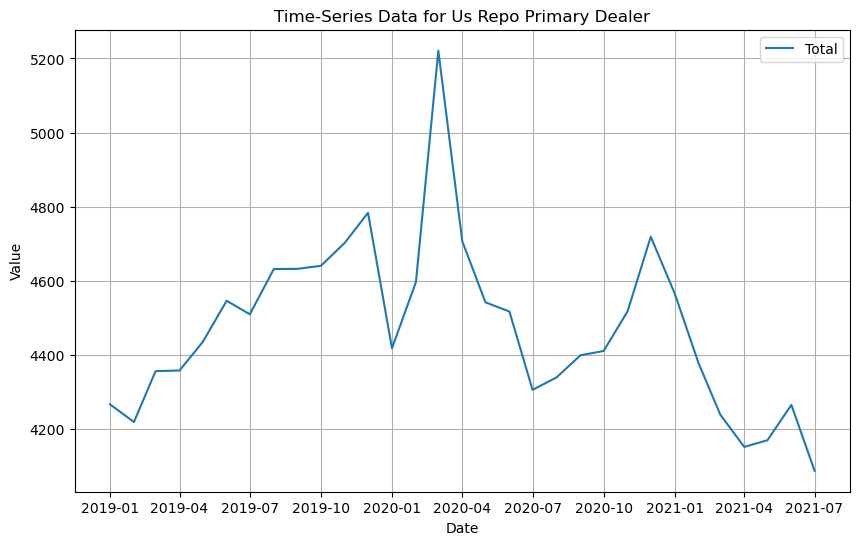

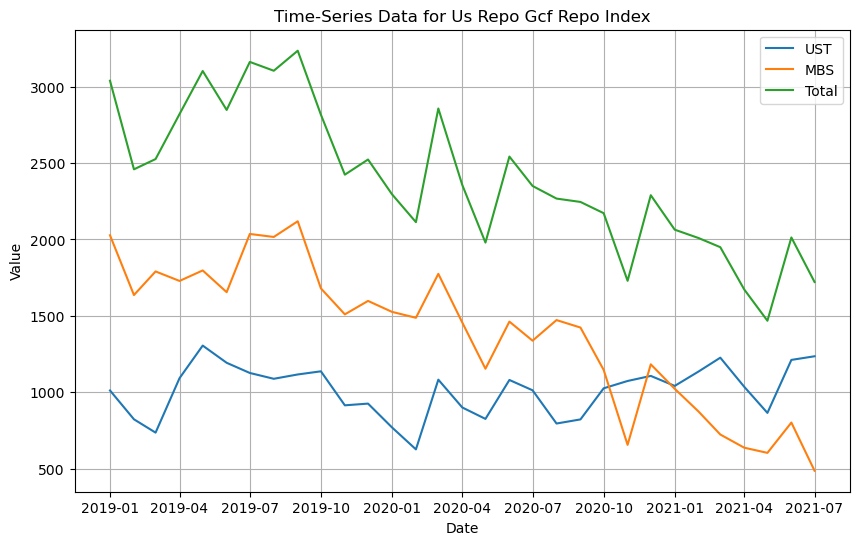

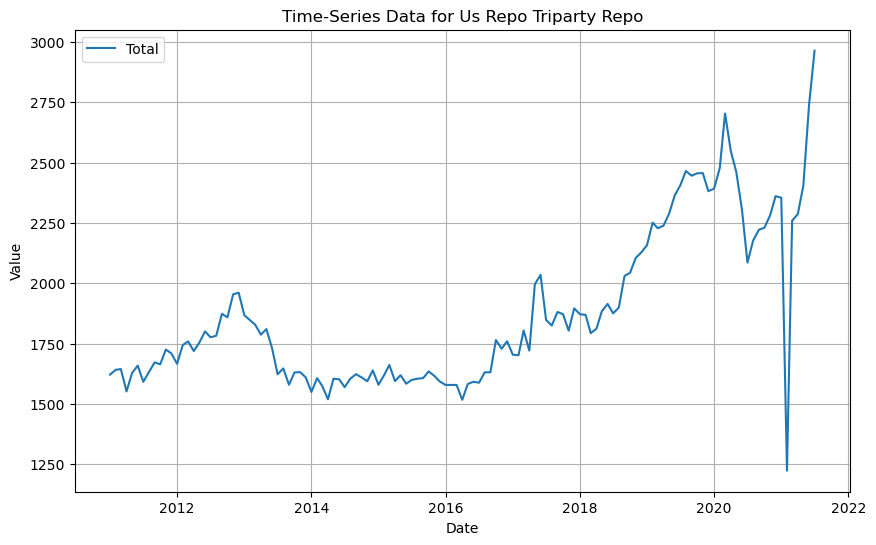

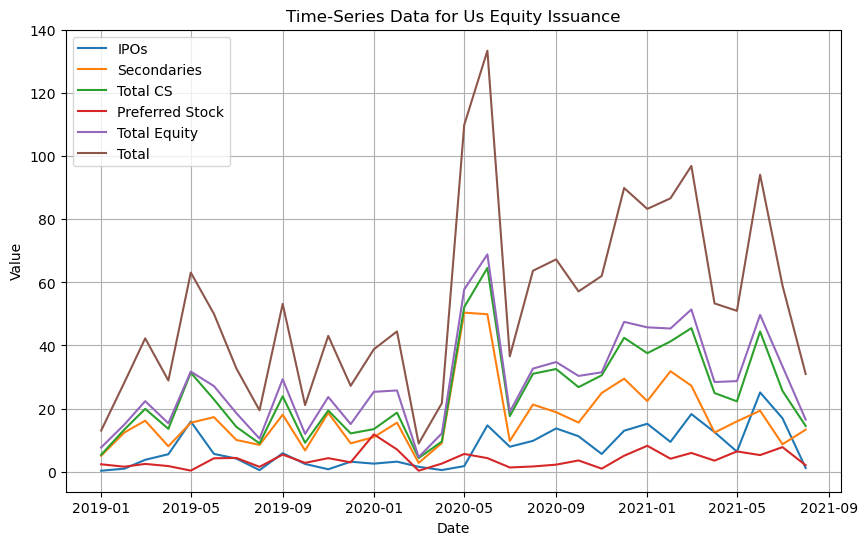

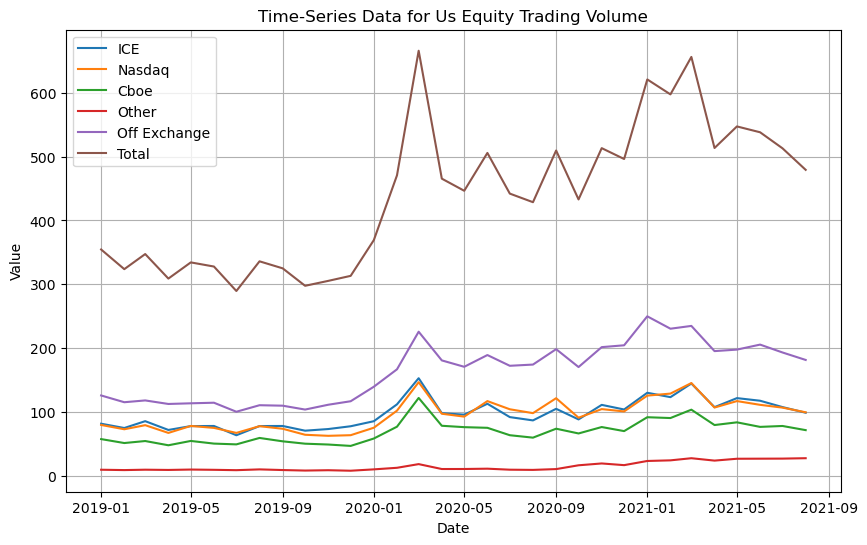

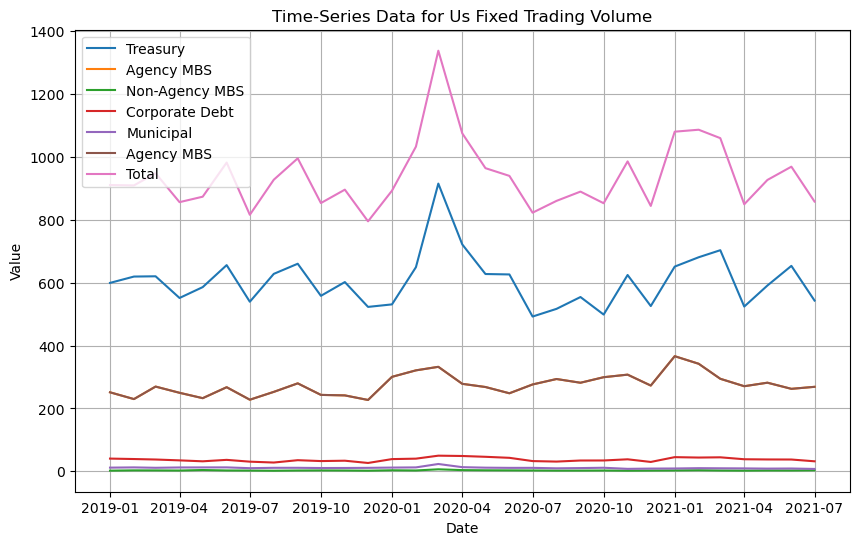

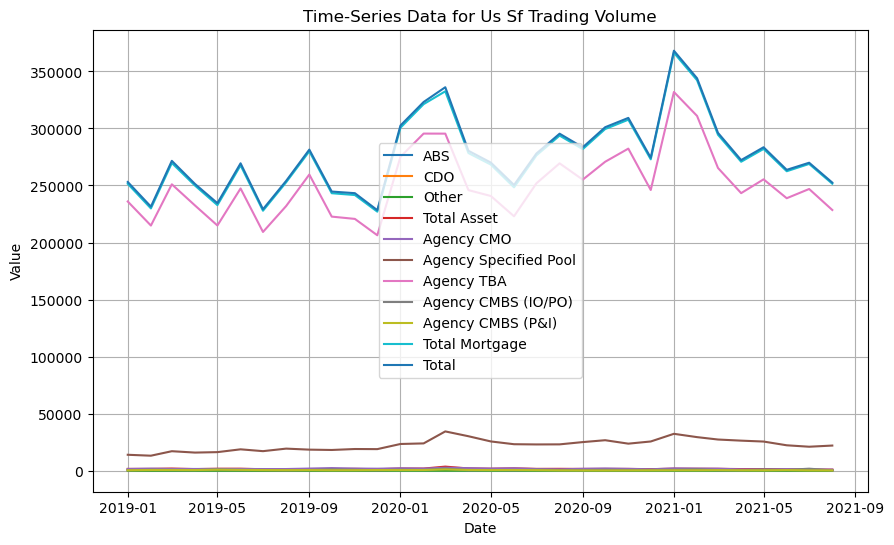

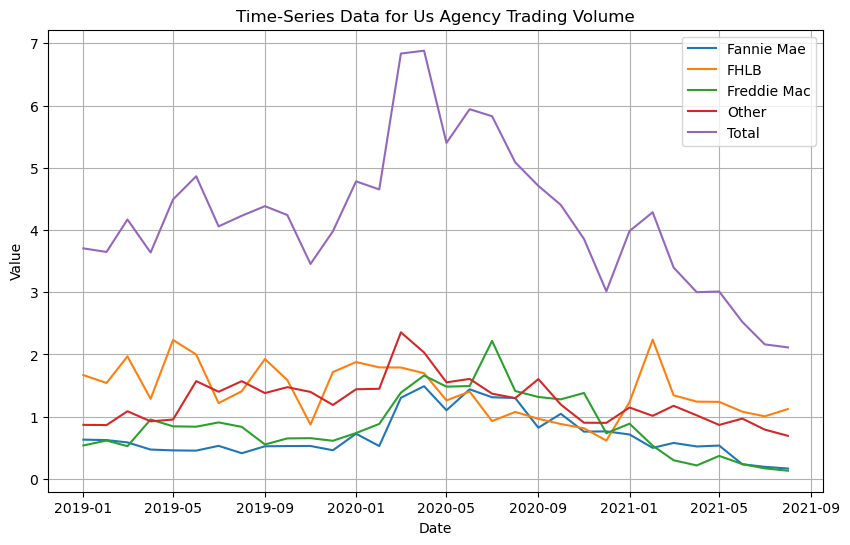

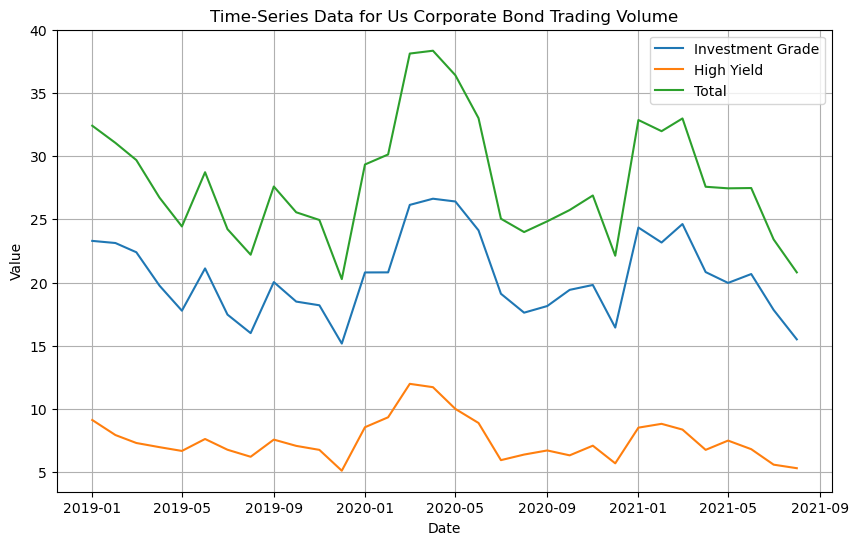

In [21]:
import os

image_path = "./Images/"
os.makedirs(image_path, exist_ok=True)

for name in dataframes:
    data = data_map[name]
    
    date_column = data.select_dtypes(include=['datetime', 'object']).columns[0]
    
    numeric_data = data.select_dtypes(include=['number']).dropna()
    
    plt.figure(figsize=(10, 6))
    plt.plot(data[date_column], numeric_data)
    
    plt.title(f"Time-Series Data for {name.replace('_', ' ').title()}")
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend(numeric_data.columns, loc='best')
    
    plt.grid(True)
    save_path = os.path.join(image_path, f"{name}.png")
    plt.savefig(save_path)
    plt.show()
    


## Do you see any patterns in the time-series? Is there any seasonality?

---

### 1. Trade Volume for US Treasuries

**Observation:** There is a notable peak and discernible patterns, but no obvious seasonality.

**Explanation:**  Rather than seasonal impacts, the early 2020 spike most likely represents market reactions to the COVID-19 pandemic.


---

### 2. Repo Primary Dealer

**Observation:**  There is a notable peak at the beginning of 2020, which is followed by a fall, but no discernible seasonality.

**Explanation:**  The rise most likely has no recurrent seasonal trend and is related to the stress on the financial markets during the COVID-19 epidemic.


---

### 3. Repo GCF Repo

**Observation:**  There is a downward trend after early 2020 with fluctuations, but no clear seasonality.

**Explanation:**  The decline after the early 2020 spike likely reflects market adjustments post-pandemic onset, without recurring seasonal patterns.

---

### 4. Repo Triparty Repo

**Observation:**  The series shows a general upward trend with significant volatility around 2020, including a sharp drop and rapid recovery.

**Explanation:**  The volatility likely corresponds to the COVID-19 pandemic's impact on markets. No clear seasonality is evident.

---

### 5. Equity Issuance

**Observation:**  The series has frequent spikes and drops, with a notable spike in mid-2020.

**Explanation:**  The mid-2020 spike likely reflects companies capitalizing on post-COVID market recovery and investor optimism in tech sector.

---

### 6. Equity Trading Volume

**Observation:**  The series shows a slight overall upward trend with a major spike in Q1 2020, followed by a rapid decline within the same quarter.

**Explanation:**  The Q1 2020 spike is likely due to the intense market volatility and trading activity during the onset of the COVID-19 pandemic, as investors reacted to the uncertainty and market disruptions.

---

### 7. Fixed Income Trading Volume

**Observation:**  The series shows a significant spike in Q1 2020, with Treasury and Agency MBS dominating the trading volume. Other categories like Non-Agency MBS, Corporate Debt, and Municipal have relatively lower volumes.

**Explanation:**  The spike in Q1 2020 reflects increased demand for safer assets like Treasury and Agency MBS during the COVID-19 pandemic, as investors sought security amid market uncertainty. The lower trading volumes in Non-Agency MBS, Corporate Debt, and Municipal securities suggest a flight to quality during this period.

---

### 8. Structured Finance Trading Volume

**Observation:**  The series is steady with a spike in January 2021, driven mainly by ABS and Agency TBA volumes.

**Explanation:**  The January 2021 spike likely reflects increased trading in ABS and Agency TBA due to favorable market conditions.

---

### 9. Agency Trading Volume

**Observation:**  The series shows a positive trend leading up to a spike in Q1 2020, followed by a negative trend afterward.

**Explanation:**  The Q1 2020 spike is likely due to heightened market activity during the early COVID-19 period, with the subsequent decline reflecting reduced trading as market conditions stabilized.

---

### 10. Corporate Bond Trading Volume

**Observation:**  Trading volume spiked in March 2020 and January 2021, with an overall neutral to slightly negative trend.

**Explanation:**  The spikes were due to market disruptions and adjustments, while the overall trend reflects stabilization or reduced activity after these peaks.


---



## Plot the data along with each of the macro-economic indicators that you selected? 


In [76]:
data_dict = {
    "us_treasury_trading_volume": us_treasury_trading_volume,
    "us_repo_primary_dealer": us_repo_primary_dealer,
    "us_repo_gcf_repo_index": us_repo_gcf_repo_index,
    "us_repo_triparty_repo": us_repo_triparty_repo,
    "us_equity_issuance": us_equity_issuance,
    "us_equity_trading_volume": us_equity_trading_volume,
    "us_fixed_trading_volume": us_fixed_trading_volume,
    "us_sf_trading_volume": us_sf_trading_volume,
    "us_agency_trading_volume": us_agency_trading_volume,
    "us_corporate_bond_trading_volume": us_corporate_bond_trading_volume
}

indicator_dict = {
    'JOLTS': jolts,
    'Retail_Sales': retail_sales,
    'Consumer_Sentiment': consumer_sentiment
    
}

## Do you see any patterns in the time-series? Is there any seasonality?

In [77]:
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import pandas as pd

def plot_all_series_with_macros_pct_change(data_dict, indicator_dict):
    for market, df in data_dict.items():
        
        plt.figure(figsize=(12, 6))
        
        last_column = df.columns[-1]
        df_pct_change = df[last_column].pct_change() * 100
        plt.plot(df["Date"], df_pct_change, label=f"{market} % Change")
        
        for name, macro in indicator_dict.items():
            macro_pct_change = macro[macro.columns[-1]].pct_change() * 100
            plt.plot(macro.index, macro_pct_change, label=f"{name} % Change")
        
        plt.title(f'Percentage Change of Time-Series Data for {market}')
        plt.xlabel('Date')
        plt.ylabel('Percentage Change (%)')
        
        # Custom date formatting
        plt.gca().xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: pd.to_datetime(x).strftime('%Y%m')))
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
        plt.gcf().autofmt_xdate()  # Rotate date labels
        
        plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='small')
        
        plt.grid(True)
        
        display(plt.gcf())
        plt.close()


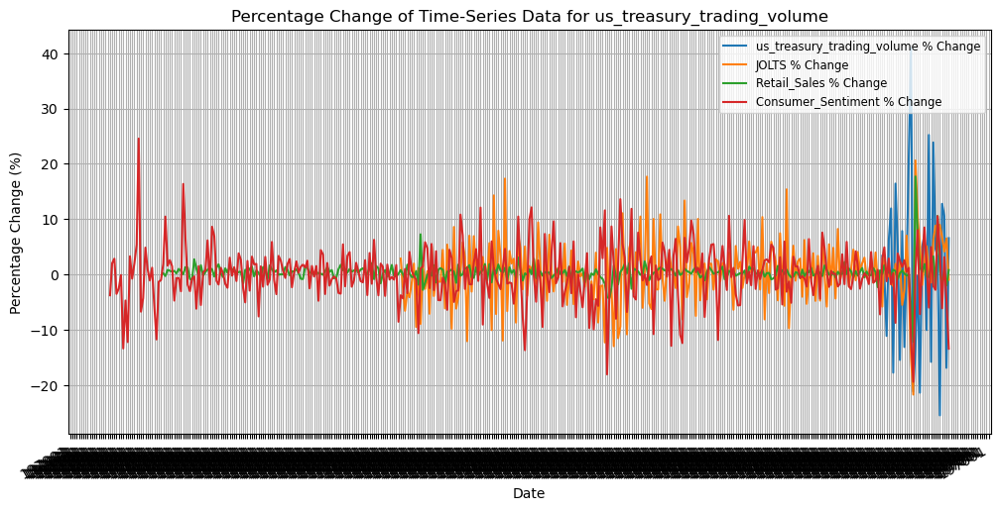

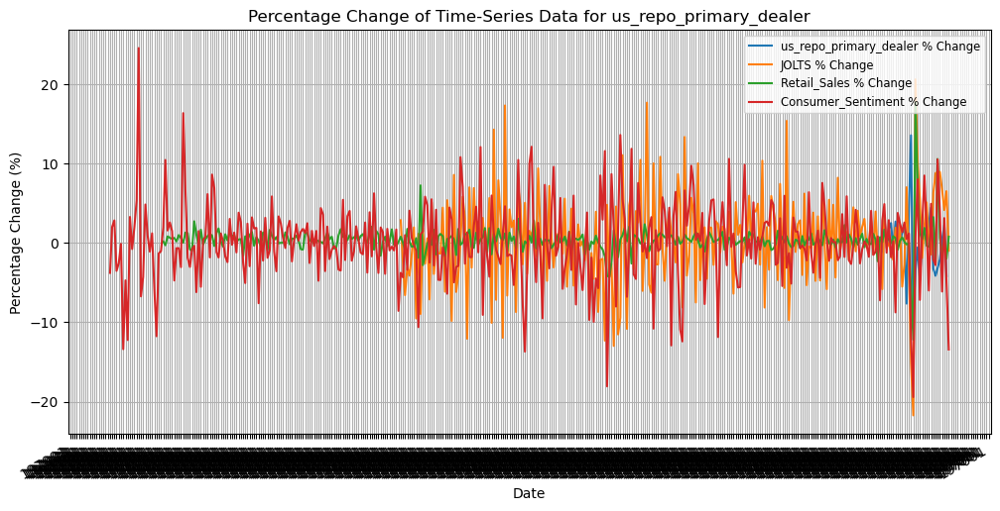

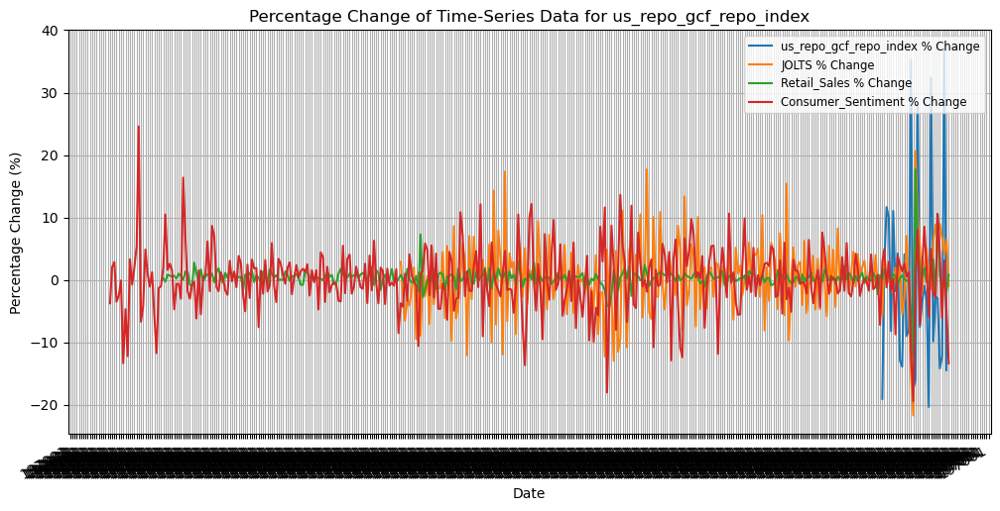

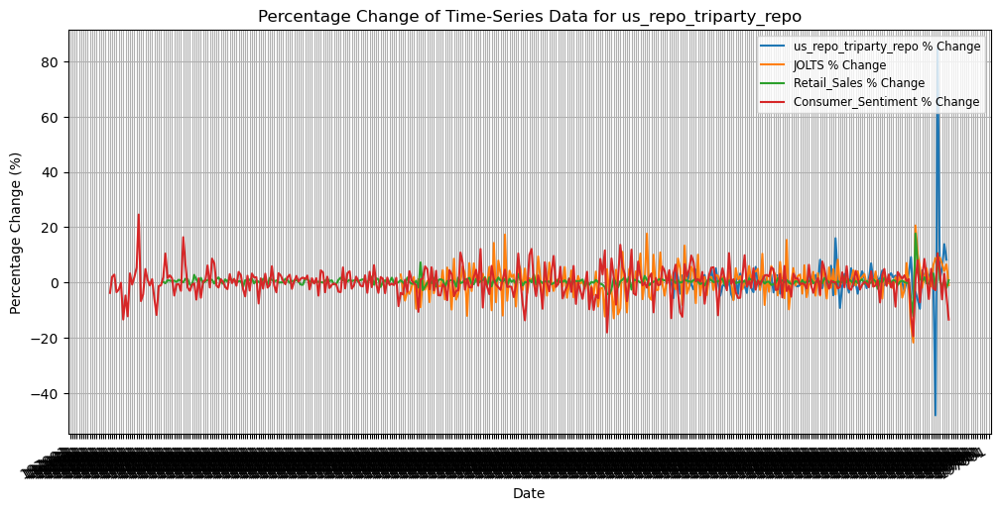

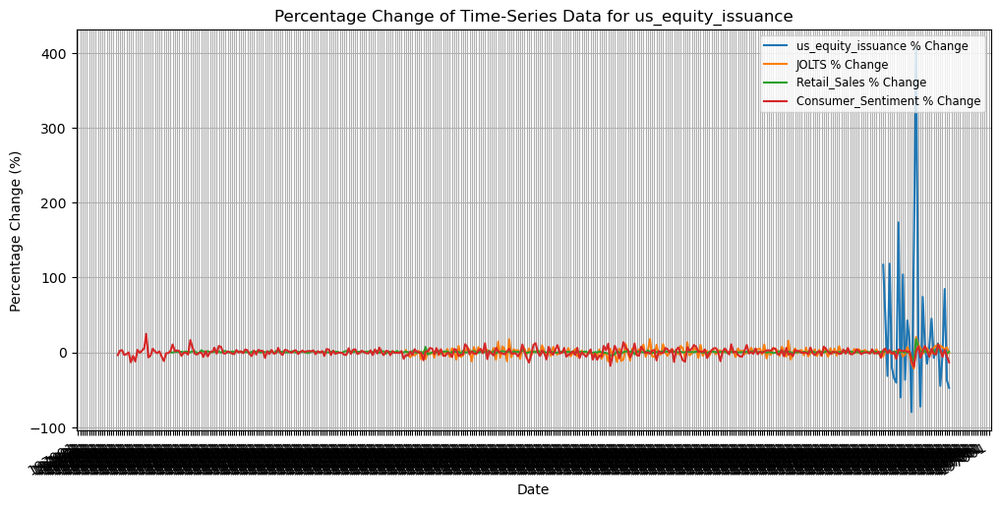

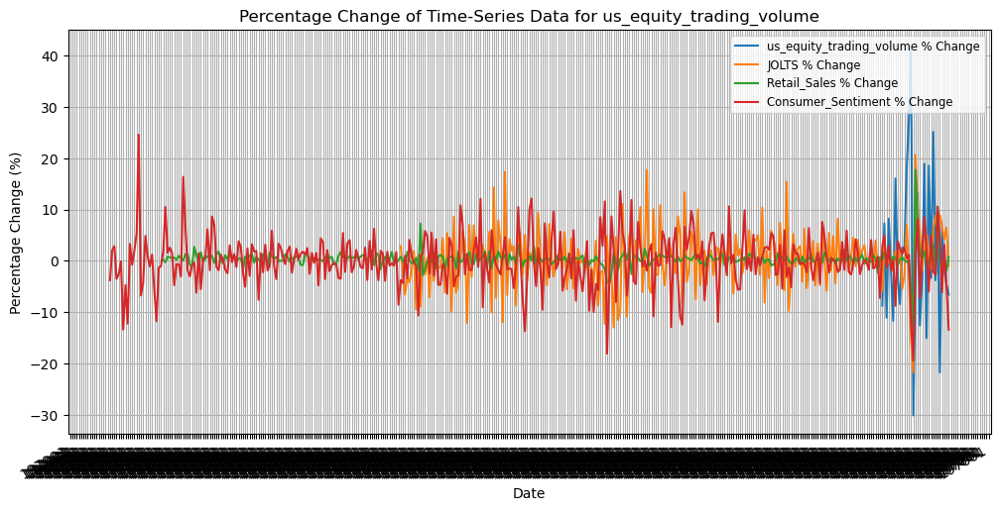

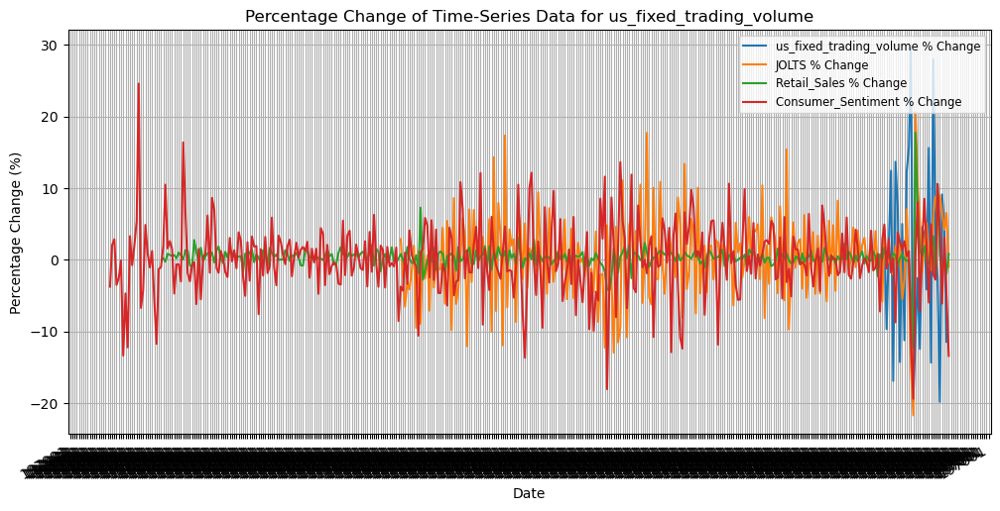

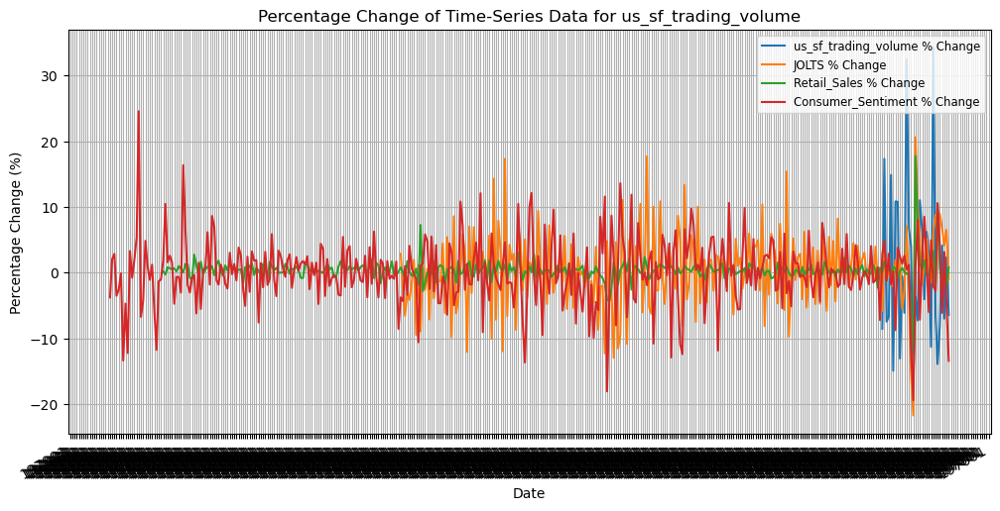

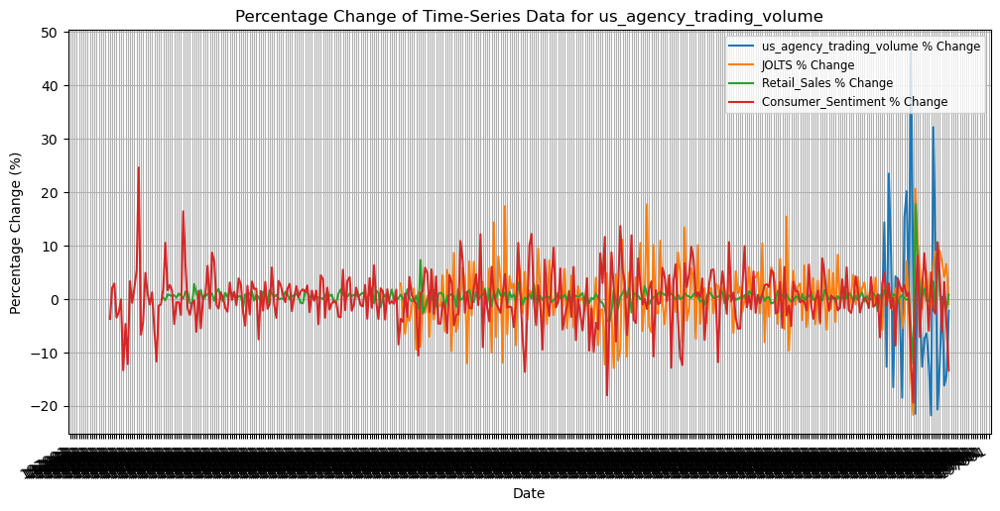

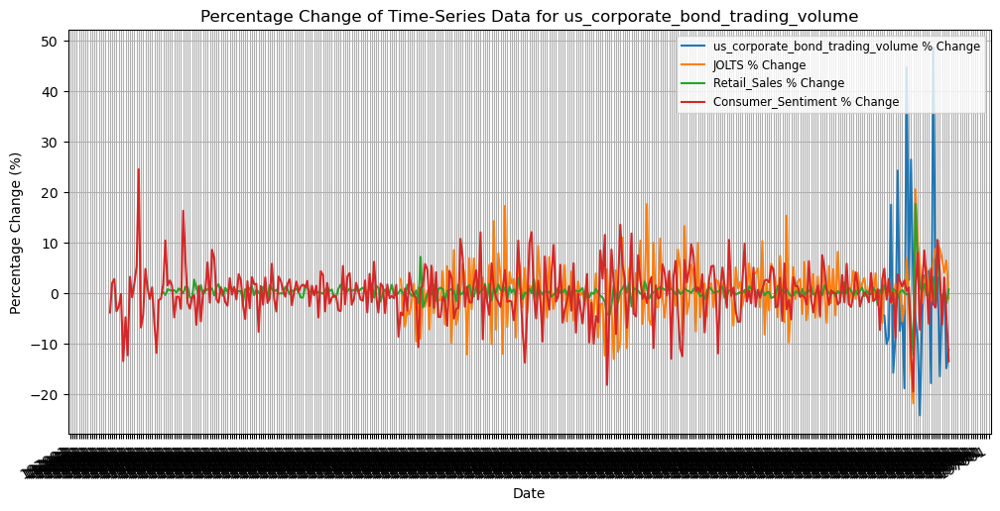

In [78]:
plot_all_series_with_macros_pct_change(data_dict, indicator_dict)

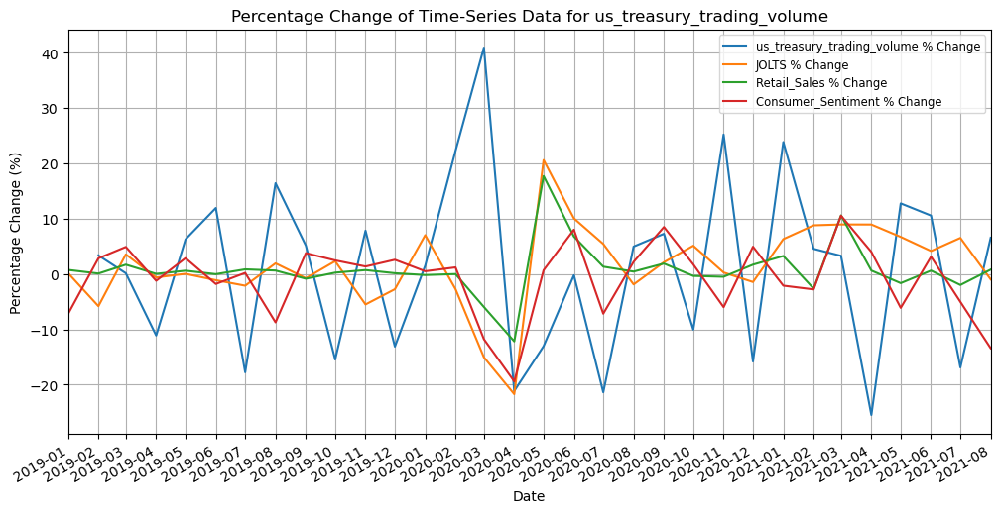

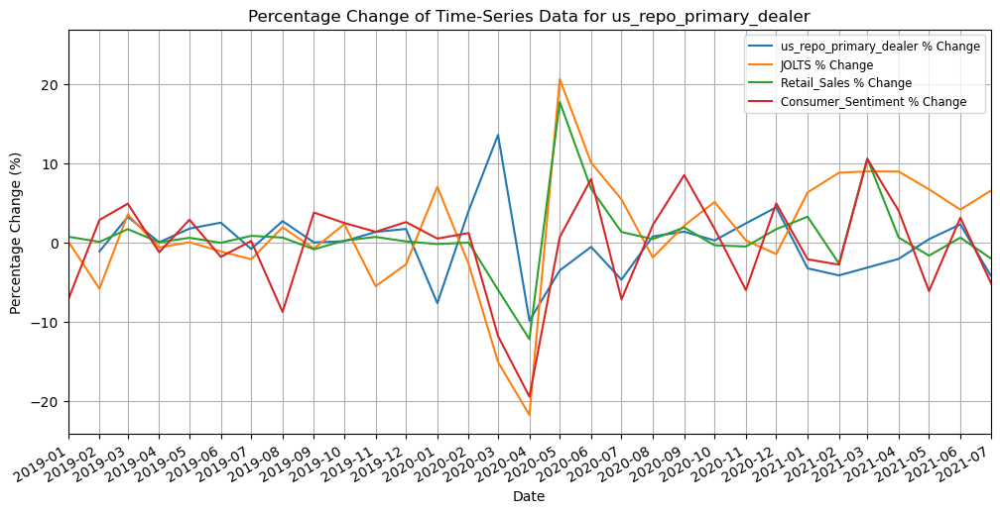

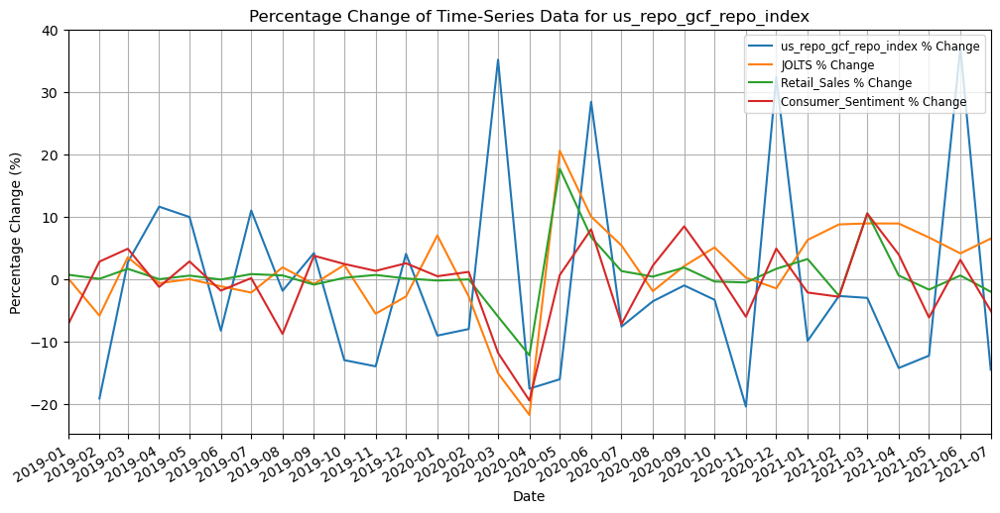

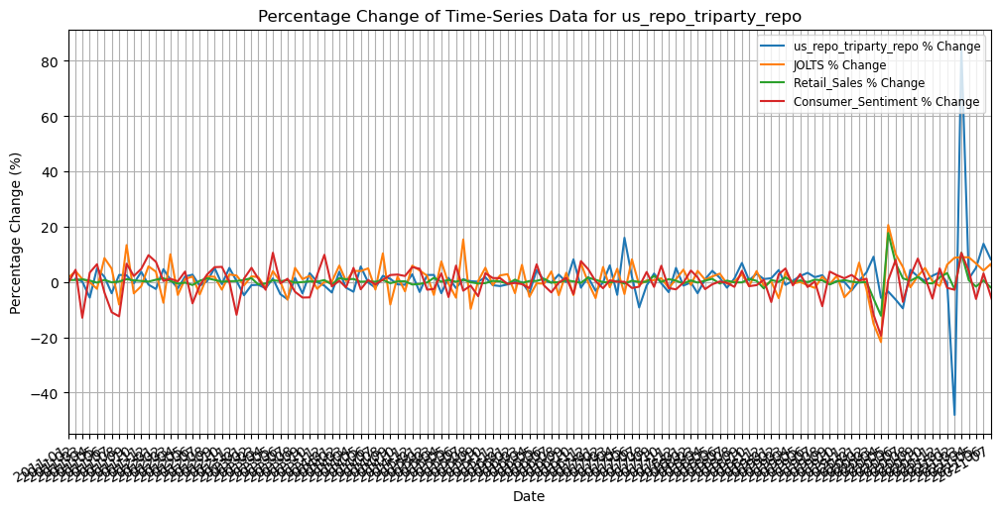

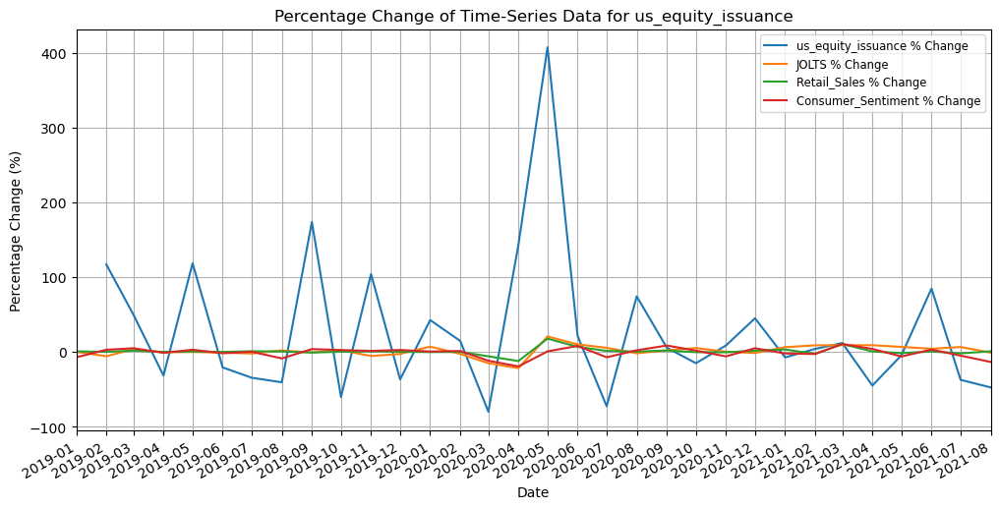

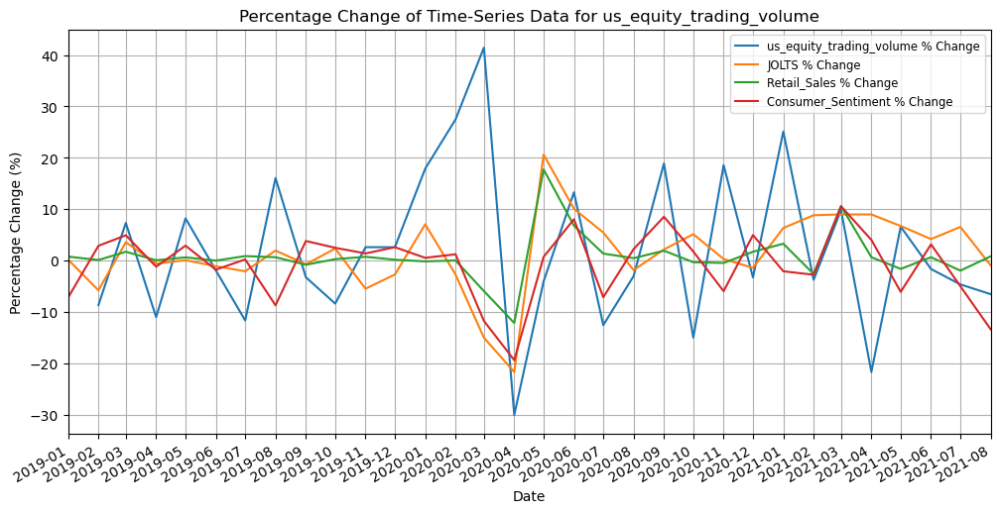

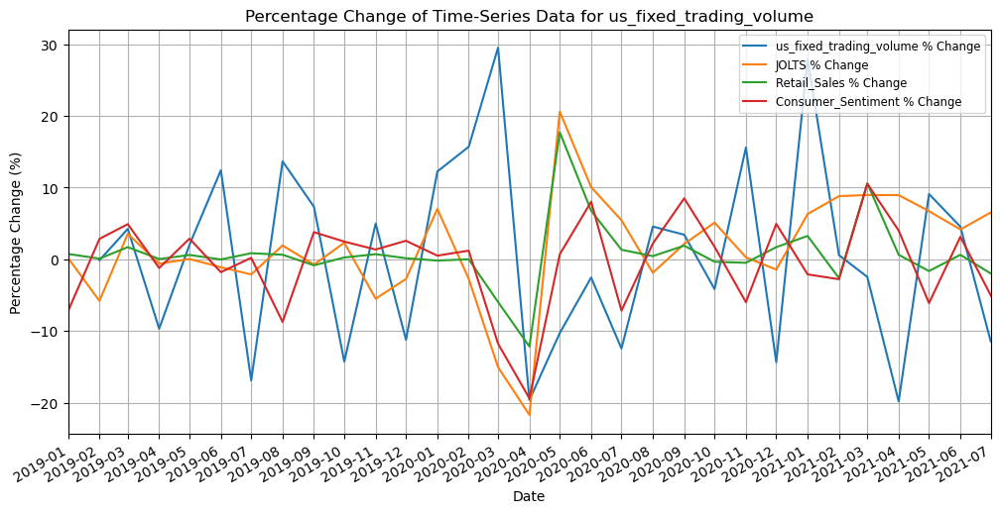

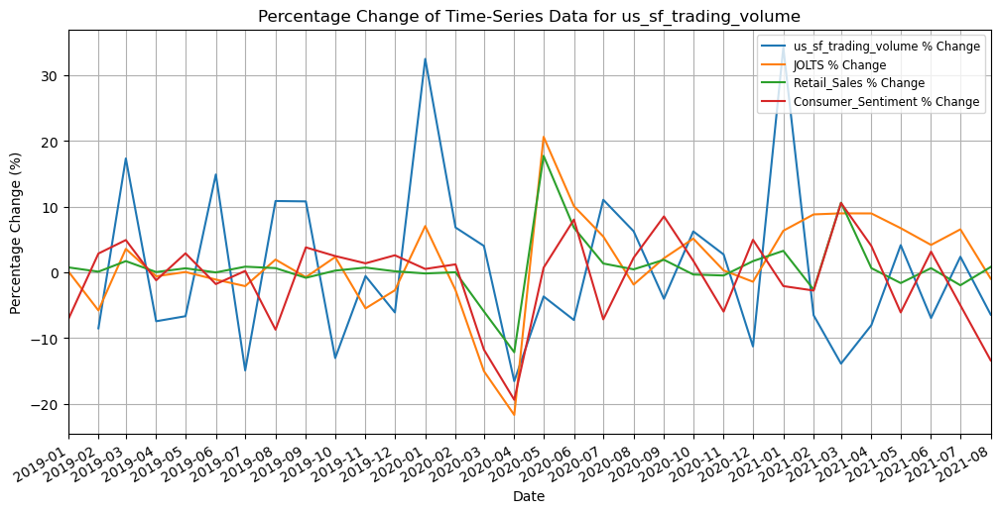

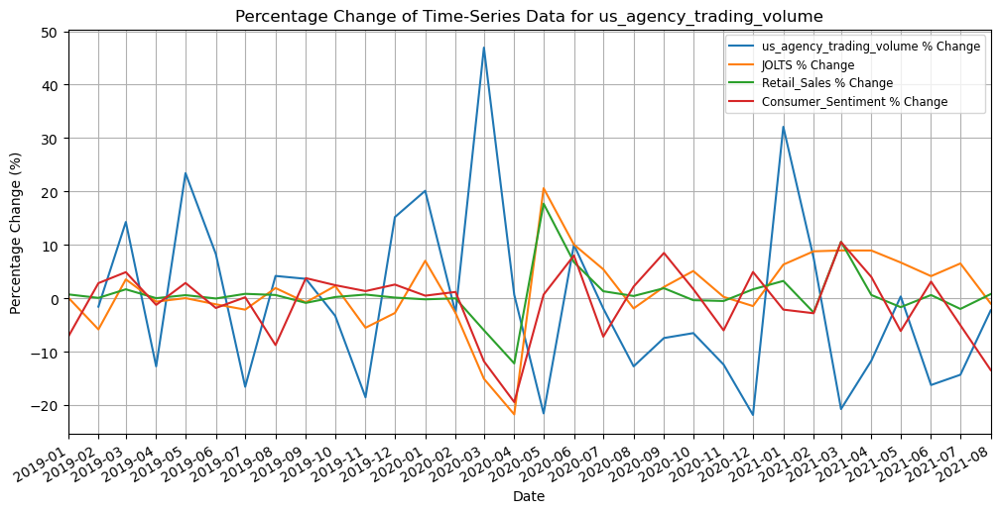

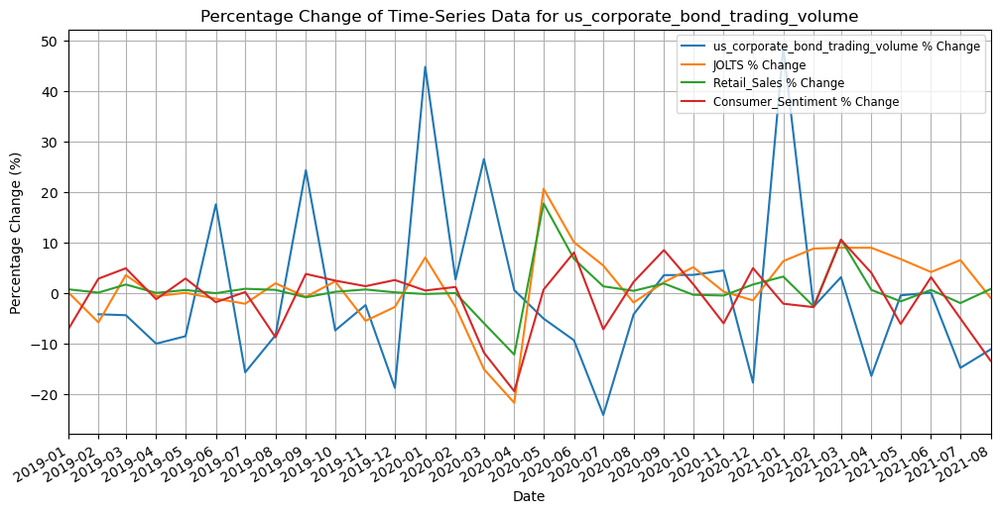

In [79]:
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.dates as mdates
import pandas as pd

def plot_all_series_with_macros_pct_change(data_dict, indicator_dict):
    for market, df in data_dict.items():
        plt.figure(figsize=(12, 6))
        
        df['Date'] = pd.to_datetime(df['Date'])
        last_column = df.columns[-1]
        df_pct_change = df[last_column].pct_change() * 100
        plt.plot(df['Date'], df_pct_change, label=f"{market} % Change")
        
        for name, macro in indicator_dict.items():
            macro.index = pd.to_datetime(macro.index)
            macro_pct_change = macro[macro.columns[-1]].pct_change() * 100
            plt.plot(macro.index, macro_pct_change, label=f"{name} % Change")
        
        plt.title(f'Percentage Change of Time-Series Data for {market}')
        plt.xlabel('Date')
        plt.ylabel('Percentage Change (%)')
        
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
        plt.gcf().autofmt_xdate()
        
        plt.xlim(df['Date'].min(), df['Date'].max())
        
        plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='small')
        plt.grid(True)
        
        display(plt.gcf())
        plt.close()

# Example usage
plot_all_series_with_macros_pct_change(data_dict, indicator_dict)


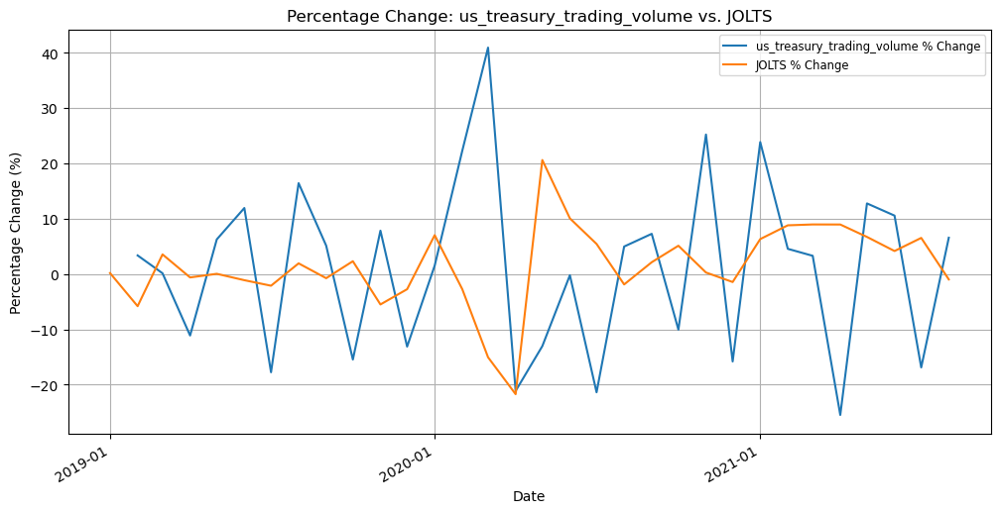

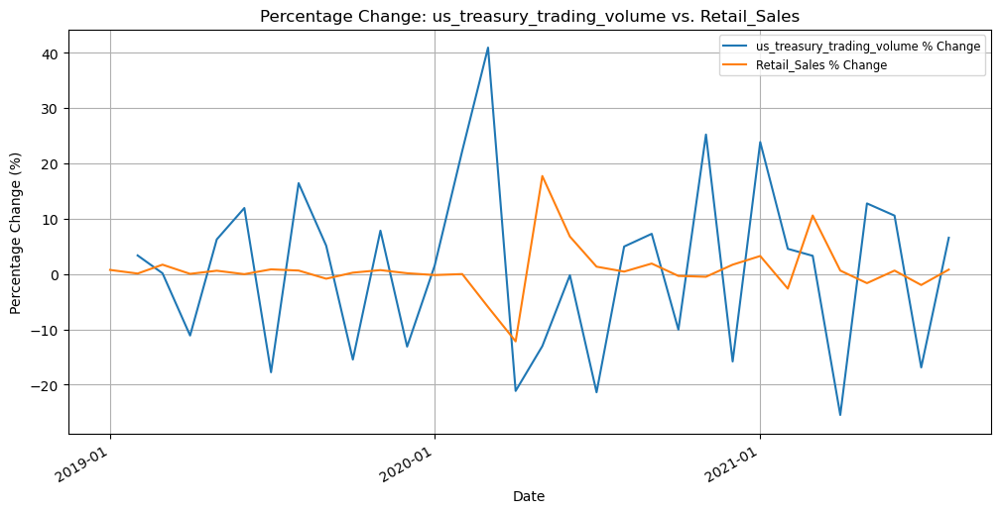

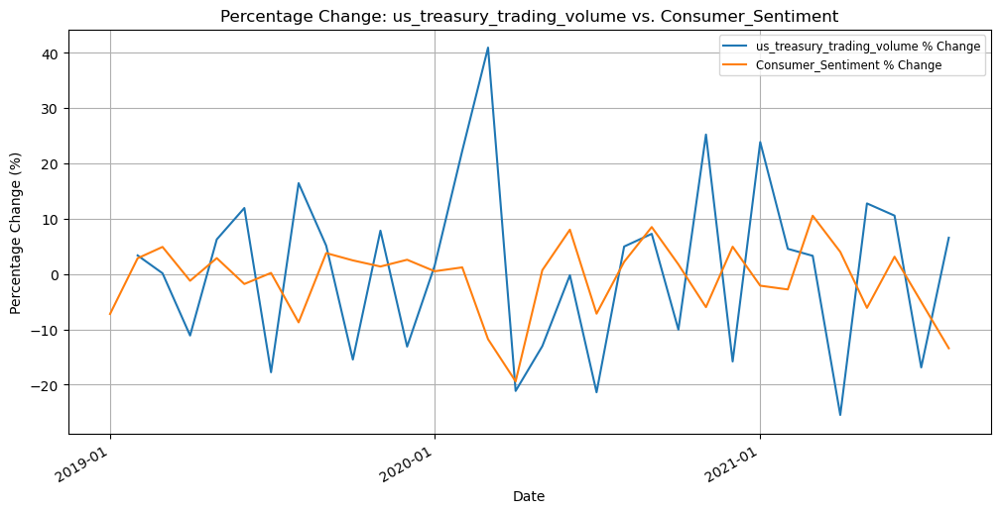

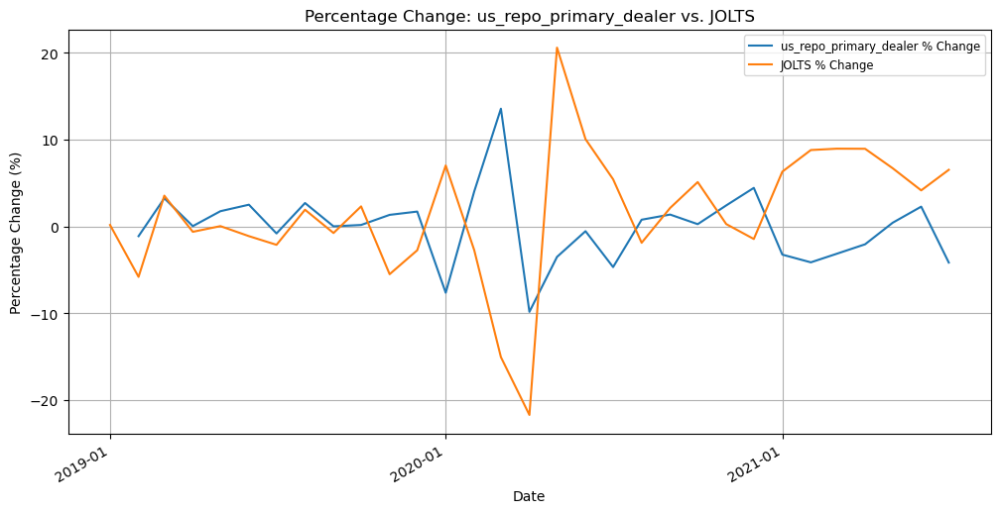

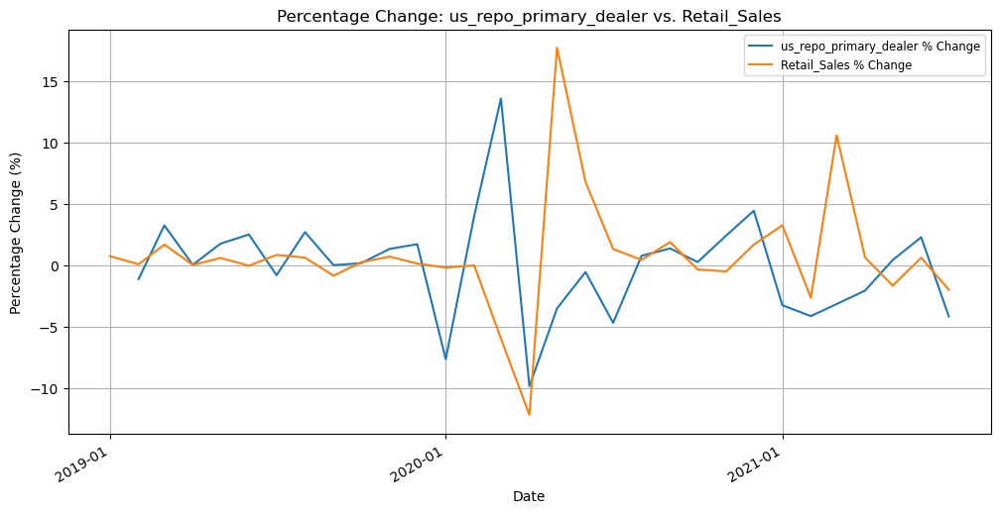

...

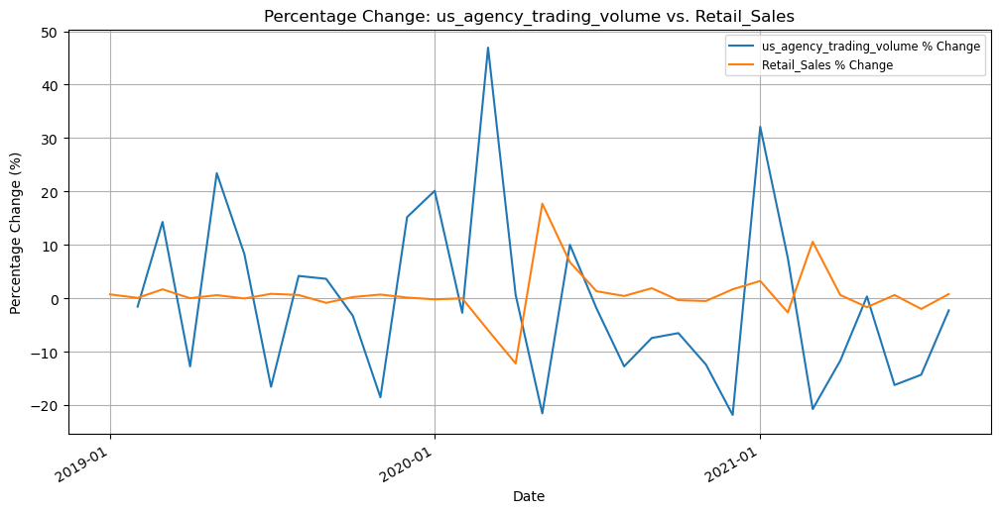

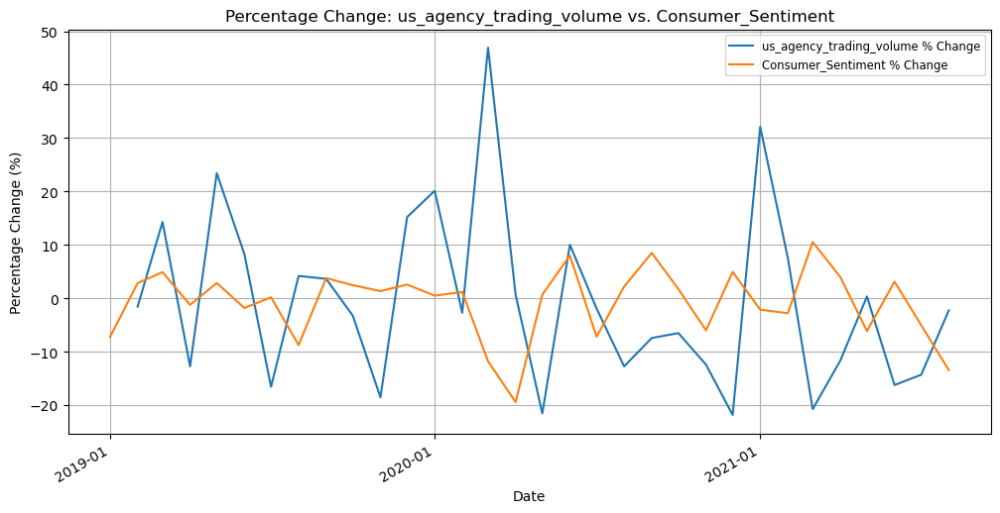

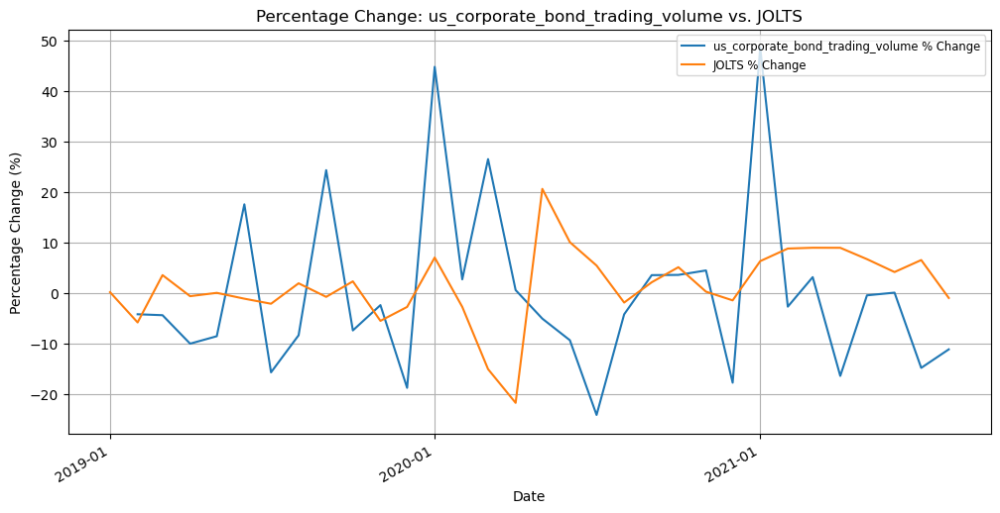

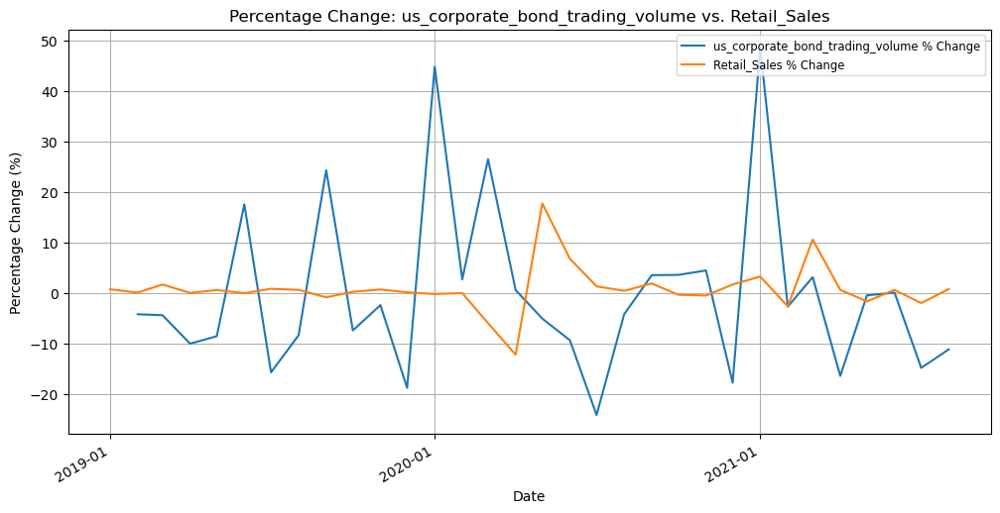

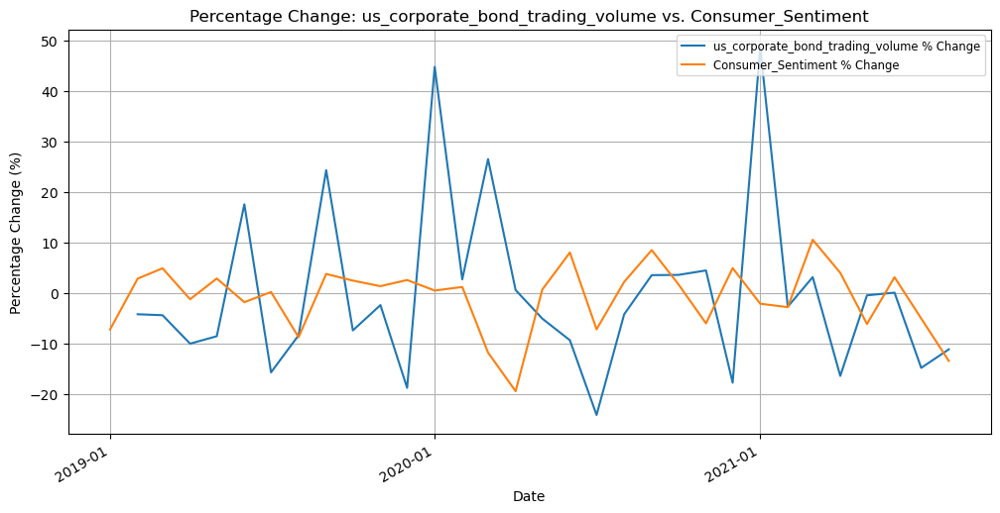

In [80]:
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.dates as mdates
import pandas as pd

def plot_individual_macros_with_market_pct_change(data_dict, indicator_dict):
    for market, df in data_dict.items():
        df['Date'] = pd.to_datetime(df['Date'])
        last_column = df.columns[-1]
        df_pct_change = df[[last_column, 'Date']].set_index('Date').pct_change() * 100
        
        for name, macro in indicator_dict.items():
            plt.figure(figsize=(12, 6))
            
            macro.index = pd.to_datetime(macro.index)
            macro_pct_change = macro[macro.columns[-1]].pct_change() * 100
            
            common_dates = df_pct_change.index.intersection(macro.index)
            df_aligned = df_pct_change.loc[common_dates]
            macro_aligned = macro_pct_change.loc[common_dates]
            
            plt.plot(df_aligned.index, df_aligned[last_column], label=f"{market} % Change")
            plt.plot(macro_aligned.index, macro_aligned, label=f"{name} % Change")
            
            plt.title(f'Percentage Change: {market} vs. {name}')
            plt.xlabel('Date')
            plt.ylabel('Percentage Change (%)')
            
            plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            plt.gca().xaxis.set_major_locator(mdates.YearLocator())
            plt.gcf().autofmt_xdate()
            
            plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='small')
            plt.grid(True)
            
            display(plt.gcf())
            plt.close()

# Example usage
plot_individual_macros_with_market_pct_change(data_dict, indicator_dict)

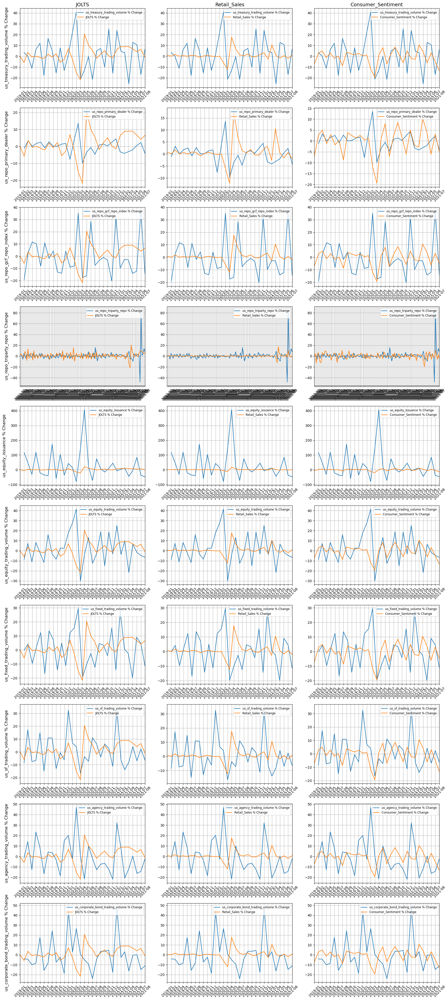

In [81]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

def plot_3x10_macros_with_market_pct_change(data_dict, indicator_dict):
    num_markets = len(data_dict)
    num_macros = len(indicator_dict)
    
    fig, axes = plt.subplots(num_markets, num_macros, figsize=(num_macros * 6, num_markets * 4), sharex=False)
    
    for i, (market, df) in enumerate(data_dict.items()):
        df['Date'] = pd.to_datetime(df['Date'])
        last_column = df.columns[-1]
        df_pct_change = df[[last_column, 'Date']].set_index('Date').pct_change() * 100
        
        for j, (name, macro) in enumerate(indicator_dict.items()):
            macro.index = pd.to_datetime(macro.index)
            macro_pct_change = macro[macro.columns[-1]].pct_change() * 100
            
            common_dates = df_pct_change.index.intersection(macro.index)
            df_aligned = df_pct_change.loc[common_dates]
            macro_aligned = macro_pct_change.loc[common_dates]
            
            ax = axes[i, j]
            ax.plot(df_aligned.index, df_aligned[last_column], label=f"{market} % Change")
            ax.plot(macro_aligned.index, macro_aligned, label=f"{name} % Change")
            
            if i == 0:
                ax.set_title(f"{name}", fontsize=14)
            
            if j == 0:
                ax.set_ylabel(f"{market} % Change", fontsize=12)
            
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.xaxis.set_major_locator(mdates.MonthLocator())
            ax.tick_params(axis='x', rotation=45)
            ax.set_xlim(df_aligned.index.min(), df_aligned.index.max())
            ax.grid(True)
            ax.legend(loc='upper right', fontsize='small')
    
    plt.tight_layout()
    save_path = os.path.join("./Images/Jolts-Retail Sales-Consumer Sentiment.png")
    plt.savefig(save_path)
    plt.show()

# Example usage
plot_3x10_macros_with_market_pct_change(data_dict, indicator_dict)

## Do you see any patterns in the time-series? Is there any seasonality?

---
## Are there any patterns that you can observe? Give a brief explanation for your findings

### 1. Treasury Trading Volume and GDP

**Observation:** There are discernible surges in the volume of Treasury trade, especially at times of economic concern or major market events. There doesn't seem to be a discernible or reliable seasonal trend, though.

**Explanation:** Investors' flight to safety is seen in the surges in Treasury trading volume that frequently occur during times of economic stress or extreme volatility. Rather of following a dependable seasonal pattern, these movements may be influenced by significant economic data releases, geopolitical events, or policy changes.

---

### 2. Equity Issuance and Unemployment
**Observation:** There is typically a lack of seasonality in the issue of equity, with huge fluctuations. With regard to unemployment rates, there is no obvious negative relationship.

**Explanation:** The issuing of equity is subject to fluctuations in market conditions, investor sentiment, and business finance requirements. Companies may issue more equity during times of economic expansion or low unemployment, although this does not always correspond to unemployment rates.


---

### 3. Equity Trading Volume, Unemployment, and Fed Funds Rate
**Observation:** Equity trading volumes show high volatility with no apparent seasonal pattern. These volumes often spike during major market events or policy changes by the Federal Reserve.

**Explanation:** Equity trading volumes are sensitive to changes in market conditions, interest rate policies, and broader economic signals. The Fed Funds Rate influences investor behavior, often resulting in heightened trading activity during rate announcements or adjustments.

---

### 4. Fixed Income Trading Volume and Economic Uncertainty
**Observation:** Fixed income trading volume shows spikes, often aligning with periods of economic uncertainty or market turbulence, rather than seasonal patterns.

**Explanation:** Investors tend to move into fixed income securities during periods of uncertainty, which increases trading volumes. The lack of seasonality suggests that these movements are primarily event-driven rather than cyclical.

---

## Macro-economic relationships

**Unemployment:** While they don't show much seasonality, they do react to more general economic patterns and events, like recessions and booms.

**Macro Indicator 2:** Retail sales frequently exhibit seasonality, peaking during large sales occasions or holiday seasons, which is indicative of consumer purchasing patterns.

**Macro Indicator 3:** Consumer Sentiment varies with the state of the economy, frequently falling in uncertain or downturning times. There is some seasonality; optimism is typically seen at the start of the year or at times when the economy is doing well.


---

In [82]:
type(us_repo_primary_dealer)

pandas.core.frame.DataFrame

## What is the correlation across various securities in that particular market (say across various treasury based on tenor)?

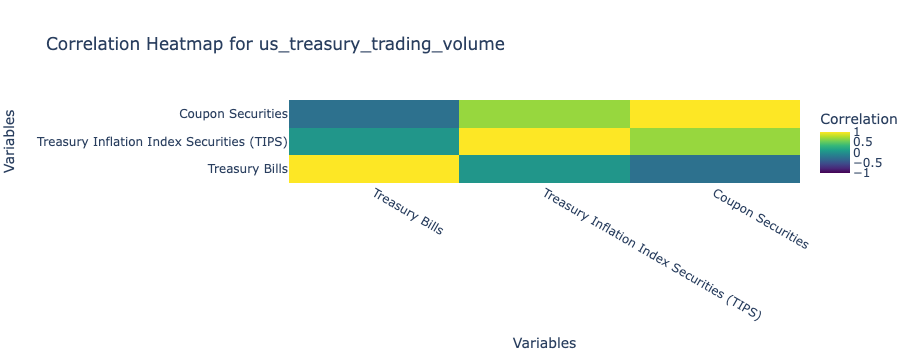

Skipping us_repo_primary_dealer as it has only 1 series.


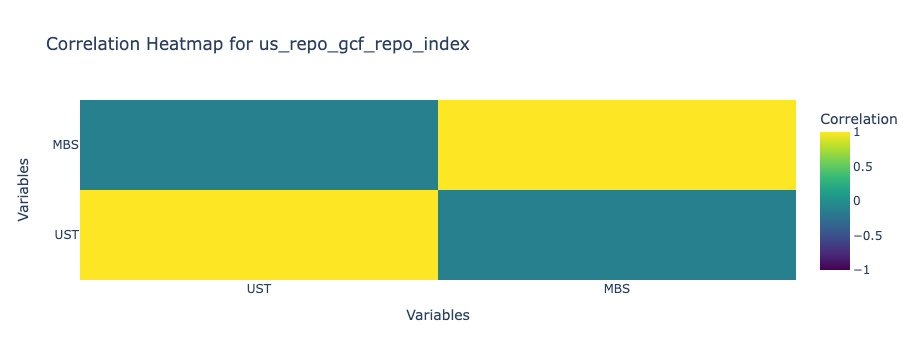

Skipping us_repo_triparty_repo as it has only 1 series.


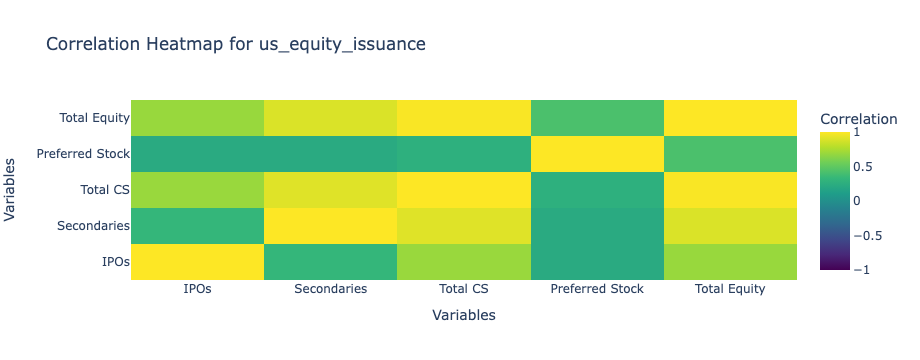

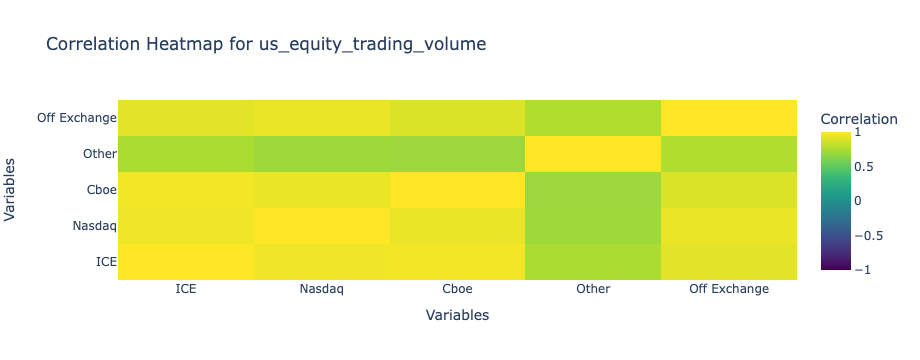

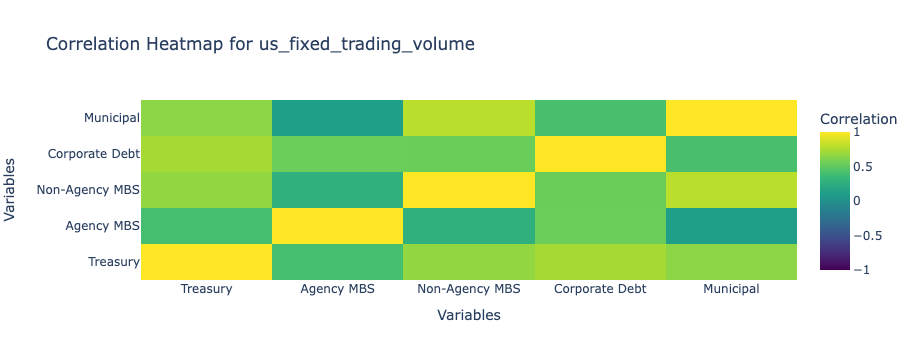

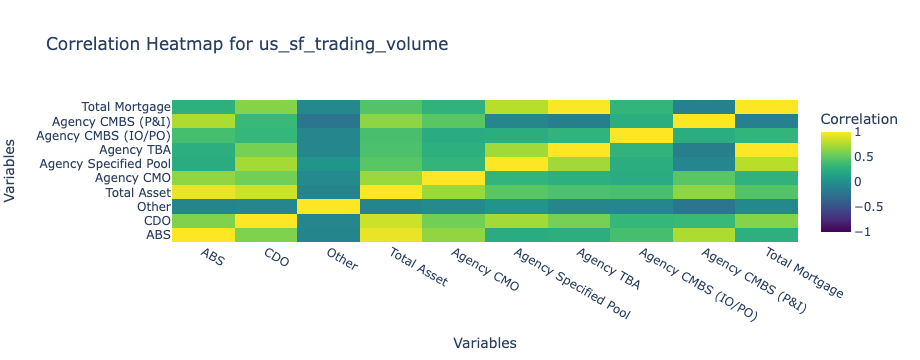

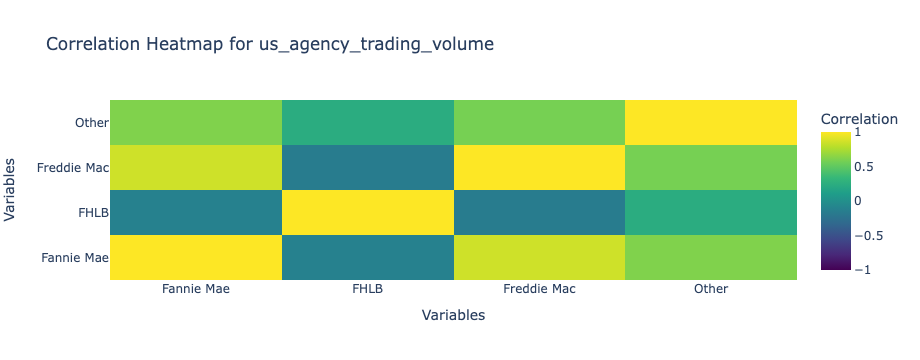

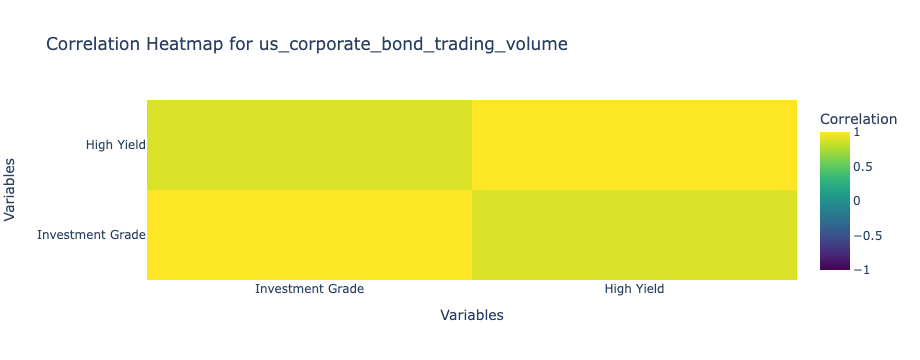

In [83]:
import plotly.graph_objects as go

def plot_individual_correlation_heatmaps(data_dict):
    for name, df in data_dict.items():
        if 'Date' in df.columns:
            df = df.drop(columns=['Date'])
        if 'Total' in df.columns:
            df = df.drop(columns=['Total'])
        
        if df.shape[1] <= 1:
            print(f"Skipping {name} as it has only {df.shape[1]+1} series.")
            continue
        
        correlation_matrix = df.corr()
        
        heatmap = go.Heatmap(
            z=correlation_matrix.values,
            x=correlation_matrix.columns,
            y=correlation_matrix.columns,
            colorscale='Viridis',
            colorbar=dict(title='Correlation'),
            zmin=-1, zmax=1
        )
        
        fig = go.Figure(data=heatmap)
        
        fig.update_layout(
            title=f'Correlation Heatmap for {name}',
            xaxis_title='Variables',
            yaxis_title='Variables',
            xaxis=dict(tickmode='array', tickvals=list(range(len(correlation_matrix.columns))), ticktext=correlation_matrix.columns),
            yaxis=dict(tickmode='array', tickvals=list(range(len(correlation_matrix.columns))), ticktext=correlation_matrix.columns),
            autosize=True
        )
        
        fig.show()

# Example usage
plot_individual_correlation_heatmaps(data_dict)


## What is the correlation in the trading activity across various security markets (consider the aggregate trading volume in each security market for the cross-market correlations)? Discuss your observations

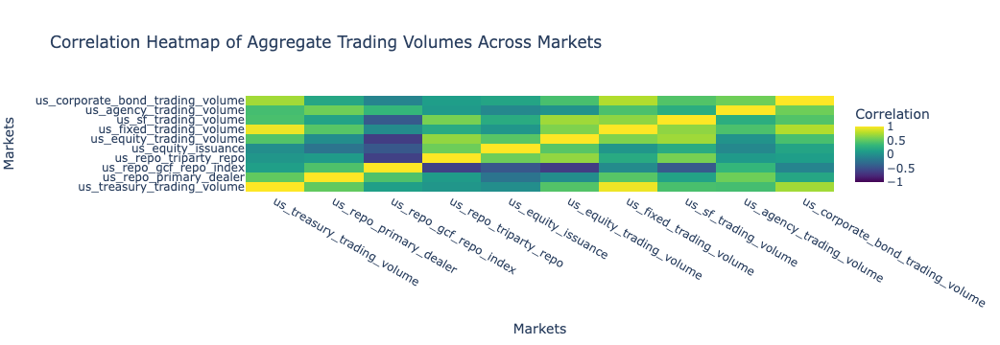

In [84]:
import pandas as pd
import plotly.graph_objects as go

def aggregate_total_trading_volume(data_dict):
    total_data = {}
    
    for name, df in data_dict.items():
        if 'Total' in df.columns:
            total_data[name] = df['Total']
        else:
            print(f"'Total' column not found in {name}. Skipping...")
    
    combined_df = pd.DataFrame(total_data)
    
    return combined_df

def plot_total_trading_volume_heatmap(data_dict):
    combined_df = aggregate_total_trading_volume(data_dict)
    correlation_matrix = combined_df.corr()
    
    heatmap = go.Heatmap(
        z=correlation_matrix.values,
        x=correlation_matrix.columns,
        y=correlation_matrix.columns,
        colorscale='Viridis',
        colorbar=dict(title='Correlation'),
        zmin=-1, zmax=1
    )

    fig = go.Figure(data=heatmap)
    
    fig.update_layout(
        title='Correlation Heatmap of Aggregate Trading Volumes Across Markets',
        xaxis_title='Markets',
        yaxis_title='Markets',
        xaxis=dict(tickmode='array', tickvals=list(range(len(correlation_matrix.columns))), ticktext=correlation_matrix.columns),
        yaxis=dict(tickmode='array', tickvals=list(range(len(correlation_matrix.columns))), ticktext=correlation_matrix.columns),
        autosize=True
    )
    image_path = './Images/Correlation Heatmap of Aggregate Trading Volumes Across Markets.png'
    fig.write_image(image_path)
    fig.show()

# Example usage
plot_total_trading_volume_heatmap(data_dict)


## Cross-Market Trading Activity Correlations: Observations and Implications

### 1. Treasury Trading Volume
**Observation**:  Treasury trading volume shows moderate to high positive correlations with other fixed income markets, such as repo markets and fixed trading volumes, but lower correlations with equity-related markets.

**Explanation**: Treasury trading activity is often driven by interest rate changes, economic uncertainty, and government policies, making it more closely tied to other fixed income securities. The lower correlation with equities reflects the contrasting nature of Treasuries as a safe-haven asset compared to riskier assets like stocks.

---

### 2. Equity Issuance Volume
**Observation**: Equity issuance volume exhibits low to moderate correlations with other trading volumes, indicating that its movement is not closely tied to other markets.

**Explanation**: Equity issuance is primarily influenced by company-specific factors, investor sentiment, and broader market conditions rather than direct market-to-market interactions. Companies tend to issue equity when market conditions are favorable, regardless of trading activities in other sectors.

---

### 3. Equity Trading Volume
**Observation**: Equity trading volume has moderate correlations with other trading volumes, particularly with structured finance and corporate bond trading, indicating some interconnectedness.

**Explanation**: Equity trading volumes are influenced by broader market liquidity, investor risk appetite, and economic conditions, which can spill over into other markets, such as corporate bonds and structured finance products. These correlations suggest that when investor confidence is high, it can boost activity across these related markets.

---

### 4. Fixed Trading Volume
**Observation**: Fixed trading volume is highly correlated with Treasury and other fixed-income-related markets, showing strong interconnectedness within the bond market.

**Explanation**: Fixed trading volumes reflect investor activity in bonds and other fixed-income securities, driven by changes in interest rates, economic data, and monetary policy. This inter-market correlation highlights the integrated nature of fixed-income markets, where movements in one sector often impact others.

---

### 5. Structured Finance Trading
**Observation**:  Structured finance trading volume shows moderate correlations with equity and corporate bond markets, indicating a link between these credit-sensitive products.

**Explanation**: Structured finance products, such as asset-backed securities, are sensitive to credit conditions and investor risk tolerance. Their moderate correlations with equities and corporate bonds suggest that they are affected by broader credit market trends and investor sentiment.

---

### 6. Agency Trading Volume
**Observation**: Agency trading volume shows moderate correlations with Treasury and other fixed income markets, but lower correlations with equity-related markets.

**Explanation**: Agency securities, such as those issued by government-sponsored enterprises, are generally considered safe investments, closely tied to Treasuries. Their moderate correlation with other fixed income markets underscores their role as a lower-risk alternative within the broader bond market.

---

### 7. Corporate Bond Trading Volume
**Observation**:  Corporate bond trading volume has moderate to high correlations with equity, structured finance, and fixed-income markets, highlighting its role as a bridge between credit and equity markets.

**Explanation**: Corporate bonds are influenced by both credit conditions and broader market risk sentiment, making them highly interconnected with other markets. When market conditions are favorable, corporate bonds often see increased trading alongside equities and other credit-sensitive securities.

---



# Download annual data for issuance statistics for

1. **US Marketable Treasury Issuance, Outstanding, and Interest Rates**
2. **US MBS Issuance and Outstanding**
3. **US ABS Issuance and Outstanding**
4. **US Fixed Income Issuance and Outstanding**
5. **US ABCP and CP Outstanding**
6. **US Municipal Issuance**
7. **US Corporate Bond Issuance**

## We have done this for you

---

## US Marketable Treasury Issuance, Outstanding, and Interest Rates

---

In [85]:
us_treasury_issuance = (
    pd.read_excel(r'./data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Issuance Net", header=8)
    .head(21)
    .rename(columns={'Unnamed: 0': 'Date',
                     "Net" : "Bills", 
                     "Net.1" : "Notes",
                     "Net.2" : "Bonds",
                     "Net Cash Raised": "Total"
                    })
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Bills", "Notes", "Bonds", "Total"]])
)

us_treasury_issuance

,Date,Bills,Notes,Bonds,Total
0,2000-01-01,-90.2160,-183.563,-12.157000,-285.936000
1,2001-01-01,164.3920,-164.698,-16.840000,-17.146000
2,2002-01-01,77.5180,171.065,-14.242000,234.341000
3,2003-01-01,40.0360,350.898,-24.343000,366.591000
4,2004-01-01,74.3730,303.222,-13.871000,363.724000
5,2005-01-01,-39.3070,255.674,-5.926000,210.441000
6,2006-01-01,-19.6620,138.242,34.061000,152.641000
7,2007-01-01,59.7380,75.097,44.339000,179.174000
8,2008-01-01,862.6940,328.300,51.736000,1242.730000
9,2009-01-01,-73.2320,1413.266,137.441000,1477.475000


In [86]:
us_treasury_outstanding = (
    pd.read_excel(r'./data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Outstanding", header=7)
    .head(31)
    .rename(columns={'Unnamed: 0': 'Date'})
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Bills", "Notes", "Bonds", "TIPS", "FRN", "Total"]])
)

us_treasury_outstanding

,Date,Bills,Notes,Bonds,TIPS,FRN,Total
0,1990-01-01,527.415,1265.215,388.170,NaN,NaN,2180.800
1,1991-01-01,590.389,1430.784,435.473,NaN,NaN,2456.646
2,1992-01-01,657.661,1608.929,472.524,NaN,NaN,2739.114
3,1993-01-01,714.631,1763.989,495.855,NaN,NaN,2974.475
4,1994-01-01,733.753,1866.986,510.296,NaN,NaN,3111.035
5,1995-01-01,760.680,2010.340,521.158,NaN,NaN,3292.178
6,1996-01-01,777.414,2112.315,554.962,NaN,NaN,3444.691
7,1997-01-01,715.394,2106.049,587.335,33.039,NaN,3441.817
8,1998-01-01,690.986,1960.668,621.166,67.637,NaN,3340.457
9,1999-01-01,737.068,1784.480,643.695,100.740,NaN,3265.983


In [87]:
us_treasury_yield = (
    pd.read_excel(r'./data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Yield Curve Rates", header=8)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(31)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "3-Month Bills",	"10-Year Notes", "Spread"]])
)

us_treasury_yield["3-Month Bills"] = pd.to_numeric(us_treasury_yield["3-Month Bills"], errors='coerce')
us_treasury_yield["10-Year Notes"] = pd.to_numeric(us_treasury_yield["10-Year Notes"], errors='coerce')
us_treasury_yield["Spread"] = pd.to_numeric(us_treasury_yield["Spread"], errors='coerce')


us_treasury_yield

,Date,3-Month Bills,10-Year Notes,Spread
0,1990-01-01,7.500000,8.550000,1.050000
1,1991-01-01,5.380000,7.860000,2.480000
2,1992-01-01,3.430000,7.010000,3.580000
3,1993-01-01,3.000000,5.870000,2.870000
4,1994-01-01,4.250000,7.090000,2.840000
5,1995-01-01,5.490000,6.570000,1.080000
6,1996-01-01,5.010000,6.440000,1.430000
7,1997-01-01,5.060000,6.350000,1.290000
8,1998-01-01,4.780000,5.260000,0.480000
9,1999-01-01,4.640000,5.650000,1.010000


---

## US MBS Issuance and Outstanding

---

In [88]:
us_mortgage_issuance = (
    pd.read_excel(r'./data/US-Mortgage-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="MBS Issuance", header=18)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(25)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Agency", "Non-Agency", "Total"]])
)

us_mortgage_issuance

,Date,Agency,Non-Agency,Total
0,1996-01-01,443.435569,108.346709,551.782278
1,1997-01-01,546.122532,179.085877,725.208409
2,1998-01-01,954.220806,307.500741,1261.721547
3,1999-01-01,883.598699,238.428875,1122.027574
4,2000-01-01,584.373083,195.511313,779.884396
5,2001-01-01,1479.001427,339.462022,1818.463449
6,2002-01-01,2039.455045,475.421224,2514.876269
7,2003-01-01,2789.091648,748.084957,3537.176605
8,2004-01-01,1409.872251,1018.796587,2428.668839
9,2005-01-01,1329.810295,1434.914707,2764.725002


In [89]:
us_mortgage_outstanding = (
    pd.read_excel(r'./data/US-Mortgage-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="MBS Outstanding", header=17)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(19)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Agency", "Non-Agency", "Total"]])
)

us_mortgage_outstanding

,Date,Agency,Non-Agency,Total
0,2002-01-01,4080.939700,1208.455100,5289.394800
1,2003-01-01,4348.792300,1365.700900,5714.493200
2,2004-01-01,4405.199100,1896.490800,6301.689900
3,2005-01-01,4661.942600,2556.134500,7218.077100
4,2006-01-01,5091.231500,3298.699300,8389.930800
5,2007-01-01,5801.005600,3584.968700,9385.974300
6,2008-01-01,6279.333300,3188.032500,9467.365800
7,2009-01-01,6636.423600,2716.049500,9352.473100
8,2010-01-01,6834.719000,2423.650500,9258.369500
9,2011-01-01,6947.737700,2127.746800,9075.484500


---

## US ABS Issuance and Outstanding

---

In [90]:
us_abs_issuance = (
    pd.read_excel(r'./data/US-Asset-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="ABS Issuance", header=10)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(36)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Auto", "CDO/CLO", "Credit Cards", "Equipment", "Other", "Student Loans", "Total"]])
)

us_abs_issuance

,Date,Auto,CDO/CLO,Credit Cards,Equipment,Other,Student Loans,Total
0,1985-01-01,894.900,NaN,NaN,336.10000,83.313310,NaN,1314.313310
1,1986-01-01,9834.430,NaN,NaN,378.90000,516.572747,NaN,10729.902747
2,1987-01-01,6321.800,NaN,2405.200,111.50000,1497.621050,NaN,10336.121050
3,1988-01-01,5834.681,NaN,7150.500,241.79300,2820.206016,NaN,16047.180016
4,1989-01-01,8194.154,514.500000,11641.900,141.30000,1680.658146,NaN,22172.512146
5,1990-01-01,13001.100,1227.800000,24676.400,575.80700,2180.373602,12.292,41673.772602
6,1991-01-01,18425.400,286.500000,22531.400,788.25800,2056.100174,189.390,44277.048174
7,1992-01-01,25393.800,300.000000,17362.200,2378.11900,3516.468727,78.190,49028.777727
8,1993-01-01,24577.900,385.000000,19579.000,4205.27900,4897.061363,339.500,53983.740363
9,1994-01-01,19640.962,48.100000,31934.900,6310.26800,6947.493576,3007.303,67889.026576


In [91]:
us_abs_outstanding = (
    pd.read_excel(r'./data/US-Asset-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="ABS Outstanding", header=13)
    .head(36)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Automobile", "CDO/CLO", "Credit Card", "Equipment", "Other", "Student Loans", "Total"]])
)

us_abs_outstanding

,Date,Automobile,CDO/CLO,Credit Card,Equipment,Other,Student Loans,Total
0,1985-01-01,0.898100,0.000000,0.000000,0.338300,0.084400,0.000000,1.320800
1,1986-01-01,10.541000,0.000000,0.000000,0.718500,0.581500,0.000000,11.841000
2,1987-01-01,14.183000,0.000000,2.410000,0.657000,1.339600,0.000000,18.589600
3,1988-01-01,13.538000,0.000000,9.113900,0.461100,3.069500,0.000000,26.182500
4,1989-01-01,14.139700,0.344500,19.976100,0.264100,2.891600,0.000000,37.616000
5,1990-01-01,19.919000,1.269500,42.059100,0.888700,3.054800,0.012000,67.203100
6,1991-01-01,27.830700,1.269500,59.038400,1.193500,3.059400,0.199000,92.590500
7,1992-01-01,37.432300,1.509500,70.796100,3.210800,3.959100,0.379600,117.287400
8,1993-01-01,42.974800,1.998700,75.126300,6.719800,5.694200,0.833500,133.347300
9,1994-01-01,40.533300,1.922400,98.619800,11.415900,6.859700,3.422800,162.773900


---

## US Fixed Income Issuance and Outstanding

---

In [92]:
us_fixed_income_issuance = (
    pd.read_excel(r'./data/US-Fixed-Income-Securities-Statistics-SIFMA.xlsx', sheet_name="Issuance", header=7)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(25)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury", "Corporate Debt", "Municipal", "Mortgage-Related", "Total"]])
)

us_fixed_income_issuance

,Date,Treasury,Corporate Debt,Municipal,Mortgage-Related,Total
0,1996-01-01,652.722222,357.8802,182.8986,551.782278,2144.342594
1,1997-01-01,565.245556,480.8792,218.6194,725.208409,2456.149297
2,1998-01-01,485.641135,605.9284,284.0955,1260.570847,3416.801635
3,1999-01-01,416.138310,628.3258,224.6431,1121.576874,3134.977754
4,2000-01-01,312.584918,625.8202,198.2391,779.884396,2603.401846
5,2001-01-01,380.635633,857.0276,286.4965,1816.713449,4543.272818
6,2002-01-01,572.187704,669.4413,356.6163,2514.876269,5423.191345
7,2003-01-01,745.155611,855.4186,380.2909,3537.126605,7025.037078
8,2004-01-01,853.375723,812.1436,358.0995,2428.318839,5660.288421
9,2005-01-01,746.100637,782.5364,407.1368,2764.144129,5808.644161


In [93]:
us_fixed_income_outstanding = (
    pd.read_excel(r'./data/US-Fixed-Income-Securities-Statistics-SIFMA.xlsx', sheet_name="Outstanding", header=7)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(41)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury", "Corporate Debt", "Municipal", "Mortgage-Related", "Total"]])
)

us_fixed_income_outstanding

,Date,Treasury,Corporate Debt,Municipal,Mortgage-Related,Total
0,1980-01-01,623.200,467.853,399.440,111.396800,1930.009800
1,1981-01-01,720.300,499.018,443.653,127.027800,2199.568800
2,1982-01-01,881.500,544.961,508.049,177.073200,2547.226200
3,1983-01-01,1050.900,585.888,575.106,248.265000,2923.237000
4,1984-01-01,1247.400,663.303,650.603,302.943400,3410.350400
5,1985-01-01,1437.700,789.096,859.484,399.877900,4107.004700
6,1986-01-01,1619.000,976.085,920.383,614.674700,4803.487700
7,1987-01-01,1724.700,1092.070,1011.975,815.993600,5409.550200
8,1988-01-01,1821.300,1212.518,1079.962,973.622800,5997.644300
9,1989-01-01,1945.400,1307.811,1129.798,1192.697100,6590.044100


---

## US ABCP and CP Outstanding

---

In [94]:
us_abcp_outstanding = (
    pd.read_excel(r"./data/ABCP and OP.xls", sheet_name="CP Outstanding", header=3)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(18)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
)

us_abcp_outstanding

,Date,Non-Financial,Financial,ABCP,Other,Total
0,2002-01-01,139.123264,529.500908,701.668978,0.000000,1370.293150
1,2003-01-01,98.027520,512.004699,678.538513,0.000000,1288.570733
2,2004-01-01,111.084969,574.320976,709.629015,0.000000,1395.034959
3,2005-01-01,119.051086,641.321579,879.726836,0.000000,1640.099501
4,2006-01-01,139.555888,700.834640,1117.126062,0.000000,1957.516590
5,2007-01-01,152.807663,794.789825,840.495238,0.000000,1788.092727
6,2008-01-01,181.132634,713.693831,704.472915,0.000000,1599.299380
7,2009-01-01,92.899368,592.764613,451.710399,0.000000,1137.374379
8,2010-01-01,113.574920,561.899168,381.979174,0.000000,1057.453262
9,2011-01-01,146.497236,471.782031,350.953225,0.000000,969.232493


---

## US Municipal Issuance

---

In [95]:
us_municipal_issuance = (
    pd.read_excel(r"./data/US-Municipal-Bonds-Statistics-SIFMA.xlsx", sheet_name="Issuance Total", header=8)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(25)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", 'GO', 'Revenue', 'Competitive', 'Negotiated', 'Private Placement', 'New Capital', 'Refunding', 'Total']])
)


us_municipal_issuance

,Date,GO,Revenue,Competitive,Negotiated,Private Placement,New Capital,Refunding,Total
0,1996-01-01,63.0103,119.8883,46.2839,132.9738,3.6409,121.6800,61.2185,182.8986
1,1997-01-01,70.9160,147.7034,47.1872,164.9645,6.4677,135.6818,82.9370,218.6194
2,1998-01-01,91.3128,192.7827,64.1977,213.7051,6.1927,158.1061,125.9891,284.0955
3,1999-01-01,68.6106,156.0325,51.6177,164.9496,8.0758,154.5141,70.1288,224.6431
4,2000-01-01,65.0574,133.1817,47.9732,144.0957,6.1702,162.5920,35.6470,198.2391
5,2001-01-01,101.1339,185.3626,62.9925,220.3236,3.1804,196.5626,89.9333,286.4965
6,2002-01-01,124.0536,232.5627,71.4566,282.3187,2.8410,236.1255,120.4901,356.6163
7,2003-01-01,139.5036,240.7873,75.4524,302.6950,2.1435,257.7874,122.5035,380.2909
8,2004-01-01,131.4604,226.6391,68.3628,286.9177,2.8190,226.6924,131.4006,358.0995
9,2005-01-01,144.5945,262.5423,75.9175,329.4005,1.8188,218.8668,188.2693,407.1368


---

## US Corporate Bond Issuance

---

In [96]:
us_corporate_bond_issuance = (
    pd.read_excel(r'./data/US-Corporate-Bonds-Statistics-SIFMA.xlsx', sheet_name="Issuance", header=8)
    .rename(columns={'Unnamed: 0': 'Date', "Total" : "Nonconvertible", 
                     "Convertible": "___", "Unnamed: 11": "Convertible", "Unnamed: 13": "Total"})
    .head(19)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Nonconvertible", "Convertible", "Total"]])
)


us_corporate_bond_issuance.shape

(19, 3)

## Compute the descriptive statistics (N, mean, p25, p50, p75, standard deviation etc.,) of the trading activity for each market

In [97]:
import pandas as pd
from IPython.display import display

data_dict2 = {
    "us_treasury_issuance": us_treasury_issuance,
    "us_treasury_outstanding": us_treasury_outstanding,
    "us_treasury_yield": us_treasury_yield,
    "us_mortgage_issuance": us_mortgage_issuance,
    "us_mortgage_outstanding": us_mortgage_outstanding,
    "us_abs_issuance": us_abs_issuance,
    "us_abs_outstanding": us_abs_outstanding,
    "us_fixed_income_issuance": us_fixed_income_issuance,
    "us_fixed_income_outstanding": us_fixed_income_outstanding,
    "us_abcp_outstanding": us_abcp_outstanding,
    "us_municipal_issuance": us_municipal_issuance
}

for df_name in data_dict2.keys():
    df = data_dict2[df_name]
    df = df.select_dtypes(exclude=['datetime', 'datetimetz'])
    
    print(f"Descriptive statistics for {df_name}:\n")
    descriptive_stats = df.describe()
    
    styled_table = descriptive_stats.style.set_table_styles(
        [{'selector': 'th', 'props': [('font-size', '12pt'), ('text-align', 'center')]},
         {'selector': 'td', 'props': [('text-align', 'center'), ('padding', '10px'), ('border', '1px solid black')]}]
    )
    
    display(styled_table)
    print("\n")


Descriptive statistics for us_treasury_issuance:



,Bills,Notes,Bonds,Total
count,21.000000,21.000000,21.000000,21.000000
mean,201.288457,508.826571,120.078668,830.193696
std,583.452813,467.025212,123.081254,936.425711
min,-257.008300,-183.563000,-24.343000,-285.936000
25%,-37.017000,233.794000,-5.926000,234.341000
50%,59.738000,350.898000,144.575018,684.221000
75%,137.968000,743.171000,190.993000,1104.877000
max,2547.366000,1416.643000,475.844000,4281.521000




Descriptive statistics for us_treasury_outstanding:



,Bills,Notes,Bonds,TIPS,FRN,Total
count,31.000000,31.000000,31.000000,24.000000,7.000000,31.000000
mean,1314.098161,4280.254387,974.562742,659.923208,356.181000,7160.251548
std,869.972367,3235.984386,671.852081,511.297154,105.299940,5281.677561
min,527.415000,1265.215000,388.170000,33.039000,163.991000,2180.800000
25%,735.410500,1825.733000,535.114500,168.857250,331.548500,3235.622000
50%,963.867000,2360.793000,602.731000,549.092500,343.052000,4169.959000
75%,1700.749500,7604.424500,1324.157000,1100.146500,412.312500,11450.263000
max,4964.140000,11091.924000,2839.293000,1579.270000,498.502000,20973.129000




Descriptive statistics for us_treasury_yield:



,3-Month Bills,10-Year Notes,Spread
count,31.000000,31.000000,31.000000
mean,2.628227,4.376834,1.748607
std,2.224621,2.016971,1.043864
min,0.029091,0.809913,0.035640
25%,0.285397,2.567997,1.030000
50%,2.105760,4.290000,1.630000
75%,4.685000,5.950000,2.786667
max,7.500000,8.550000,3.580000




Descriptive statistics for us_mortgage_issuance:



,Agency,Non-Agency,Total
count,25.000000,25.000000,25.000000
mean,1597.897040,385.381703,1983.278743
std,709.953959,418.388674,805.237158
min,443.435569,70.032191,551.782278
25%,1265.161643,138.191966,1439.641644
50%,1601.417196,223.926444,2012.587623
75%,1982.014695,339.462022,2428.668839
max,3735.402570,1491.797619,3996.484141




Descriptive statistics for us_mortgage_outstanding:



,Agency,Non-Agency,Total
count,19.000000,19.000000,19.000000
mean,6650.016316,1996.000276,8646.016592
std,1599.348925,751.147368,1504.557756
min,4080.939700,1208.455100,5289.394800
25%,5446.118550,1382.493250,8566.260250
50%,6947.737700,1702.974700,9023.211929
75%,7502.661885,2489.892500,9369.223700
max,9833.900000,3584.968700,11214.048700




Descriptive statistics for us_abs_issuance:



,Auto,CDO/CLO,Credit Cards,Equipment,Other,Student Loans,Total
count,36.000000,32.000000,34.000000,36.000000,36.000000,31.000000,36.000000
mean,59838.386472,95240.487591,37289.136059,11213.072492,26664.997715,20212.236484,234997.166677
std,36964.631888,120359.910713,21820.687749,8476.192760,21862.239494,18065.563741,194421.095217
min,894.900000,1.500000,2405.200000,111.500000,83.313310,12.292000,1314.313310
25%,25189.825000,6360.849500,20317.100000,3691.865250,6156.707606,10187.145000,64412.705023
50%,65270.400000,55746.700000,38494.055000,11920.100000,24414.425045,15802.000000,205753.987075
75%,89644.813250,120878.784750,51469.943750,17215.900000,39365.766682,24008.859000,326708.683141
max,123533.505000,489680.190000,95727.985000,33004.390000,71712.060120,67545.975000,795868.142575




Descriptive statistics for us_abs_outstanding:



,Automobile,CDO/CLO,Credit Card,Equipment,Other,Student Loans,Total
count,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000
mean,118.993462,381.905217,157.313646,33.371754,76.861821,104.355850,872.801749
std,74.036973,365.781725,103.026820,23.366615,68.718778,96.953843,657.538066
min,0.898100,0.000000,0.000000,0.264100,0.084400,0.000000,1.320800
25%,42.364425,1.979625,74.043750,10.241875,6.568325,2.775475,155.417250
50%,133.713100,278.233050,130.789600,38.467500,69.220650,73.855350,950.071600
75%,187.734350,703.641450,247.105450,49.865600,113.963925,201.308450,1408.297750
max,236.194472,1056.897800,324.776600,84.262800,235.436550,242.201800,1963.522000




Descriptive statistics for us_fixed_income_issuance:



,Treasury,Corporate Debt,Municipal,Mortgage-Related,Total
count,25.000000,25.000000,25.000000,25.000000,25.000000
mean,1504.490165,1081.726516,354.502004,1974.865166,6050.576651
std,996.168177,451.740057,83.520602,803.558496,2209.280897
min,312.584918,357.880200,182.898600,551.782278,2144.342594
25%,652.722222,757.501300,295.124200,1439.641644,4710.221766
50%,1029.445376,1045.938100,380.290900,2012.587623,6432.285651
75%,2215.244415,1423.039800,409.625500,2428.318839,7341.480696
max,3895.800011,2282.020800,484.547000,3996.484141,12214.455082




Descriptive statistics for us_fixed_income_outstanding:



,Treasury,Corporate Debt,Municipal,Mortgage-Related,Total
count,41.000000,41.000000,41.000000,41.000000,41.000000
mean,5734.178902,4093.055000,2210.233537,4934.288806,20090.398956
std,5237.995103,3063.355503,1334.425265,3774.094115,14535.563325
min,623.200000,467.853000,399.440000,111.396800,1930.009800
25%,2195.800000,1363.512000,1178.619000,1340.118200,7176.631300
50%,3340.500000,3440.712000,1480.713000,4119.309900,16162.204000
75%,8853.023000,6738.086000,3842.512000,8894.813341,33920.737851
max,20973.129000,10560.158000,3968.325000,11214.048700,50913.738821




Descriptive statistics for us_abcp_outstanding:



,Non-Financial,Financial,ABCP,Other,Total
count,18.000000,18.000000,18.000000,18.000000,18.000000
mean,171.354635,551.181218,492.245469,0.265643,1215.046965
std,55.390994,102.375382,278.458181,0.865136,334.604447
min,92.899368,409.288580,231.146295,0.000000,884.870210
25%,124.069131,475.465527,252.066687,0.000000,955.743048
50%,161.789592,520.752804,366.466200,0.000000,1051.350395
75%,223.761805,588.153703,703.771930,0.000000,1388.849507
max,252.199228,794.789825,1117.126062,3.629470,1957.516590




Descriptive statistics for us_municipal_issuance:



,GO,Revenue,Competitive,Negotiated,Private Placement,New Capital,Refunding,Total
count,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000
mean,126.349548,228.152476,70.845996,271.074408,12.581620,202.764292,151.737112,354.502004
std,35.949882,51.146247,15.878508,68.299743,11.523641,51.404981,61.555815,83.520602
min,63.010300,119.888300,46.283900,132.973800,1.818800,121.680000,35.647000,182.898600
25%,106.011900,192.782700,59.556800,225.668800,3.640900,154.584500,120.490100,295.124200
50%,131.460400,240.787300,71.456600,290.101100,6.467700,203.175300,148.953500,380.290900
75%,147.525700,272.010600,75.917500,325.157200,22.674900,256.755000,188.269300,409.625500
max,199.641000,296.635400,99.169400,358.418500,40.560000,279.283900,275.082300,484.547000



## Plot the time-series data for SIFMA for the time period that each series is available (you can plot one graph for each market, with multiple series)


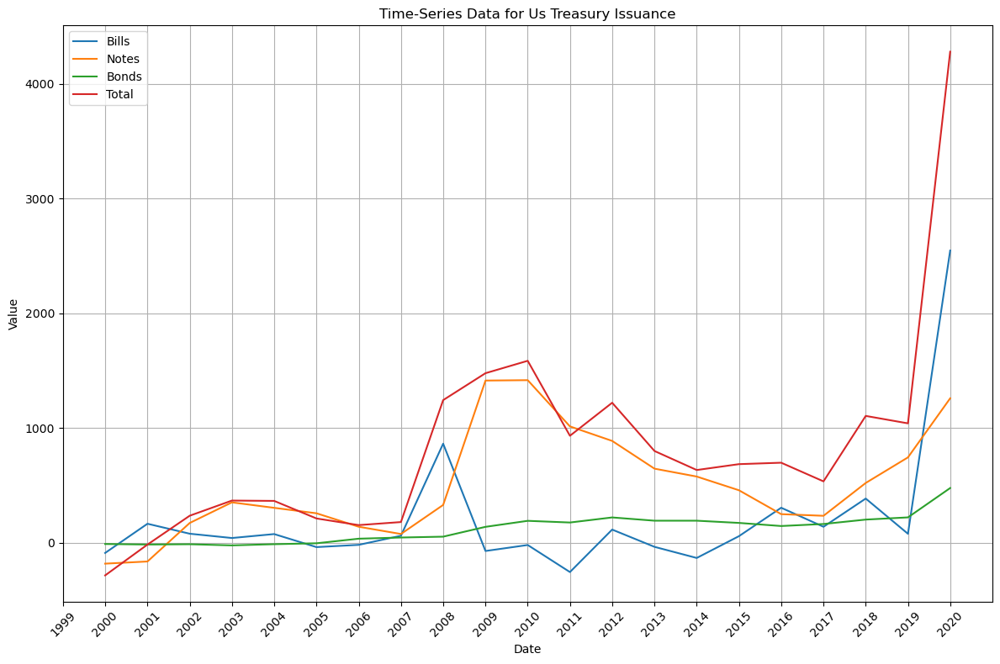

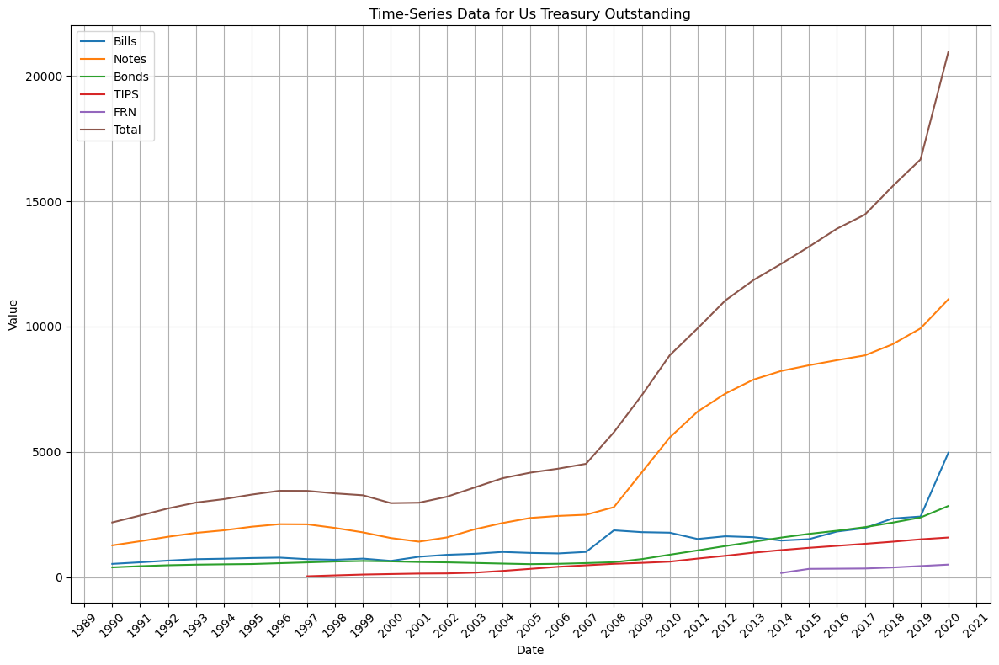

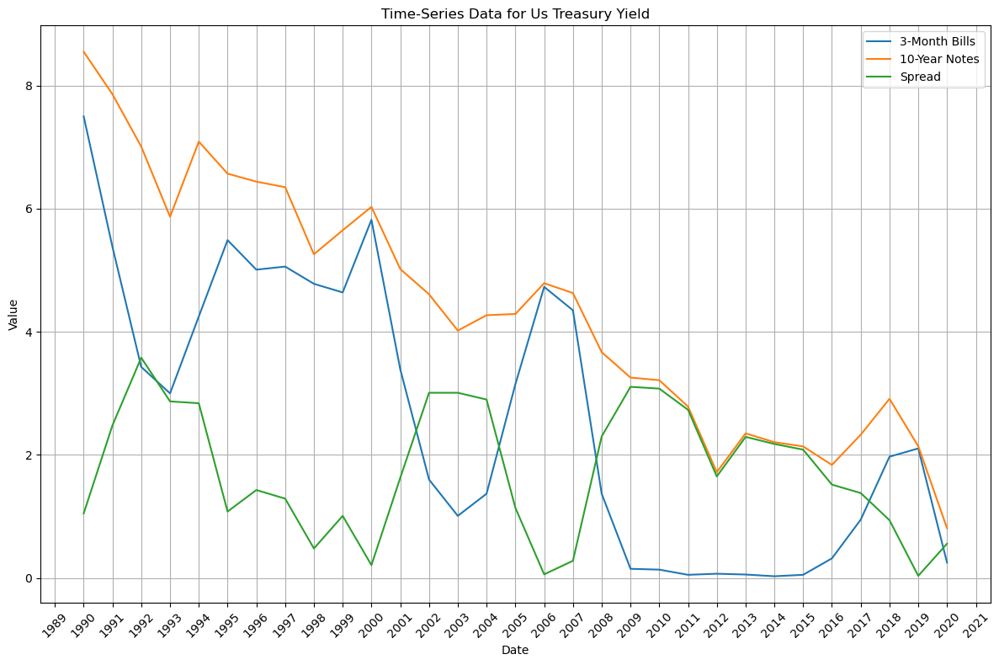

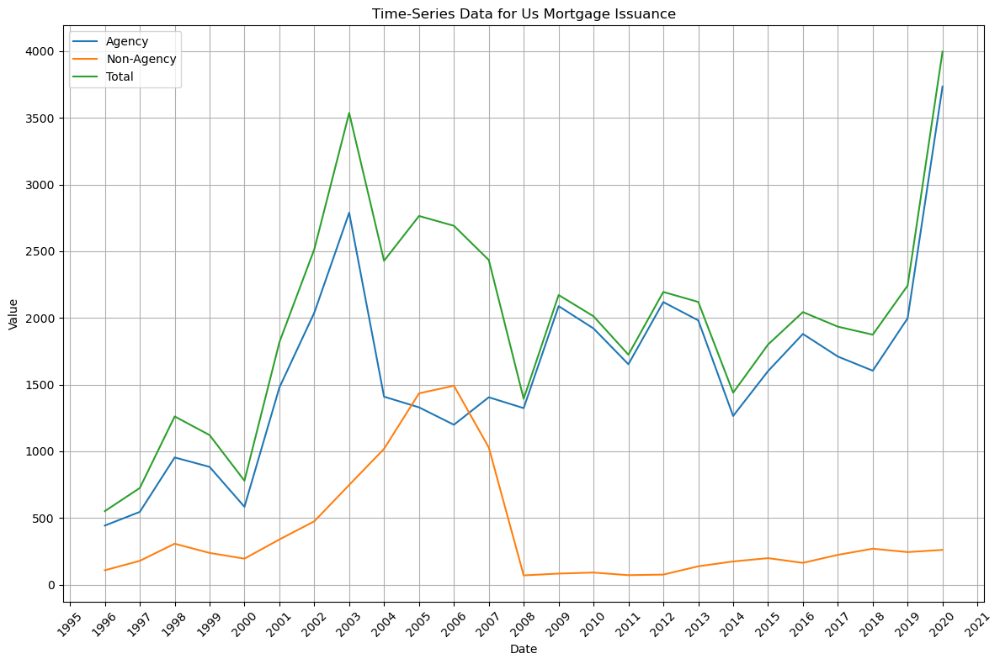

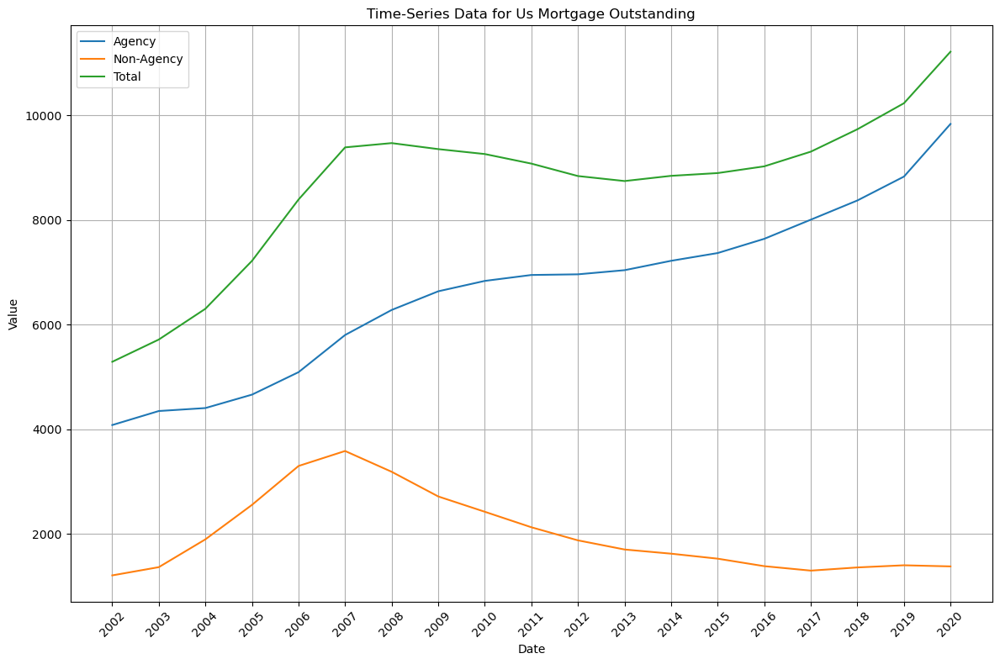

...

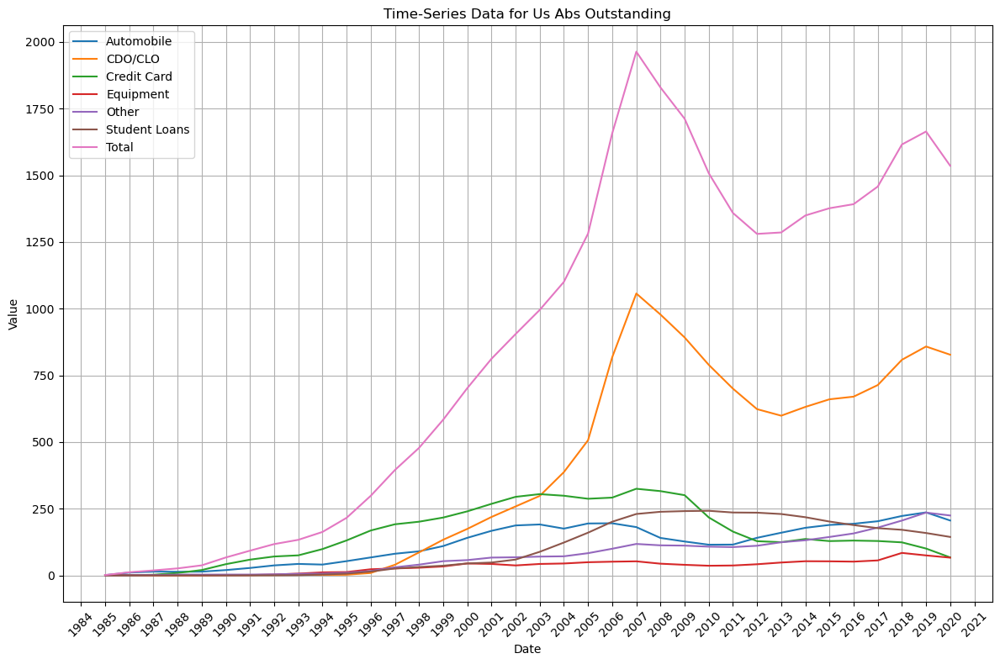

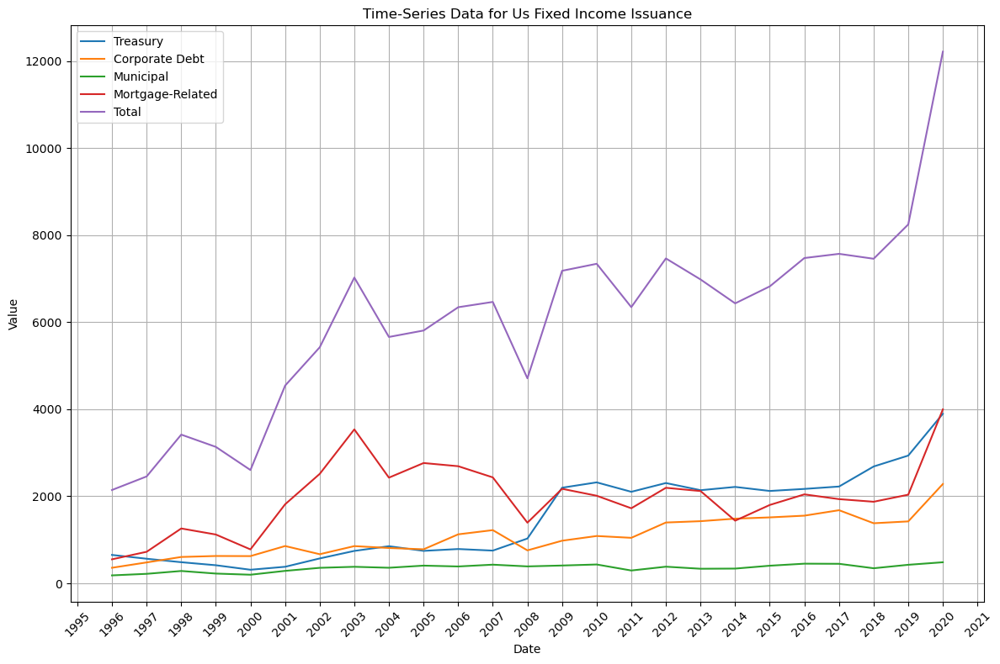

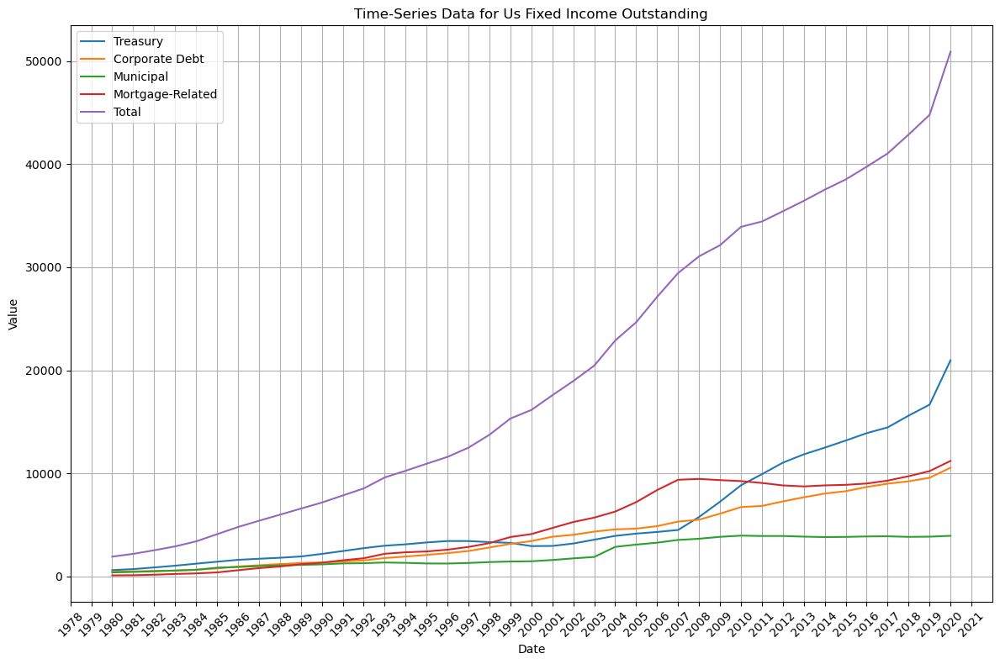

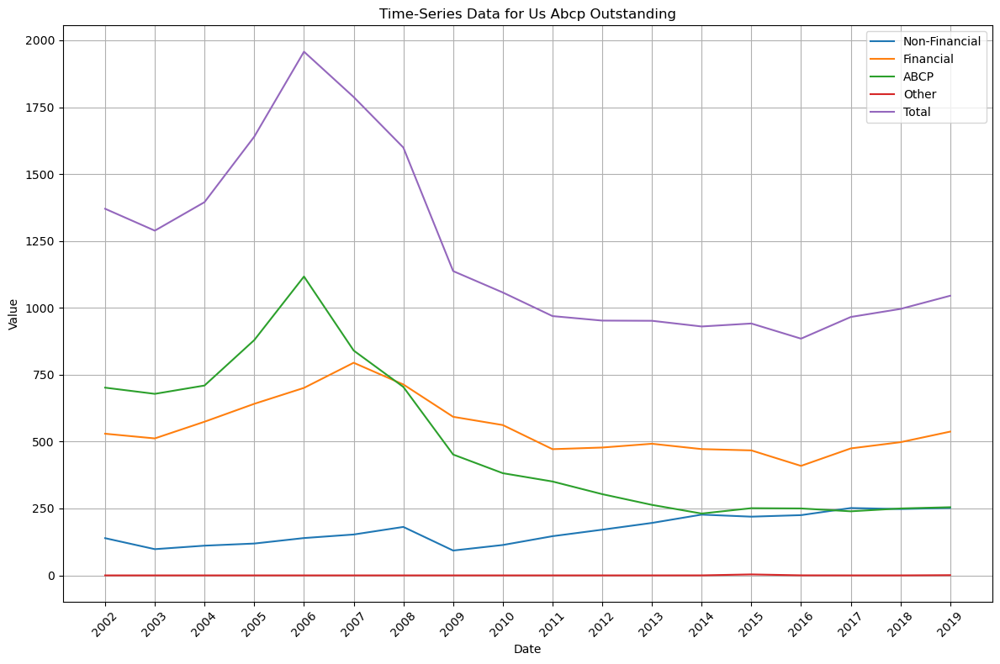

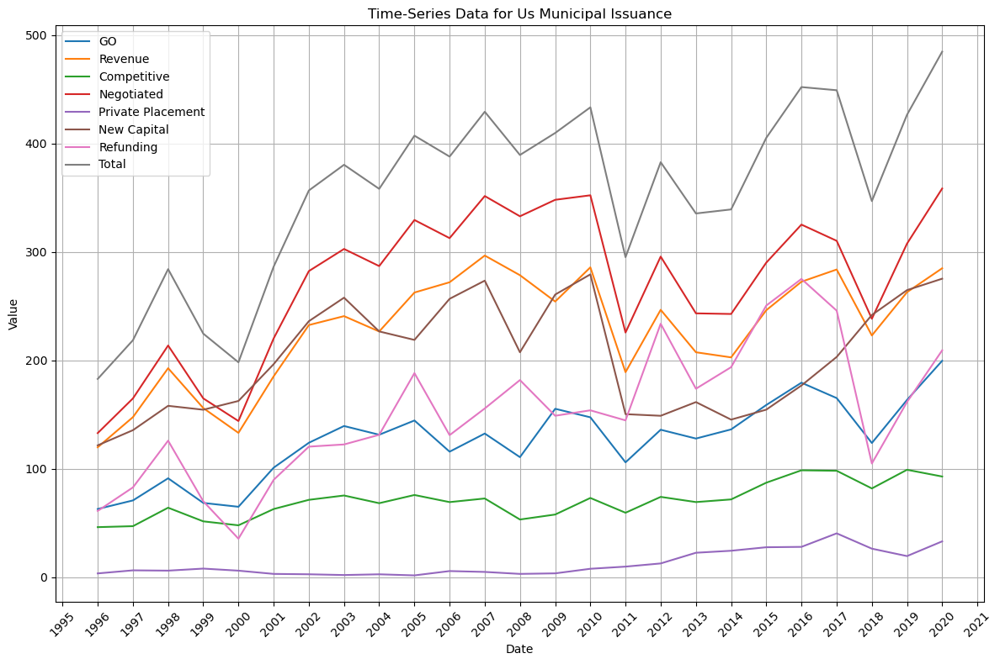

In [98]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def plot_time_series(data_dict2):
    for df_name, df in data_dict2.items():
        date_col = df.select_dtypes(include=['datetime', 'object']).columns[0]
        df_numeric = df.select_dtypes(include=['number'])
        
        if df_numeric.empty:
            print(f"No numeric data available for {df_name}")
            continue
        
        plt.figure(figsize=(12, 8))
        
        for col in df_numeric.columns:
            plt.plot(df[date_col], df_numeric[col], label=col)
        
        plt.title(f"Time-Series Data for {df_name.replace('_', ' ').title()}")
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.legend(loc='best')
        
        ax = plt.gca()
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        ax.tick_params(axis='x', rotation=45)
        
        plt.grid(True)
        plt.tight_layout()
        save_path = os.path.join("./Images/SIFMA/"+df_name+"time-series data for SIFMA.png")
        plt.savefig(save_path)
        plt.show()

# Example usage
plot_time_series(data_dict2)


## Do you see any patterns in the time-series? Is there any seasonality?

---

### 1. Treasury Issuance

**Observation:** Treasury issuance has increased significantly over time, showing pronounced surges during times of economic strain or significant changes in policy.


**Explanation:** When the government raises borrowing to fund deficits and boost the economy, Treasury issuance frequently rises during economic downturns or fiscal stimulus initiatives. These peaks correspond to things like major government expenditure programs or financial crises.

---

### 2. Treasury Outstanding

**Observation:** The U.S. government's constant borrowing is reflected in the steadily rising total number of outstanding Treasury securities.

**Explanation:** Because the government must finance spending that exceeds revenue, budget deficits are the primary cause of the ongoing rise in the amount of outstanding Treasury debt. During periods of significant fiscal stimulus and economic downturns, the rate of increase quickens.

---

### 3. Treasury Yield

**Observation:** There is no discernible seasonality in Treasury yields, although they do show cyclical behavior with periods of rising and dropping rates.

**Explanation:** Monetary policy, inflation expectations, and general economic conditions all affect Treasury yields. The Federal Reserve's cycles of tightening and relaxing, combined with investor demand for safe-haven assets, are what determine yield swings.

---

### 4. Mortgage Issuance

**Observation:** There are cyclical trends in the issuance of mortgages, with notable increases during times of low interest rates and a favourable housing market.

**Explanation:** Mortgage issuance tends to increase when interest rates are low, making borrowing more attractive. Housing booms also lead to higher issuance, while economic downturns and tighter lending standards can reduce new issuance.

---

### 5. Mortgage Outstanding

**Observation:** Mortgage debt outstanding exhibits a long-term upward trend with occasional periods of slowdown or decline, particularly during economic downturns.

**Explanation:** The accumulation of mortgage debt is generally linked to housing market dynamics, consumer borrowing trends, and interest rate levels. Economic recessions can lead to a decline in outstanding mortgage levels due to defaults, paydowns, or reduced new borrowing.

---

### 6. ABS Issuance

**Observation:** The issue of asset-backed securities (ABS) varies greatly, clearly peaking during economic expansions and contracting during downturns.

**Explanation:** The issue of ABS is directly related to consumer credit requirements, including credit cards, vehicle loans, and other securitized assets. ABS issuance volumes are influenced by interest rates, the state of the economy, and market confidence.

---

### 7. ABS Outstanding

**Observation:** The outstanding volume of ABS shows a steady increase with periods of stagnation or decline during economic slowdowns.

**Explanation:** ABS outstanding grows when issuance is high and economic conditions are stable. During economic stress, such as the financial crisis, the volume may plateau or decline due to lower new issuance and increased repayment or defaults.

---

### 8. Fixed Income Issuance

**Observation:** The issue of fixed income securities exhibits a generally rising trend with sporadic spikes, signifying higher activity under certain economic circumstances.

**Explanation:** When market conditions are favorable, including in low-interest-rate environments or when businesses seek to raise capital, fixed income issuance tends to rise across many sectors, including corporate bonds and government securities. Due to enterprises' lock-in capital during market access periods, economic uncertainty can also be the driving force behind issuance.

---



## Plot the data along with each of the macro-economic indicators that you selected? Are there any patterns that you can observe? Give a brief explanation for your findings


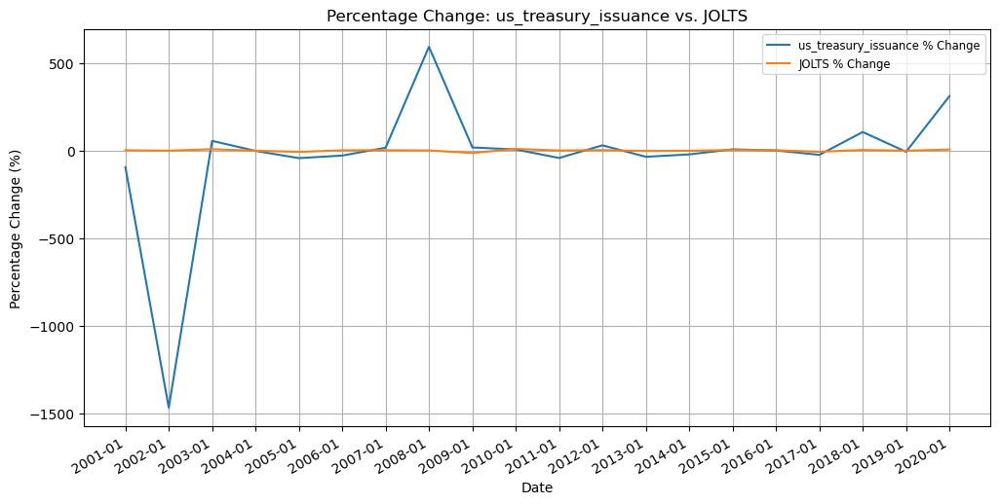

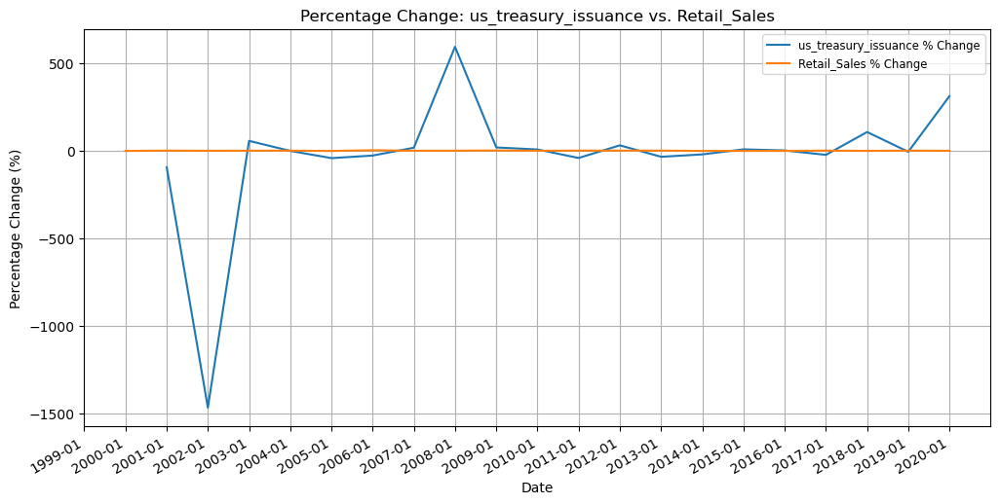

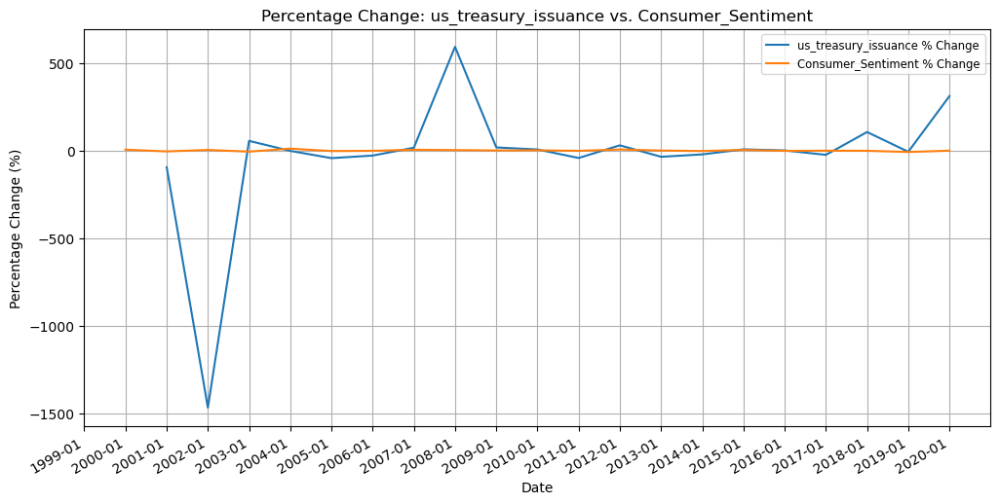

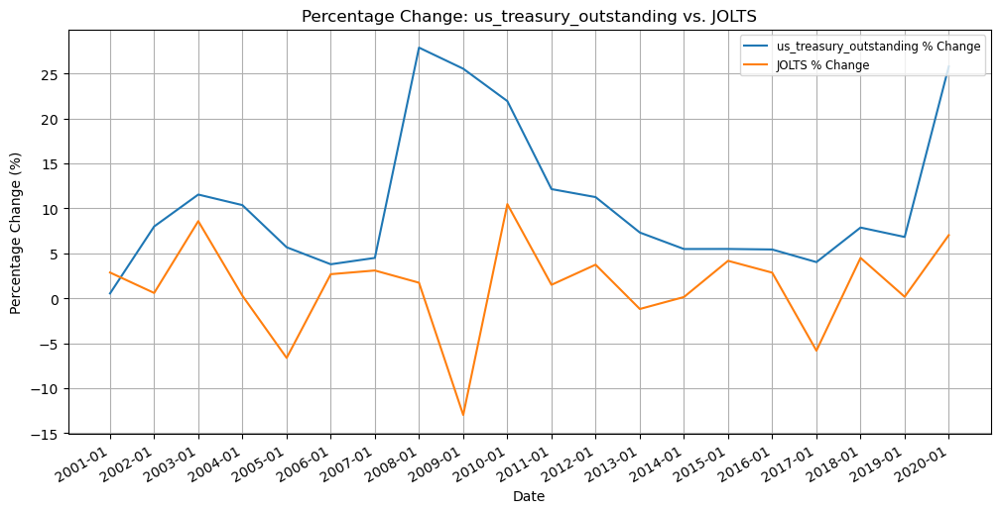

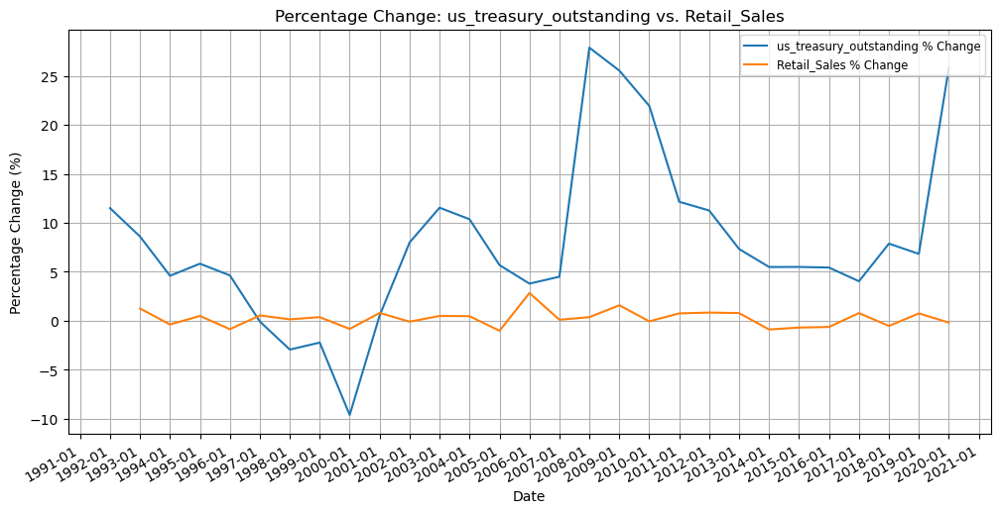

...

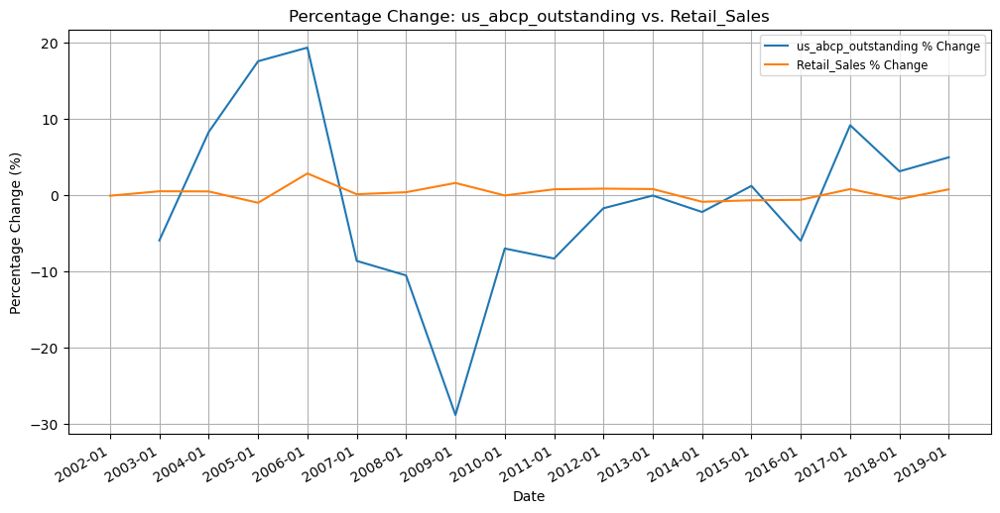

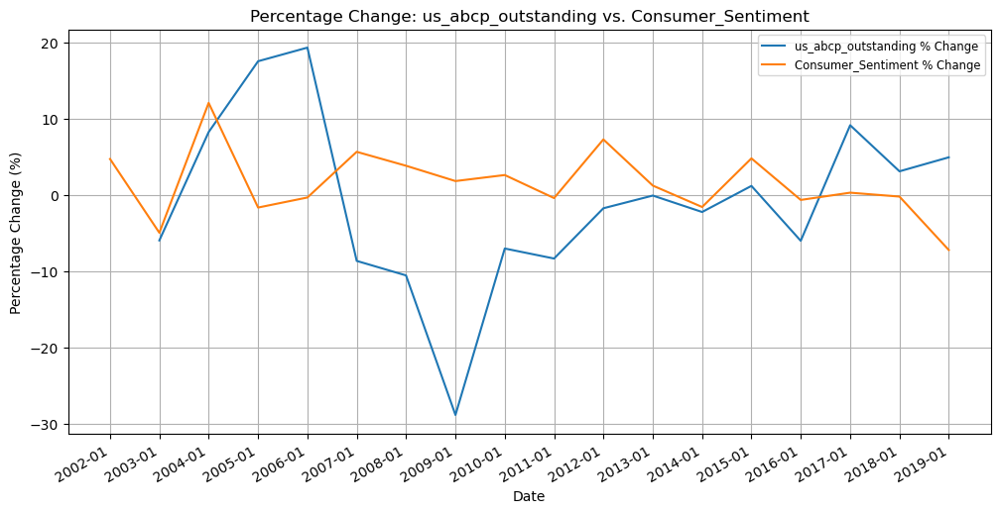

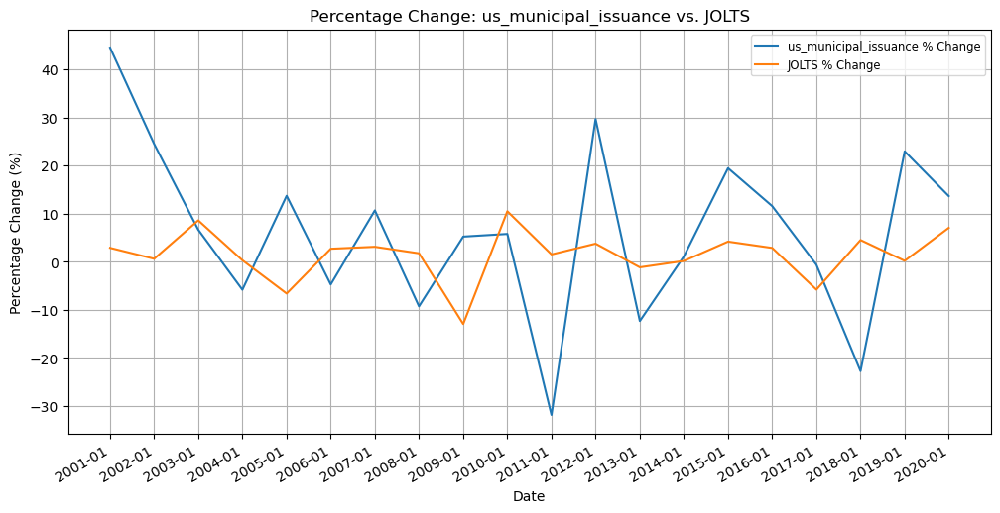

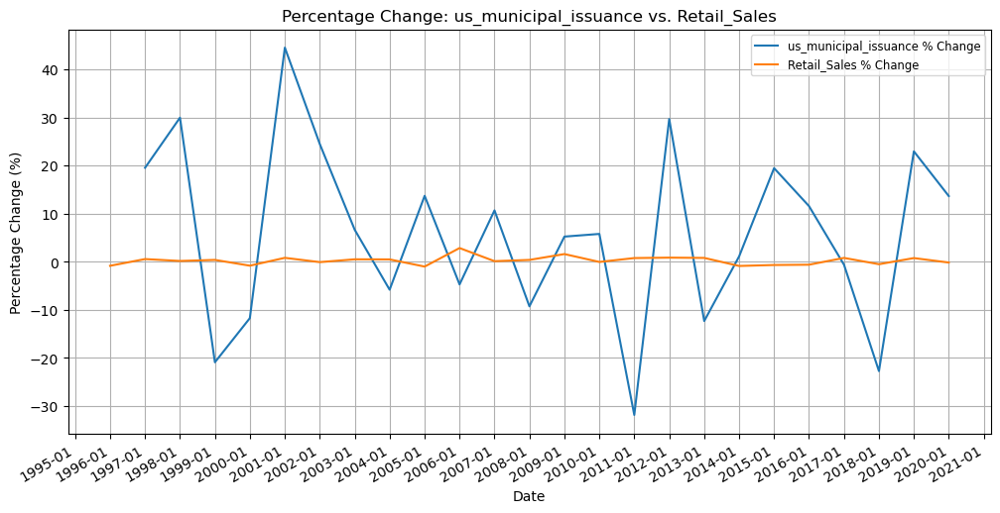

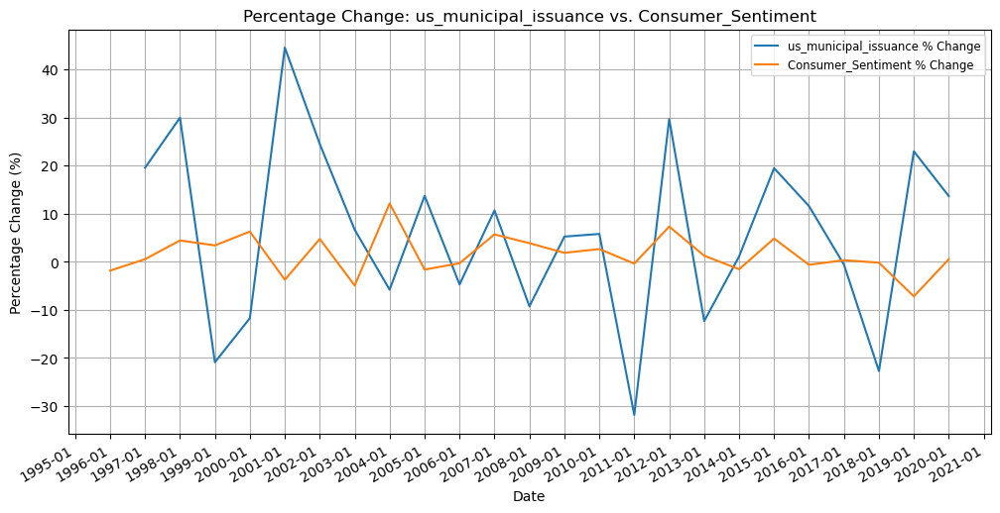

In [99]:
plot_individual_macros_with_market_pct_change(data_dict2, indicator_dict)

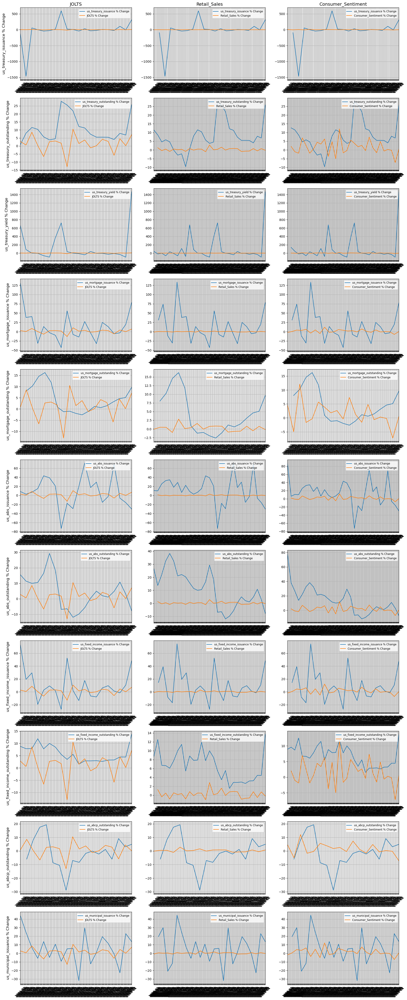

In [100]:
plot_3x10_macros_with_market_pct_change(data_dict2, indicator_dict)

---

## Relationship Between Macroeconomic Indicators and Financial Markets (2012-2021)

### 1. Job Openings: Total Nonfarm (JOLTS)

**Treasury Issuance:** Higher job openings often align with increased Treasury issuance, indicating a link between labor market strength and government borrowing needs.


**Treasury Outstanding:** Fluctuations in Treasury Outstanding are less consistent with JOLTS, suggesting short-term labor changes don't significantly impact overall debt levels.


**Treasury Yield:** Little correlation exists, implying Treasury yields are driven by broader economic and monetary factors rather than labor market conditions.


**Mortgage Issuance:** Increased job openings moderately correlate with higher mortgage issuance, reflecting boosted consumer confidence and home-buying activity.


**Mortgage Outstanding:** Similar to issuance, higher JOLTS align with increased mortgage borrowing, supported by a stronger labor market.


**ABS Issuance & Outstanding:** There's a noticeable correlation, with better job markets driving higher ABS issuance, likely due to increased consumer credit.


**Fixed Income Issuance & Outstanding:** The relationship is mixed, indicating other factors like interest rates or corporate earnings have more influence.

### 2. Consumer Sentiment

**Treasury Issuance:** Positive sentiment may reduce Treasury issuance needs, while lower sentiment can lead to increased government borrowing to support the economy.


**Treasury Outstanding:** Less sensitive to consumer sentiment changes, showing overall debt levels remain stable despite mood shifts.


**Treasury Yield:** Minimal correlation, suggesting yields are more affected by inflation expectations and Federal Reserve policies.


**Mortgage Issuance:** Strong positive sentiment generally boosts mortgage issuance, as confident consumers are more likely to buy homes.


**Mortgage Outstanding:** Higher sentiment supports increased mortgage borrowing, maintaining activity in the housing sector.


**ABS Issuance & Outstanding:** Better sentiment tends to drive higher ABS issuance and outstanding levels, reflecting increased consumer borrowing.


**Fixed Income Issuance & Outstanding:** Mixed relationships indicate broader factors influence fixed income markets beyond just consumer sentiment.


### 3. Retail Sales

**Treasury Issuance:** Weak correlation, implying retail sales don't significantly impact government borrowing needs.


**Treasury Outstanding:** Little to no correlation, indicating overall debt levels aren’t directly influenced by retail activity.


**Treasury Yield:** No strong relationship, as yields are more influenced by factors like inflation and central bank policies.


**Mortgage Issuance:** Moderate correlation, with strong retail sales signaling a healthy economy that supports more home buying and mortgage borrowing.


**Mortgage Outstanding:** Similar to issuance, sustained retail activity supports ongoing mortgage borrowing.


**ABS Issuance & Outstanding:** Mixed correlations suggest retail sales influence consumer credit and ABS markets, but other factors also play roles.


**Fixed Income Issuance & Outstanding:** No strong or consistent correlation, indicating these markets are driven by broader economic and financial factors.


---


## What is the correlation across various securities in that particular market (say across various treasury based on tenor)?

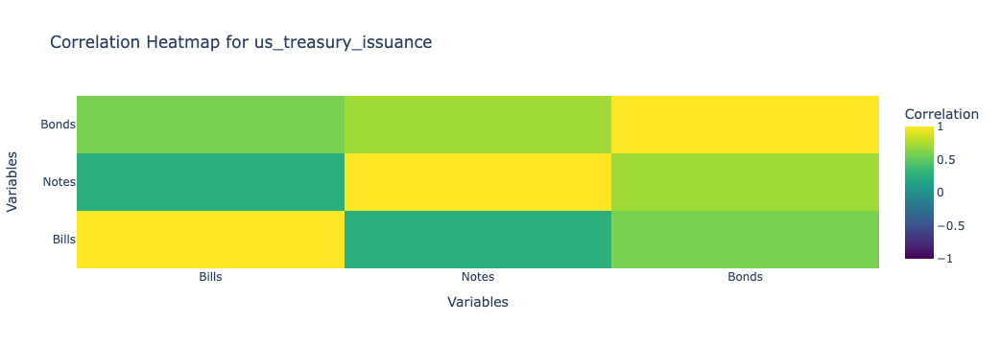

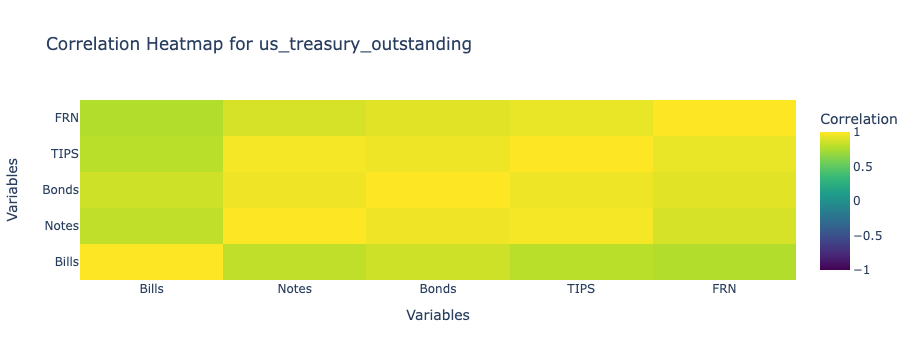

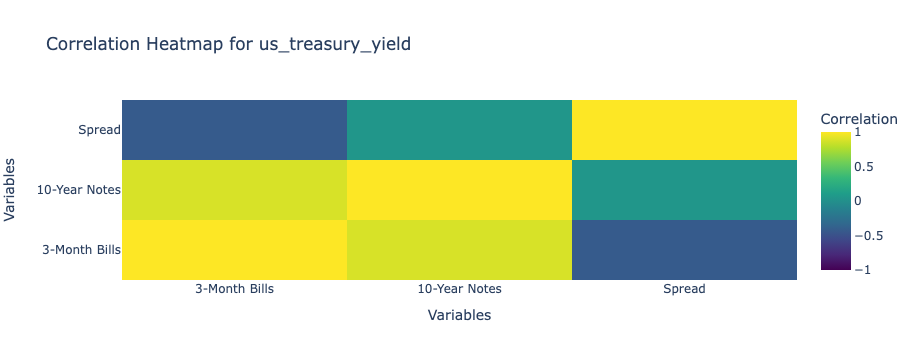

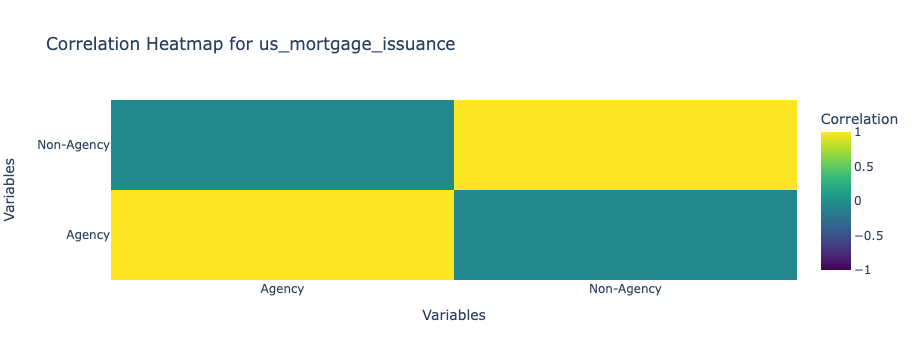

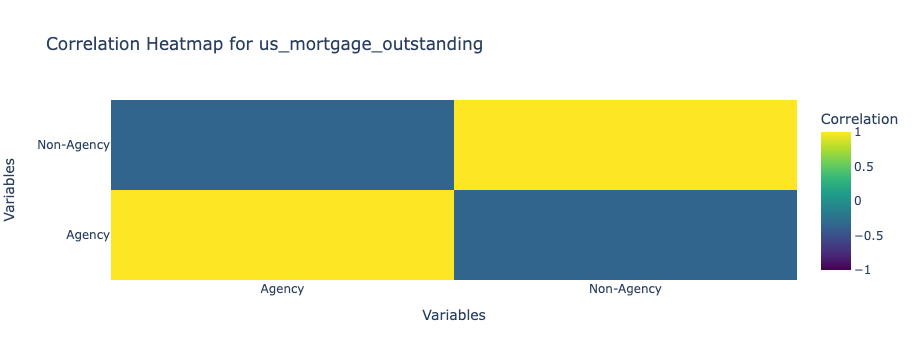

...

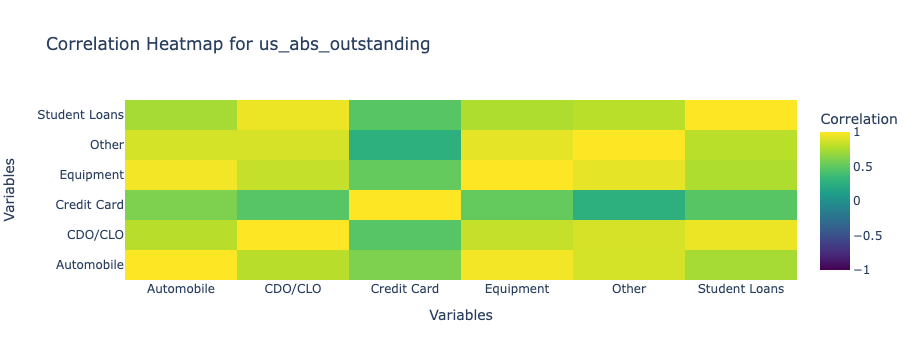

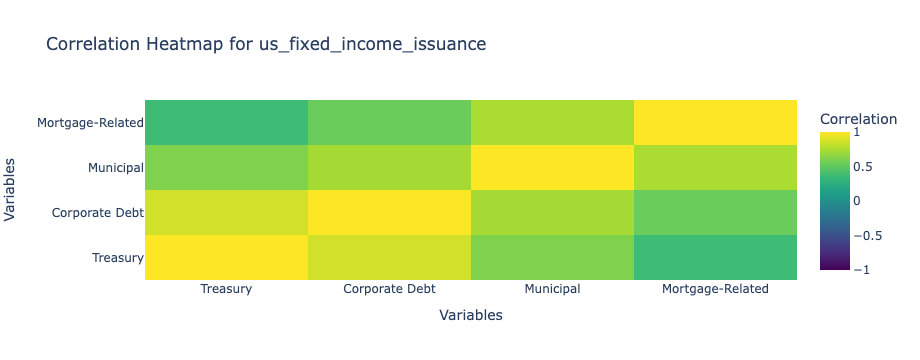

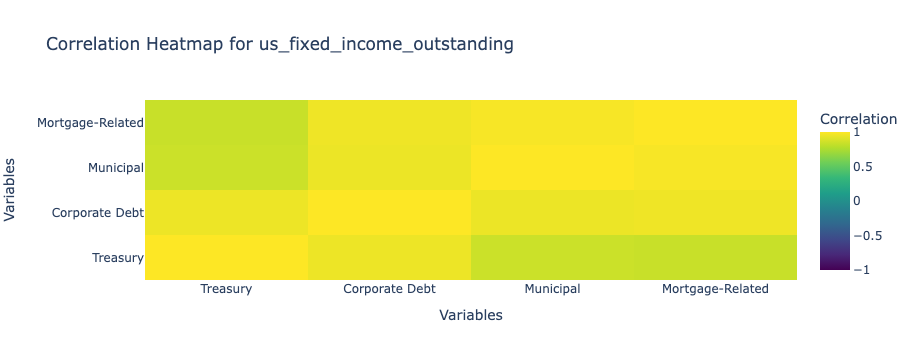

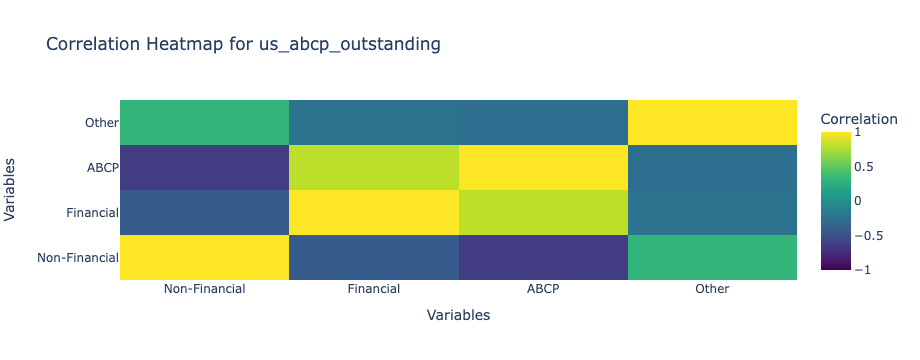

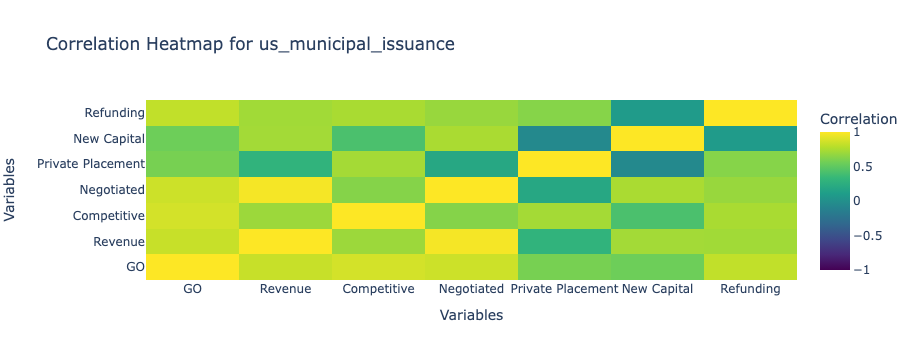

In [101]:
# calculate correlation and plot heatmap
plot_individual_correlation_heatmaps(data_dict2)

## What is the correlation in the trading activity across various security markets (consider the aggregate trading volume in each security market for the cross-market correlations)? Discuss your observations

'Total' column not found in us_treasury_yield. Skipping...


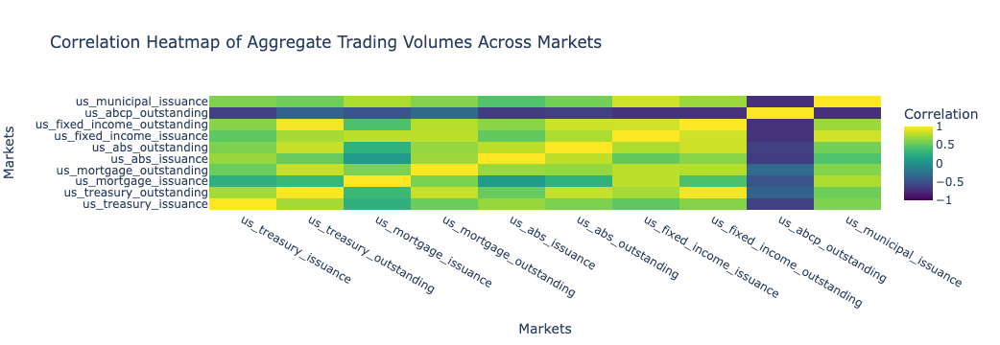

In [102]:
plot_total_trading_volume_heatmap(data_dict2)

---

## Observations and Analysis on Various Financial Metrics

### 1. Treasury Issuance Correlations

**Observations:** Moderately correlated with Treasury outstanding and fixed income issuance; weaker with mortgages.


**Potential Explanation:** Treasury issuance aligns with overall debt markets, while mortgages are more housing-driven.

---

### 2. Treasury Outstanding Correlations

**Observations:** Strong correlation with Treasury issuance and fixed income outstanding; moderate with mortgages and ABS.

**Potential Explanation:** Government borrowing increases outstanding Treasuries, influencing broader debt markets.

---

### 3. Treasury Yield Correlations

**Observations:** Yields typically inversely correlate with issuance; influenced by macroeconomic factors.

**Potential Explanation:** Yields respond to inflation and policy more than directly to issuance volumes.

---

### 4. Mortgage Issuance Correlations

**Observations:** Moderately correlated with mortgage outstanding, ABS issuance, and fixed income issuance.

**Potential Explanation:** Mortgage issuance reflects housing demand, aligning with other credit markets.

---

### 5. Mortgage Outstanding Correlations

**Observations:** Strong correlation with mortgage issuance; moderate with ABS outstanding.

**Potential Explanation:** Mortgage balances grow with issuance, often tied to ABS markets.

---

### 6. ABS Issuance Correlations

**Observations:** Strongly correlated with ABS outstanding; moderate with mortgage issuance.

**Potential Explanation:** ABS issuance is directly linked to outstanding volumes, often backed by mortgages.

---

### 7. ABS Outstanding Correlations

**Observation:** Strong correlation with ABS issuance; moderate with mortgage metrics.

**Explanation:** ABS markets closely track issuance, especially for mortgage-backed securities.

---

### 8. Fixed Income Issuance Correlations

**Observation:** Strong correlation with fixed income outstanding; moderate with Treasury and mortgage issuances.

**Explanation:** Fixed income issuance influences overall debt markets, reflecting broader economic conditions.

---



## Plot the issuance and outstanding for each market against the trading volume in that market. Discuss your observations briefly

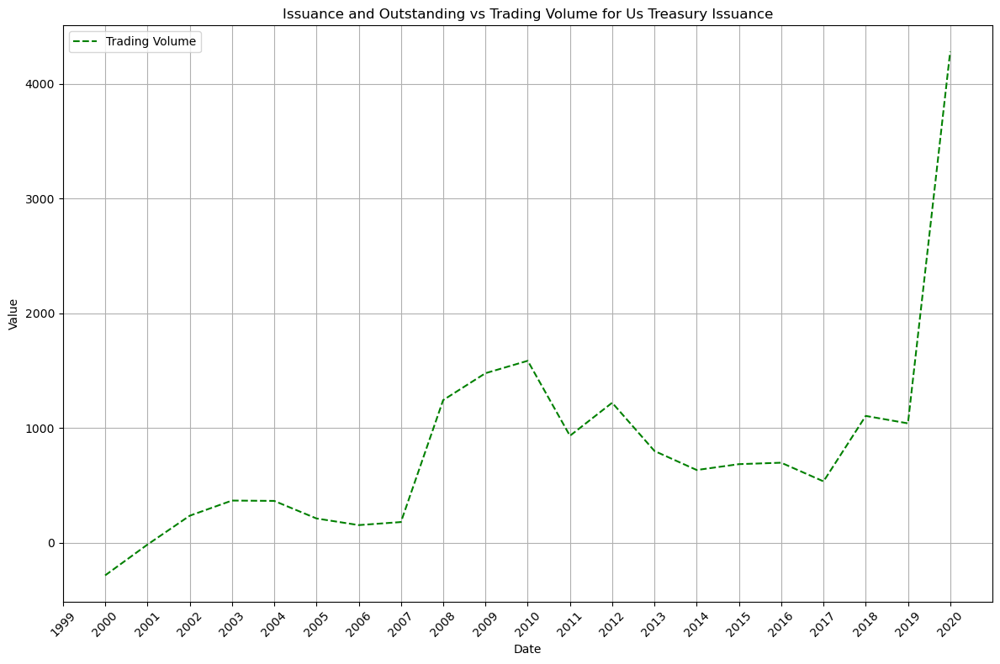

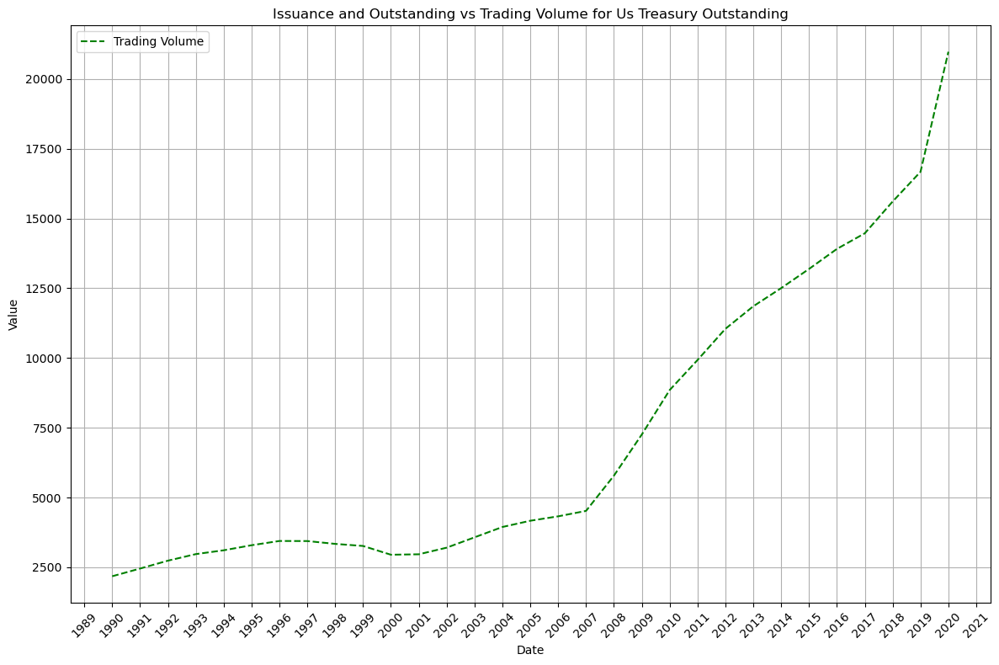

'Total' column not found in us_treasury_yield. Skipping...


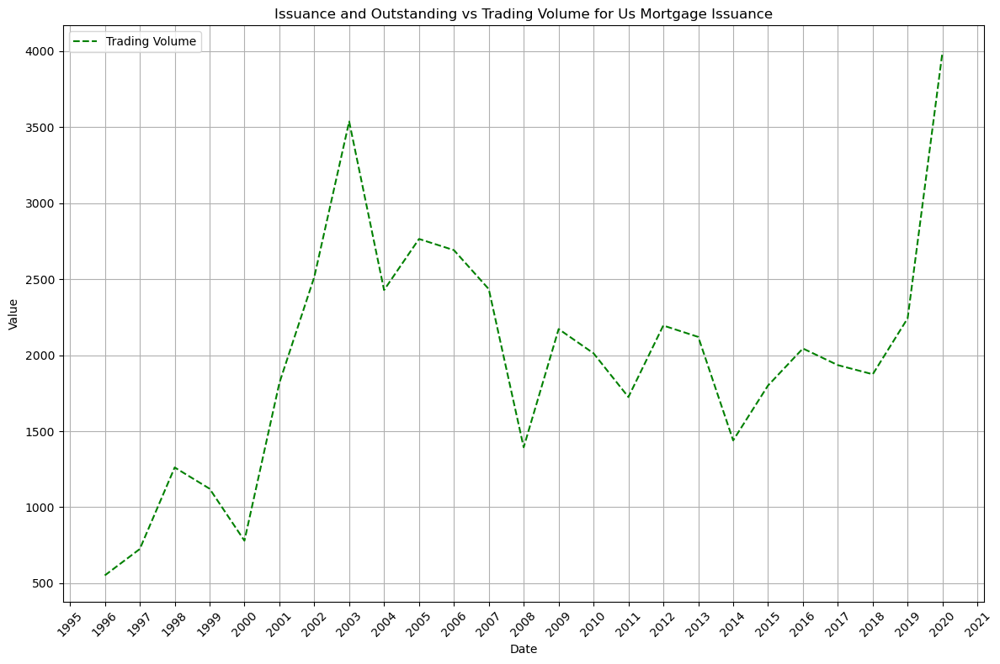

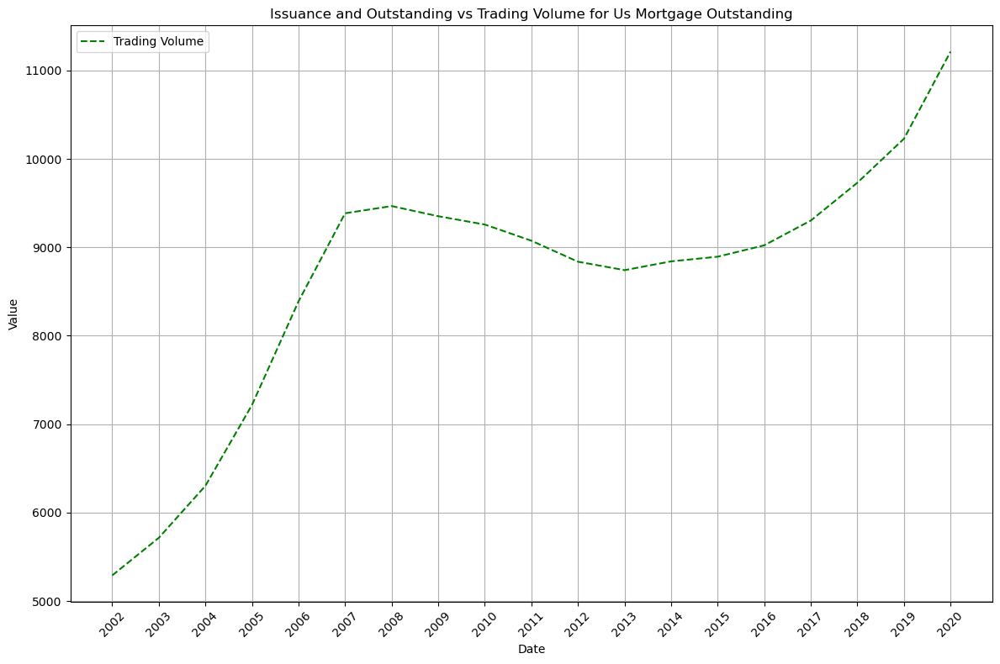

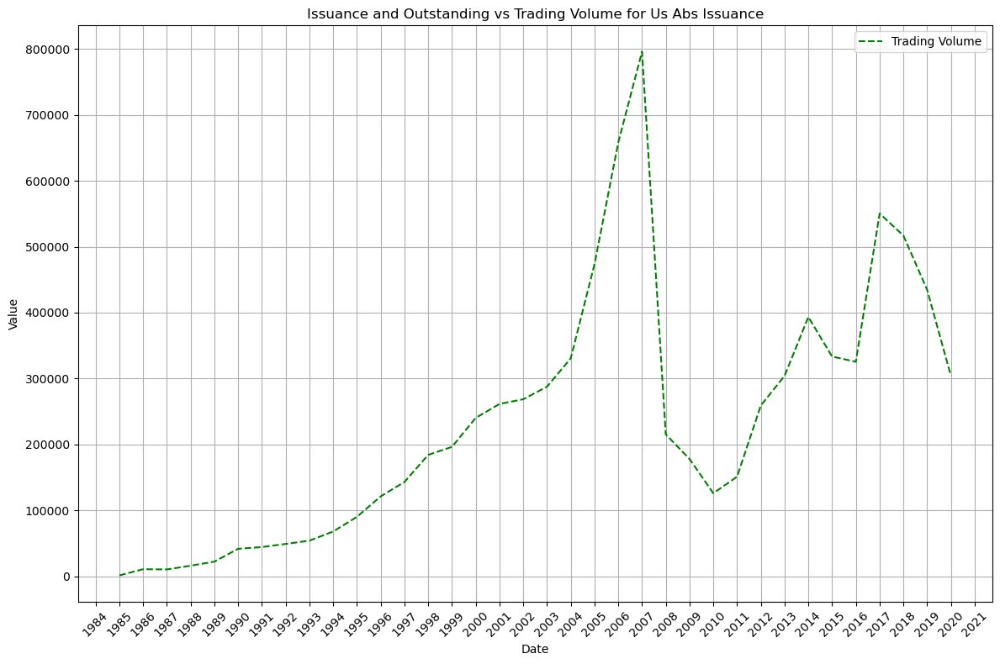

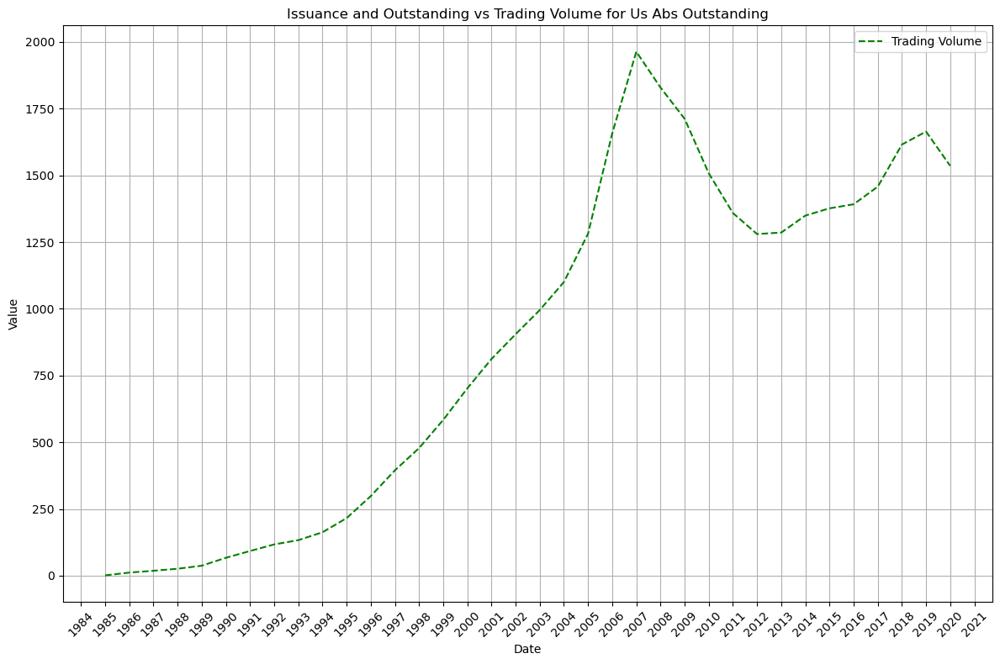

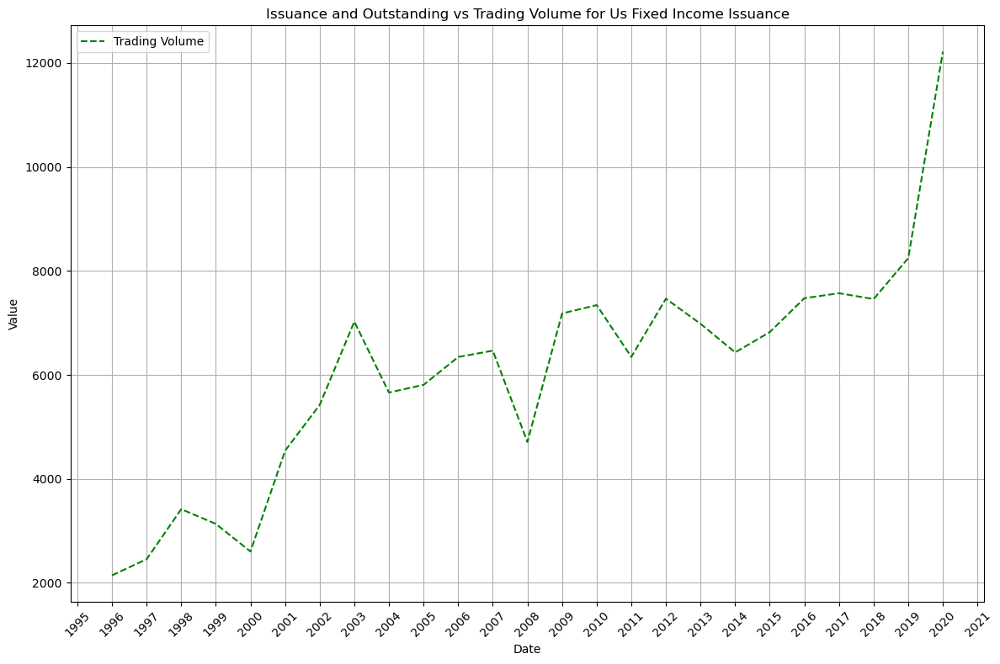

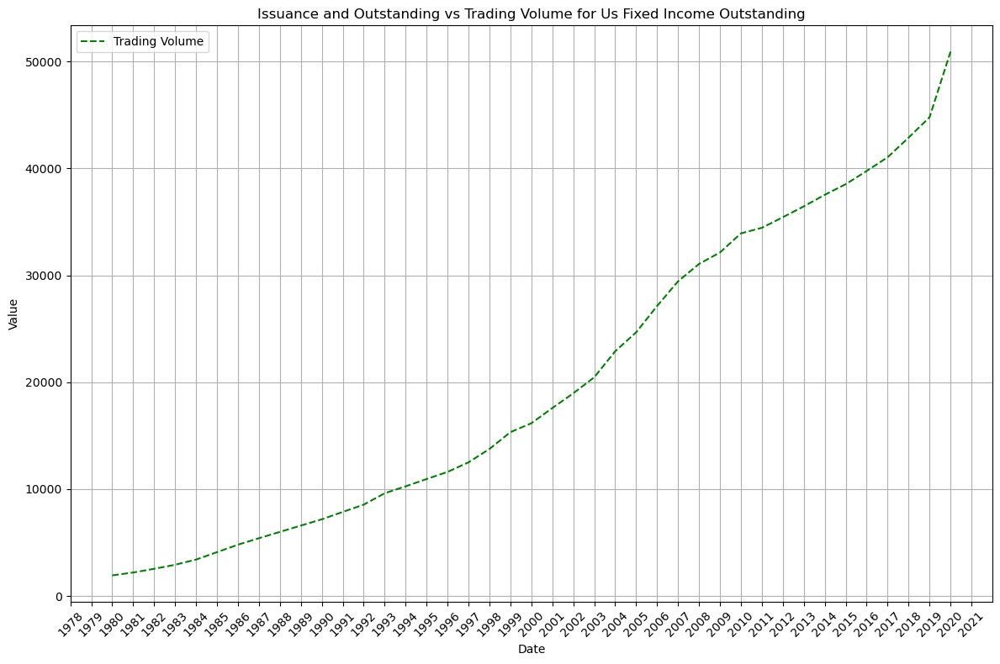

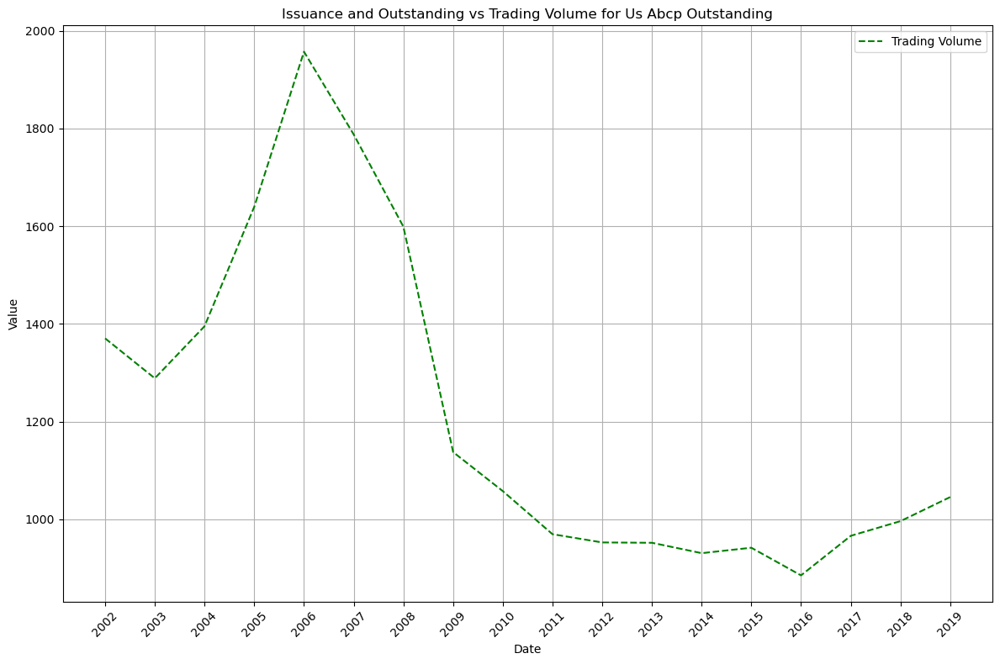

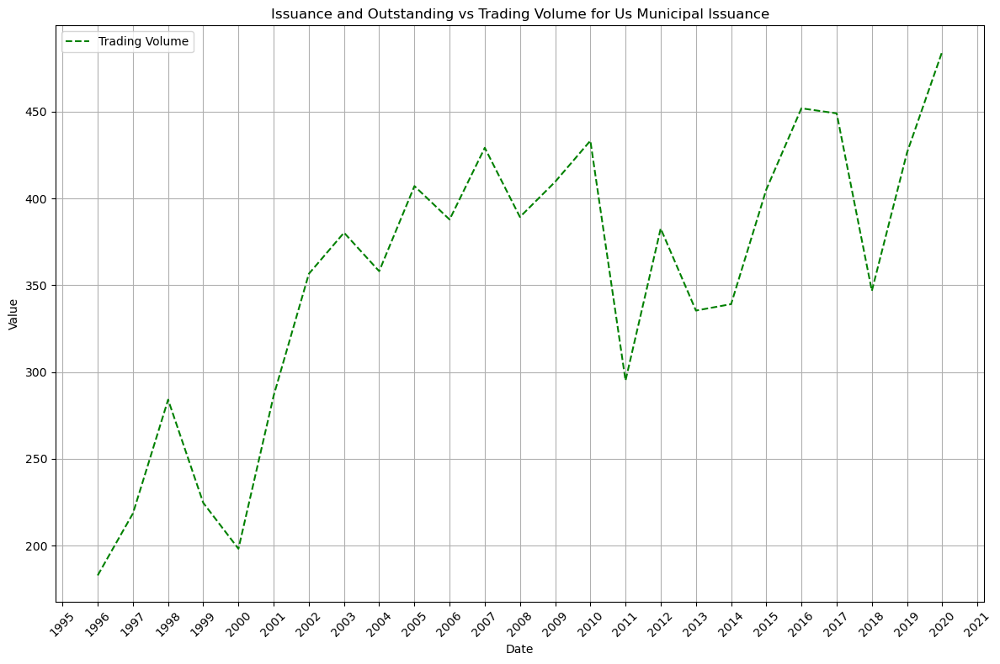

In [103]:
# code for plotting here
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def plot_issuance_outstanding_vs_trading_volume(data_dict2):
    for df_name, df in data_dict2.items():
        # Assuming the 'Total' column represents trading volume
        if 'Total' not in df.columns:
            print(f"'Total' column not found in {df_name}. Skipping...")
            continue
        
        date_col = df.select_dtypes(include=['datetime', 'object']).columns[0]
        df_numeric = df.select_dtypes(include=['number'])
        
        if df_numeric.empty:
            print(f"No numeric data available for {df_name}")
            continue
        
        plt.figure(figsize=(12, 8))
        
        # Plot Issuance and Outstanding
        if 'Issuance' in df_numeric.columns:
            plt.plot(df[date_col], df_numeric['Issuance'], label='Issuance', color='blue')
        if 'Outstanding' in df_numeric.columns:
            plt.plot(df[date_col], df_numeric['Outstanding'], label='Outstanding', color='orange')
        
        # Plot Trading Volume
        plt.plot(df[date_col], df['Total'], label='Trading Volume', color='green', linestyle='--')
        
        plt.title(f"Issuance and Outstanding vs Trading Volume for {df_name.replace('_', ' ').title()}")
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.legend(loc='best')
        
        ax = plt.gca()
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        ax.tick_params(axis='x', rotation=45)
        
        plt.grid(True)
        plt.tight_layout()
        save_path = os.path.join("./Images/issuance and outstanding/"+df_name+".png")
        plt.savefig(save_path)
        plt.show()

# Example usage
plot_issuance_outstanding_vs_trading_volume(data_dict2)


# Observations

---

## US Marketable Treasury Issuance, Outstanding, and Interest Rates:
Treasury issuance and outstanding have shown a consistent upward trend, with notable spikes in issuance during periods of economic stress (e.g., financial crises). Interest rates influence issuance volumes but are not shown in the plot.

---

## US MBS Issuance and Outstanding:
Mortgage-Backed Securities (MBS) issuance and outstanding have grown steadily, with periodic surges, particularly during periods of lower interest rates that encourage refinancing and home purchases.

---

## US ABS Issuance and Outstanding:
Asset-Backed Securities (ABS) issuance spiked around the financial crisis and has since seen fluctuations. Outstanding volumes are more stable, reflecting the long-term nature of the underlying assets.

---

## US Fixed Income Issuance and Outstanding:
Fixed income issuance and outstanding have grown consistently, with issuance spikes in response to economic events, indicating increased borrowing needs during such times.

---

## US ABCP and CP Outstanding:
Asset-Backed Commercial Paper (ABCP) and Commercial Paper (CP) outstanding show sharp declines during crises, particularly evident during the 2008 financial crisis, followed by a more gradual recovery.

---

## US Municipal Issuance:
Municipal issuance has been volatile, with peaks in issuance often correlating with periods of fiscal stimulus or infrastructure spending initiatives.

---

## US Corporate Bond Issuance: 
Corporate bond issuance has steadily increased, with significant spikes during low-interest-rate periods, allowing corporations to refinance debt or raise capital cheaply.

